In [1]:
# kernel : R_edgeR
library(dplyr)
library(Seurat)
library(edgeR)
library(ggplot2)
library(tidyr)
library(ggpubr)  # For p-value annotation



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Warning message:
“package ‘Seurat’ was built under R version 4.4.1”
Loading required package: SeuratObject

Warning message:
“package ‘SeuratObject’ was built under R version 4.4.1”
Loading required package: sp

Warning message:
“package ‘sp’ was built under R version 4.4.1”
‘SeuratObject’ was built with package ‘Matrix’ 1.6.5 but the current
version is 1.7.1; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t


Loading required package: limma

Warning message:
“package ‘ggpubr’ was built under R version 4.4.1”


In [ ]:
BiocManager::install("SingleR")


In [73]:
LoadXenium2<-function (data.dir, fov = "fov", assay = "Xenium") 
{
    data <- ReadXenium(data.dir = data.dir, type = c("centroids", 
        "segmentations"), )
    segmentations.data <- list(centroids = CreateCentroids(data$centroids), 
        segmentation = CreateSegmentation(data$segmentations))
    coords <- CreateFOV(coords = segmentations.data, type = c("segmentation", 
        "centroids"), molecules = data$microns, assay = assay)
    xenium.obj <- CreateSeuratObject(counts = data$matrix[["Gene Expression"]], 
        assay = assay)
    xenium.obj[["ControlCodeword"]] <- CreateAssayObject(counts = data$matrix[["Negative Control Codeword"]])
    xenium.obj[["ControlProbe"]] <- CreateAssayObject(counts = data$matrix[["Negative Control Probe"]])
    xenium.obj[[fov]] <- coords
    return(xenium.obj)
}


# Function to plot gene expression across predicted cell types
plot_gene_expression <- function(seurat_obj, genes) {
  for (gene in genes) {
    # Extract expression matrix
    expr_matrix <- as.data.frame(GetAssayData(seurat_obj, slot = "counts"))
    
    # Check if the gene is present in the dataset
    if (!(gene %in% rownames(expr_matrix))) {
      message(paste("Warning: Gene", gene, "not found in the dataset. Skipping..."))
      next
    }
    
    # Identify cells expressing the gene (nonzero counts)
    expr_cells <- colnames(expr_matrix)[expr_matrix[gene, ] > 0]
    
    # Create a data frame for plotting
    expr_df <- data.frame(
      cell = expr_cells,
      predicted.id = seurat_obj$predicted.id[expr_cells]
    )
    
    # Count the number of cells per `predicted.id`
    expr_counts <- expr_df %>%
      group_by(predicted.id) %>%
      summarise(num_cells = n())
    
    # Generate the plot
    p <- ggplot(expr_counts, aes(x = predicted.id, y = num_cells, fill = predicted.id)) +
      geom_bar(stat = "identity") +
      theme_minimal() +
      labs(x = "Cell Type (predicted.id)", y = "Number of Expressing Cells",
           title = paste("Cells Expressing", gene)) +
      theme(axis.text.x = element_text(angle = 45, hjust = 1))
    
    # Print the plot
    print(p)
  }
}


# Function to generate box plots for multiple genes, filtering out zero-expression cells
plot_boxplot_gene_expression <- function(seurat_obj, genes) {
  options(repr.plot.width = 15, repr.plot.height = 5) # Adjust plot size
  
  for (gene in genes) {
    if (!(gene %in% rownames(seurat_obj))) {
      message(paste("Warning: Gene", gene, "not found in the dataset. Skipping..."))
      next
    }
    
    # Extract expression data
    expr_data <- FetchData(seurat_obj, vars = c(gene, "predicted.id"))
    
    # Rename columns for clarity
    colnames(expr_data) <- c("Expression", "CellType")
    
    # Filter out cells with zero expression
    expr_data <- expr_data %>% filter(Expression > 0)
    
    if (nrow(expr_data) == 0) {
      message(paste("No nonzero expression found for", gene, "- skipping plot."))
      next
    }
    
    # Generate box plot
    p <- ggplot(expr_data, aes(x = CellType, y = Expression, fill = CellType)) +
      geom_boxplot(outlier.shape = NA) + # Box plot without outliers
      geom_jitter(width = 0.2, alpha = 0.4, size = 1) + # Add jitter for visibility
      theme_minimal() +
      labs(title = paste("Expression of", gene), x = "Cell Type (predicted.id)", y = "Expression Level") +
      theme(axis.text.x = element_text(angle = 45, hjust = 1), legend.position = "none") # Rotate x-axis labels
    
    print(p)  # Print each plot
  }
}



# Function to generate violin plots for multiple genes, filtering out zero-expression cells
plot_violin_gene_expression <- function(seurat_obj, genes) {
  options(repr.plot.width = 15, repr.plot.height = 5) # Adjust plot size

  for (gene in genes) {
    if (!(gene %in% rownames(seurat_obj))) {
      message(paste("Warning: Gene", gene, "not found in the dataset. Skipping..."))
      next
    }
    
    # Extract expression data
    expr_data <- FetchData(seurat_obj, vars = c(gene, "predicted.id"))
    
    # Rename columns for clarity
    colnames(expr_data) <- c("Expression", "CellType")
    
    # Filter out cells with zero expression
    expr_data <- expr_data %>% filter(Expression > 0)
    
    if (nrow(expr_data) == 0) {
      message(paste("No nonzero expression found for", gene, "- skipping plot."))
      next
    }

    # Generate violin plot
    p <- ggplot(expr_data, aes(x = CellType, y = Expression, fill = CellType)) +
      geom_violin(scale = "width", trim = TRUE) + # Violin plot
      geom_jitter(width = 0.2, alpha = 0.4, size = 1) + # Jitter for visibility
      theme_minimal() +
      labs(title = paste("Expression of", gene), x = "Cell Type (predicted.id)", y = "Expression Level") +
      theme(axis.text.x = element_text(angle = 45, hjust = 1), legend.position = "none") # Rotate x-axis labels
    
    print(p)  # Print each plot
  }
}


plot_bar_total_expression <- function(seurat_obj, genes) {
  options(repr.plot.width = 15, repr.plot.height = 5) # Adjust plot size
  
  for (gene in genes) {
    if (!(gene %in% rownames(seurat_obj))) {
      message(paste("Warning: Gene", gene, "not found in the dataset. Skipping..."))
      next
    }
    
    # Extract raw counts instead of scaled values
    expr_data <- FetchData(seurat_obj, vars = c(gene, "predicted.id"))
    
    # Rename columns for clarity
    colnames(expr_data) <- c("Expression", "CellType")
    
    # Filter out zero-expressing cells
    expr_data <- expr_data %>% filter(Expression > 0)
    
    if (nrow(expr_data) == 0) {
      message(paste("No nonzero expression found for", gene, "- skipping plot."))
      next
    }

    # Calculate total expression per cell type
    expr_summary <- expr_data %>%
      group_by(CellType) %>%
      summarise(total_exp = sum(Expression)) %>%
      arrange(desc(total_exp)) # Sort by highest total expression

    # Generate bar plot
    p <- ggplot(expr_summary, aes(x = reorder(CellType, -total_exp), y = total_exp, fill = CellType)) +
      geom_bar(stat = "identity", alpha = 0.8) +  # Bar height = total expression
      theme_minimal() +
      labs(title = paste("Total Expression of", gene), x = "Cell Type", y = "Total Expression Counts") +
      theme(axis.text.x = element_text(angle = 45, hjust = 1), legend.position = "none") # Rotate labels
    
    print(p)  # Print each plot
  }
}




# Downsample function
downsample_seurat <- function(seurat_obj, target_n_cells) {
    # Get the cell type proportions
    celltype_proportions <- table(seurat_obj$Cell_Type_Annotation) / length(seurat_obj$Cell_Type_Annotation)
    
    # Calculate the number of cells to sample from each cell type based on the proportions
    n_cells_by_type <- round(celltype_proportions * target_n_cells)
    
    # Create an empty list to store the downsampled cells for each cell type
    downsampled_cells <- list()
    
    # Loop over each cell type and sample the appropriate number of cells
    for (celltype in names(n_cells_by_type)) {
        # Get cells for the current cell type
        cells_of_type <- WhichCells(seurat_obj, expression = Cell_Type_Annotation == celltype)
        
        # Downsample if there are more cells of this type than needed
        if (length(cells_of_type) > n_cells_by_type[celltype]) {
            set.seed(111)  # For reproducibility
            sampled_cells <- sample(cells_of_type, n_cells_by_type[celltype])
        } else {
            sampled_cells <- cells_of_type  # If there are fewer cells than needed, keep all
        }
        
        # Add sampled cells to the list
        downsampled_cells[[celltype]] <- sampled_cells
    }
    
    # Combine all sampled cells
    downsampled_cells_all <- unlist(downsampled_cells)
    
    # Subset Seurat object to keep only the downsampled cells
    downsampled_seurat_obj <- subset(seurat_obj, cells = downsampled_cells_all)
    
    return(downsampled_seurat_obj)
}


# Function to plot proportion of cells expressing selected genes in different cell types
plot_gene_expression_proportion <- function(seurat_obj, genes, assay = "counts", group_by = "predicted.id") {
  # Extract expression matrix for the specified assay
  expr_matrix <- as.data.frame(GetAssayData(seurat_obj, slot = assay))
  
  # Filter for selected genes
  expr_matrix <- expr_matrix[rownames(expr_matrix) %in% genes, ]
  
  # Convert to long format, binary expression (1 = expressed, 0 = not expressed)
  expr_long <- as.data.frame(t(expr_matrix)) %>%
    mutate(cell = rownames(.)) %>%
    pivot_longer(cols = all_of(genes), names_to = "gene", values_to = "expression") %>%
    mutate(expression_binary = ifelse(expression > 0, 1, 0))  # Convert to 1 (expressed) or 0 (not)
  
  # Add predicted.id information from metadata
  expr_long$predicted.id <- seurat_obj@meta.data[[group_by]][match(expr_long$cell, rownames(seurat_obj@meta.data))]
  
  # Calculate proportion of expressing cells per cell type
  expr_counts <- expr_long %>%
    group_by(gene, predicted.id) %>%
    summarise(
      num_expressing = sum(expression_binary),
      total_cells = n(),
      prop_expressing = num_expressing / total_cells,
      .groups = "drop"
    )
  
  # Plot as a grouped bar plot (proportion)
  ggplot(expr_counts, aes(x = predicted.id, y = prop_expressing, fill = gene)) +
    geom_bar(stat = "identity", position = "dodge") +
    theme_minimal() +
    labs(x = "Cell Type (predicted.id)", y = "Proportion of Expressing Cells", 
         title = "Proportion of Cells Expressing Selected Genes") +
    theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
    scale_fill_brewer(palette = "Set2")  # Adjust colors if needed
}



library(ggplot2)
library(dplyr)
library(tidyr)
library(Matrix)

# Function to create violin and density plots based on gene classification
plot_gene_groups_density <- function(breast) {
  # Get counts data
  counts <- GetAssayData(breast, layer = "counts")
  
  # Get gene names
  gene_names <- rownames(counts)
  
  # Classify genes
  gene_group <- case_when(
    str_starts(gene_names, "gDNA") ~ "gDNA",
    str_starts(gene_names, "cuTAR") ~ "cuTAR",
    TRUE ~ "other"
  )
  
  # Split matrix into three groups
  group_df <- data.frame(
    gene = gene_names,
    group = gene_group
  )
  
  # Get gene indices for each group
  gDNA_genes <- group_df %>% filter(group == "gDNA") %>% pull(gene)
  cuTAR_genes <- group_df %>% filter(group == "cuTAR") %>% pull(gene)
  other_genes <- group_df %>% filter(group == "other") %>% pull(gene)
  
  # Sum counts per cell for each group
  cell_counts <- data.frame(
    cell = colnames(counts),
    gDNA = Matrix::colSums(counts[gDNA_genes, , drop = FALSE]),
    cuTAR = Matrix::colSums(counts[cuTAR_genes, , drop = FALSE]),
    other = Matrix::colSums(counts[other_genes, , drop = FALSE])
  )
  
  # Reshape to long format for plotting
  cell_counts_long <- pivot_longer(cell_counts, cols = c("gDNA", "cuTAR", "other"),
                                   names_to = "group", values_to = "count")
  
  # Violin plot
  v <- ggplot(cell_counts_long, aes(x = group, y = count, fill = group)) +
    geom_violin(scale = "width", trim = TRUE) +
    scale_y_log10() +
    labs(
      title = "Total RNA Counts per Cell by Gene Group",
      x = "Gene Group",
      y = "nCount_RNA (log10)"
    ) +
    theme_minimal()
  
  # Density plot
  d <- ggplot(cell_counts_long, aes(x = log10(count), color = group, fill = group)) +
    geom_density(alpha = 0.3, adjust = 1.5) +
    scale_x_log10() +
    labs(title = "Density of Counts per Cell by Gene Group",
         x = "Counts per Cell (log10)", y = "Density") +
    theme_minimal() +
    theme(text = element_text(size = 14))
  
  # Set plot dimensions
  options(repr.plot.width = 15, repr.plot.height = 6)
  
  # Return the combined plots
  return(list(violin_plot = v, density_plot = d))
}



# Breast Cancer

In [14]:
# Step 1: Read 10X data (already done)
raw_counts <- Read10X("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__BreastCancer__20250319__042625/cell_feature_matrix/")

# Step 2: Create Seurat object
Seurat_object <- CreateSeuratObject(counts = raw_counts)


10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [ ]:
# 

In [ ]:
library(arrow)
transcripts <- read_parquet("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__BreastCancer__20250319__042625/transcripts.parquet")
write.csv(transcripts, gzfile("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__BreastCancer__20250319__042625/transcripts.csv.gz"), row.names = FALSE)


In [4]:
breast <-LoadXenium2("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__BreastCancer__20250319__042625/",
                     fov="breast")

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [5]:
breast

An object of class Seurat 
541 features across 464673 samples within 3 assays 
Active assay: Xenium (480 features, 0 variable features)
 1 layer present: counts
 2 other assays present: ControlCodeword, ControlProbe
 1 spatial field of view present: breast

Warning message:
“Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead.”
Warning message:
“Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead.”


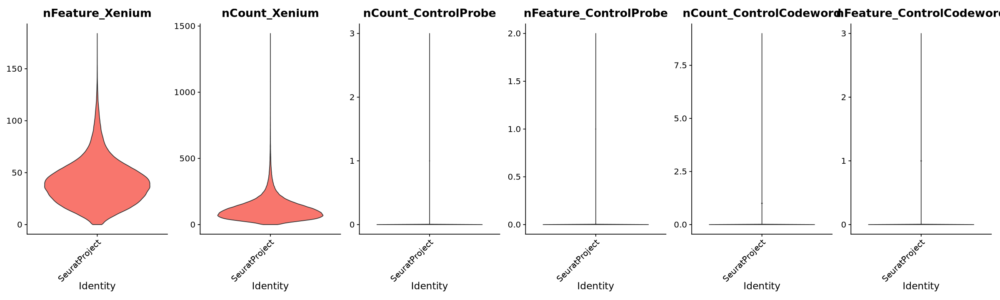

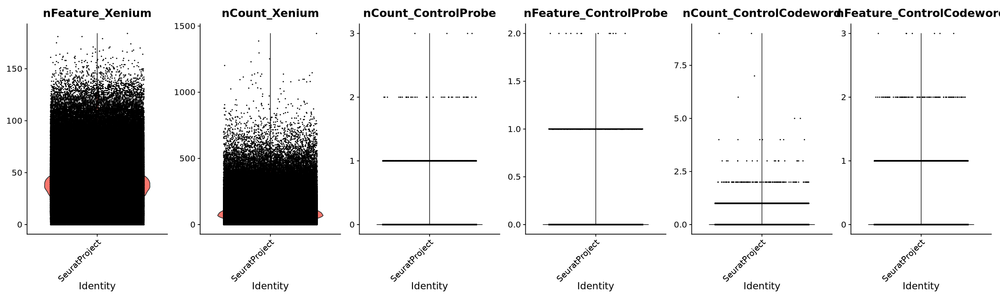

In [9]:
options(repr.plot.height = 6, repr.plot.width = 20)

VlnPlot(breast, features = c("nFeature_Xenium", "nCount_Xenium","nCount_ControlProbe","nFeature_ControlProbe",
                                "nCount_ControlCodeword","nFeature_ControlCodeword"), ncol = 6, pt.size = 0)

VlnPlot(breast, features = c("nFeature_Xenium", "nCount_Xenium","nCount_ControlProbe","nFeature_ControlProbe",
                                "nCount_ControlCodeword","nFeature_ControlCodeword"), ncol = 6, pt.size = 0.2)

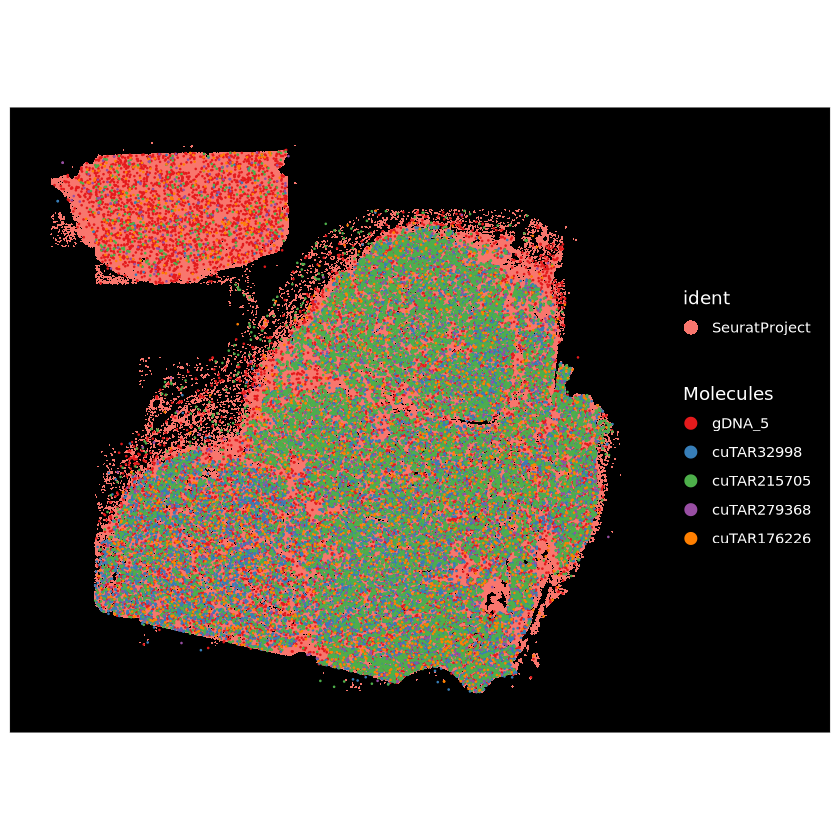

In [26]:
ImageDimPlot(breast, fov = "breast", molecules = c("cuTAR32998","cuTAR215705","cuTAR279368","cuTAR176226"), nmols = 20000, axes=TRUE)

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


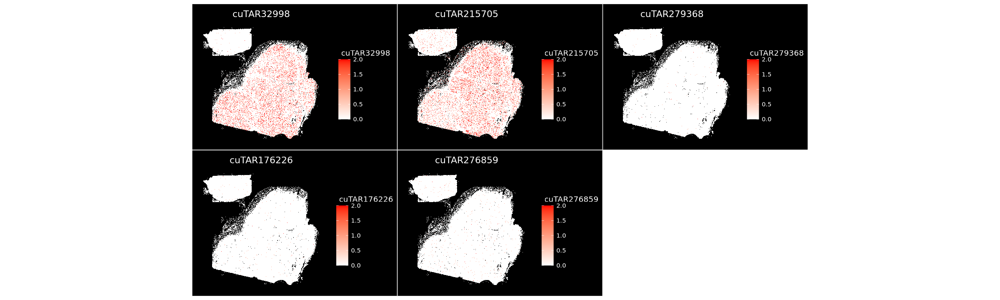

In [30]:
ImageFeaturePlot(breast, features = c("cuTAR32998","cuTAR215705","cuTAR279368","cuTAR176226","cuTAR276859"), max.cutoff = 2, size = 0.1, cols = c("white", "red"))

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


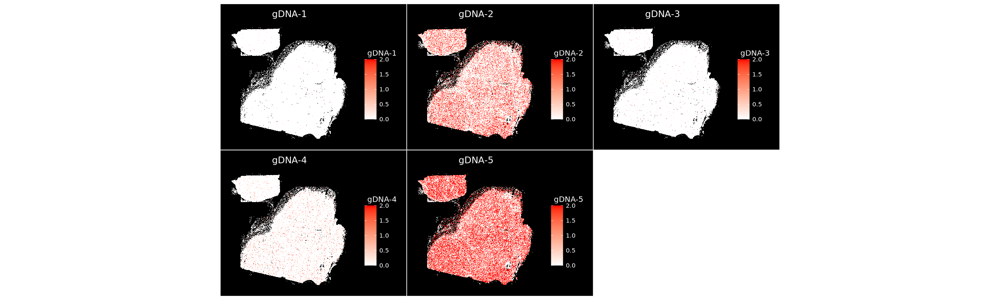

In [31]:
ImageFeaturePlot(breast, features = c("gDNA-1","gDNA-2","gDNA-3","gDNA-4","gDNA-5"), max.cutoff = 2, size = 0.1, cols = c("white", "red"))

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


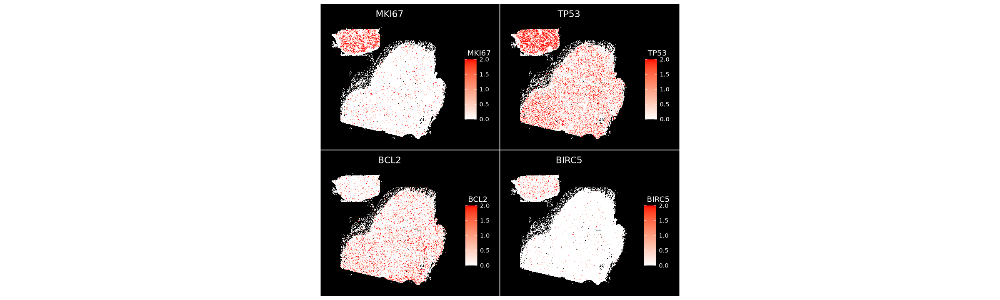

In [44]:
ImageFeaturePlot(breast, features = c("MKI67","TP53","BCL2","BIRC5"), max.cutoff = 2, size = 0.1, cols = c("white", "red"))

In [25]:
rownames(breast@assays$Xenium)

[1] "A2M"         "ACE2"        "ACTA2"       "ACTB"        "ADAM28"     
  [6] "AIF1"        "AIRE"        "AKT1"        "ALK"         "ANPEP"      
 [11] "ANXA1"       "ANXA13"      "APOE"        "AREG"        "ARG1"       
 [16] "ARID1A"      "ARPC3"       "ARPC5"       "ATM"         "BANK1"      
 [21] "BATF3"       "BCL2"        "BIRC5"       "BRAF"        "C1QB"       
 [26] "C1QBP"       "C1R"         "C1S"         "CCL11"       "CCL13"      
 [31] "CCL14"       "CCL15"       "CCL16"       "CCL19"       "CCL2"       
 [36] "CCL20"       "CCL21"       "CCL26"       "CCL28"       "CCL3"       
 [41] "CCL3L1"      "CCL4"        "CCL5"        "CCL7"        "CCL8"       
 [46] "CCND1"       "CCR1"        "CCR2"        "CCR3"        "CCR4"       
 [51] "CCR5"        "CCR6"        "CCR7"        "CD14"        "CD163"      
 [56] "CD19"        "CD1A"        "CD1C"        "CD2"         "CD247"      
 [61] "CD27"        "CD274"       "CD276"       "CD28"        "CD37"       
 [66] "CD38"        "CD3D"        "CD3E"        "CD4"         "CD40"       
 [71] "CD40LG"      "CD44"        "CD47"        "CD68"        "CD74"       
 [76] "CD79A"       "CD79B"       "CD80"        "CD83"        "CD86"       
 [81] "CD8A"        "CD8B"        "CDK1"        "CDK12"       "CDK2"       
 [86] "CDK4"        "CDK6"        "CDKN1A"      "CDKN1B"      "CDKN1C"     
 [91] "CDKN2A"      "CDKN2B"      "CDKN2C"      "CDKN2D"      "CDX1"       
 [96] "CDX2"        "CEACAM1"     "CEACAM6"     "CEACAM8"     "CENPF"      
[101] "CENPV"       "CFC1"        "CHI3L1"      "CHIT1"       "CLEC10A"    
[106] "CLEC12A"     "CMKLR1"      "CORO1A"      "COTL1"       "CPA3"       
[111] "CSF1"        "CSF1R"       "CST7"        "CTLA4"       "CTNNA2"     
[116] "CTNNB1"      "CTSB"        "CTSD"        "CTSL"        "CTSS"       
[121] "CTSW"        "CX3CR1"      "CXCL1"       "CXCL10"      "CXCL11"     
[126] "CXCL12"      "CXCL13"      "CXCL14"      "CXCL16"      "CXCL2"      
[131] "CXCL3"       "CXCL5"       "CXCL6"       "CXCL9"       "CXCR1"      
[136] "CXCR2"       "CXCR3"       "CXCR4"       "CXCR5"       "CXCR6"      
[141] "DCN"         "DERL3"       "DGKA"        "DMBT1"       "DUSP2"      
[146] "EGF"         "EGFR"        "EGR3"        "ELAVL1"      "ENTPD1"     
[151] "EOMES"       "EPCAM"       "EPO"         "EPOR"        "ERBB2"      
[156] "ERBB3"       "ERBB4"       "ESR1"        "ESRP1"       "FABP3"      
[161] "FADD"        "FAS"         "FASLG"       "FCER1A"      "FCER2"      
[166] "FCGR1A"      "FCGR2A"      "FCGR2B"      "FCGR3A"      "FCMR"       
[171] "FCRL3"       "FEZ1"        "FGF2"        "FGFR3"       "FGR"        
[176] "FHIT"        "FKBP11"      "FLT1"        "FLT3LG"      "FMO2"       
[181] "FN1"         "FOS"         "FOXP3"       "FUS"         "G0S2"       
[186] "GATA2"       "GATA3"       "GLIPR2"      "GNLY"        "GPR171"     
[191] "GPR183"      "GPR34"       "GZMA"        "GZMB"        "GZMH"       
[196] "GZMK"        "HAVCR2"      "HIF1A"       "HLA-B"       "HPGDS"      
[201] "ICAM1"       "ICOSLG"      "ID1"         "ID2"         "ID4"        
[206] "IDO1"        "IFIT2"       "IFIT3"       "IFITM3"      "IFNAR1"     
[211] "IFNB1"       "IFNGR1"      "IFNL1"       "IGFBP7"      "IGHG1"      
[216] "IGHG2"       "IGHG3"       "IGHG4"       "IGHGP"       "IGHM"       
[221] "IGKC"        "IGLC3"       "IL10"        "IL10RA"      "IL12B"      
[226] "IL12RB2"     "IL13"        "IL13RA2"     "IL15"        "IL15RA"     
[231] "IL18"        "IL1A"        "IL1B"        "IL1R1"       "IL1RAP"     
[236] "IL2"         "IL22RA1"     "IL22RA2"     "IL23A"       "IL2RA"      
[241] "IL2RB"       "IL2RG"       "IL4"         "IL4R"        "IL5"        
[246] "IL6"         "IL7R"        "IQGAP2"      "IRF1"        "IRF2"       
[251] "IRF3"        "IRF4"        "IRF5"        "IRF8"        "ISG15"      
[256] "ITGA1"       "ITGAE"       "ITGAM"       "ITGAX"       "JAK1"       
[261] "JAK2"        "JAK3"        "JCHAIN"      "J

In [31]:
cropped.coords <- Crop(breast[["breast"]], x = c(1200, 2900), y = c(3750, 4550), coords = "plot")
breast[["zoom"]] <- cropped.coords
# visualize cropped area with cell segmentations & selected molecules
DefaultBoundary(breast[["zoom"]]) <- "segmentation"
ImageDimPlot(breast, fov = "zoom", axes = TRUE, border.color = "white", border.size = 0.1, cols = "polychrome",
    coord.fixed = FALSE, molecules = c("gDNA_5", "cuTAR32998","cuTAR215705","cuTAR279368","cuTAR176226"), nmols = 50000)

ERROR: [1m[33mError[39m in `Overlay()`:[22m
[1m[22m[33m![39m The package "sf" is required to overlay spatial information


In [32]:
install.packages("sf")

also installing the dependencies ‘proxy’, ‘e1071’, ‘class’, ‘wk’, ‘classInt’, ‘s2’, ‘units’


Warning message in install.packages("sf"):
“installation of package ‘units’ had non-zero exit status”
Warning message in install.packages("sf"):
“installation of package ‘sf’ had non-zero exit status”
Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [83]:
run_sctype <- function (seurat_object, known_tissue_type = NULL, custom_marker_file = NULL, 
    plot = FALSE, name = "sctype_classification") 
{
    db_ = sctype_source()
    if (is.null(seurat_object)) {
        stop("Argument 'seurat_object' is missing")
    }
    if (!inherits(seurat_object, "Seurat")) {
        stop("Argument 'seurat_object' must be a Seurat object")
    }
    if (is.null(custom_marker_file)) {
        custom_marker_file = db_
    }
    if (is.null(known_tissue_type)) {
        tissue_type = auto_detect_tissue_type(path_to_db_file = custom_marker_file, 
            seuratObject = seurat_object, scaled = TRUE, assay = "Xenium")
        rownames(tissue_type) = NULL
        tissue_type = tissue_type$tissue[1]
    }
    else {
        tissue_type = known_tissue_type
    }
    gs_list = gene_sets_prepare(custom_marker_file, tissue_type)
    package_type = substr(packageVersion("Seurat"), 1, 1)
    if (package_type == 5) {
        print("Running with Seuratv5")
        es.max = sctype_score(scRNAseqData = seurat_object[["Xenium"]]$scale.data, 
            scaled = TRUE, gs = gs_list$gs_positive, gs2 = gs_list$gs_negative)
    }
    else {
        print("Running with Seuratv4")
        es.max = sctype_score(scRNAseqData = seurat_object[["Xenium"]]@scale.data, 
            scaled = TRUE, gs = gs_list$gs_positive, gs2 = gs_list$gs_negative)
    }
    cL_resutls = do.call("rbind", lapply(unique(seurat_object@meta.data$seurat_clusters), 
        function(cl) {
            es.max.cl = sort(rowSums(es.max[, rownames(seurat_object@meta.data[seurat_object@meta.data$seurat_clusters == 
                cl, ])]), decreasing = !0)
            head(data.frame(cluster = cl, type = names(es.max.cl), 
                scores = es.max.cl, ncells = sum(seurat_object@meta.data$seurat_clusters == 
                  cl)), 10)
        }))
    sctype_scores = cL_resutls %>% group_by(cluster) %>% top_n(n = 1, 
        wt = scores)
    sctype_scores$type[as.numeric(as.character(sctype_scores$scores)) < 
        sctype_scores$ncells/4] = "Unknown"
    seurat_object_res = seurat_object
    seurat_object_res@meta.data[name] = ""
    for (j in unique(sctype_scores$cluster)) {
        cl_type = sctype_scores[sctype_scores$cluster == j, ]
        seurat_object_res@meta.data[seurat_object_res@meta.data$seurat_clusters == 
            j, name] = as.character(cl_type$type[1])
    }
    if (plot) {
        plot_ = DimPlot(seurat_object_res, reduction = "umap", 
            group.by = name)
        print(plot_)
    }
    text_ = paste("New metadata added: ", name)
    print(text_)
    return(seurat_object_res)
}

In [90]:
features <- rownames(breast)
# Filter out rows that begin with "gDNA" or "cuTAR170802"
filtered_features <- features[!grepl("^gDNA|^cuTAR170802", features)]
#breast_filtered <- subset(breast, features = filtered_features)


In [91]:
breast <- NormalizeData(breast, assay = "Xenium")
breast<-ScaleData(breast, features=filtered_features)
breast <- RunPCA(breast, npcs = 30, features = filtered_features)
breast <- RunUMAP(breast, dims = 1:30)
breast <- FindNeighbors(breast, reduction = "pca", dims = 1:30)
breast <- FindClusters(breast, resolution = 0.3)

Normalizing layer: counts

Centering and scaling data matrix

Warning message:
“Different features in new layer data than already exists for scale.data”
PC_ 1 
Positive:  LUM, CXCL13, IGFBP7, SPARC, DCN, SPARCL1, CXCL14, CD2, MS4A1, CD8A 
	   CD3E, IGHM, CXCL12, VCAN, GZMK, KLRK1, CD79A, CTLA4, CPA3, IL7R 
	   IGHG1, CD3D, TIGIT, CCR4, BANK1, ITGA1, SAMD3, IGHGP, IGHG3, TRAT1 
Negative:  CXCL5, S100A9, MGP, CHI3L1, MET, ICAM1, CEACAM1, CCL2, SOX9, SPIB 
	   CD47, CD44, EGFR, LAMP1, EPCAM, CCL28, TMPRSS2, CENPF, UBE2C, CXCL1 
	   MKI67, ARPC5, CDKN2C, STMN1, ESRP1, CXCL6, SDC1, SOS1, CDKN2A, CDK1 
PC_ 2 
Positive:  GATA3, XBP1, CXCL13, ERBB2, ERBB3, ERBB4, cuTAR32998, cuTAR215705, NELL2, VEGFA 
	   CCND1, TFF3, cuTAR78711, cuTAR143368, cuTAR310122, BCL2, TC2N, cuTAR87324, MX1, IFITM3 
	   cuTAR184918, ISG15, EPCAM, cuTAR140178, AKT1, EGR3, cuTAR137818, TP53, TARDBP, ARID1A 
Negative:  C1S, CD44, MGP, APOE, IL7R, IGFBP7, CD74, MPEG1, S100A9, ANXA1 
	   CD163, LUM, VCAN, FN1, A2M, IL18, D

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 464673
Number of edges: 11227194

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8711
Number of communities: 346
Elapsed time: 429 seconds


332 singletons identified. 14 final clusters.



Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


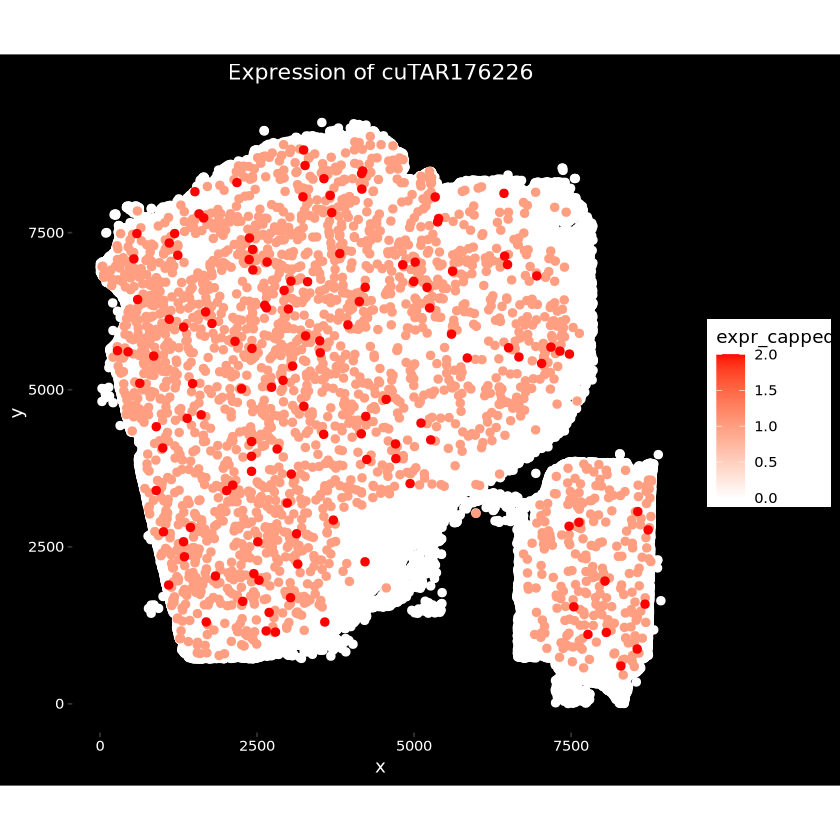

In [25]:
gene <- "cuTAR176226"
# Fetch spatial coords
coords <- GetTissueCoordinates(breast)
# Fetch expression for gene
expr <- FetchData(breast, vars = gene)[,1]
# Combine into dataframe
df <- data.frame(
  x = coords[,1],
  y = coords[,2],
  expr = expr)
# Filter max cutoff and set colors
df$expr_capped <- pmin(df$expr, 2)  # max cutoff 2
# Order points so high expression plotted last (on top)
df <- df %>% arrange(expr_capped)
# Plot with black background
ggplot(df, aes(x = x, y = y)) +
  geom_point(aes(color = expr_capped), size = 2) +
  scale_color_gradient(low = "white", high = "red") +
  coord_fixed() +
  ggtitle(paste("Expression of", gene)) +
  theme(
    panel.background = element_rect(fill = "black", color = NA),
    plot.background = element_rect(fill = "black", color = NA),
    panel.grid = element_blank(),
    axis.text = element_text(color = "white"),
    axis.title = element_text(color = "white"),
    plot.title = element_text(color = "white", hjust = 0.5)  )


In [92]:
#source("https://raw.githubusercontent.com/kris-nader/sc-type/master/R/sctype_wrapper.R"); 
breast <- run_sctype(breast,known_tissue_type="Immune system",custom_marker_file="https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/ScTypeDB_full.xlsx",name="sctype_classification",plot=FALSE)


Warning message in checkGeneSymbols(markers_all):
“Human gene symbols should be all upper-case except for the 'orf' in open reading frames. The case of some letters was corrected.”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in

[1] "Running with Seuratv5"
[1] "New metadata added:  sctype_classification"


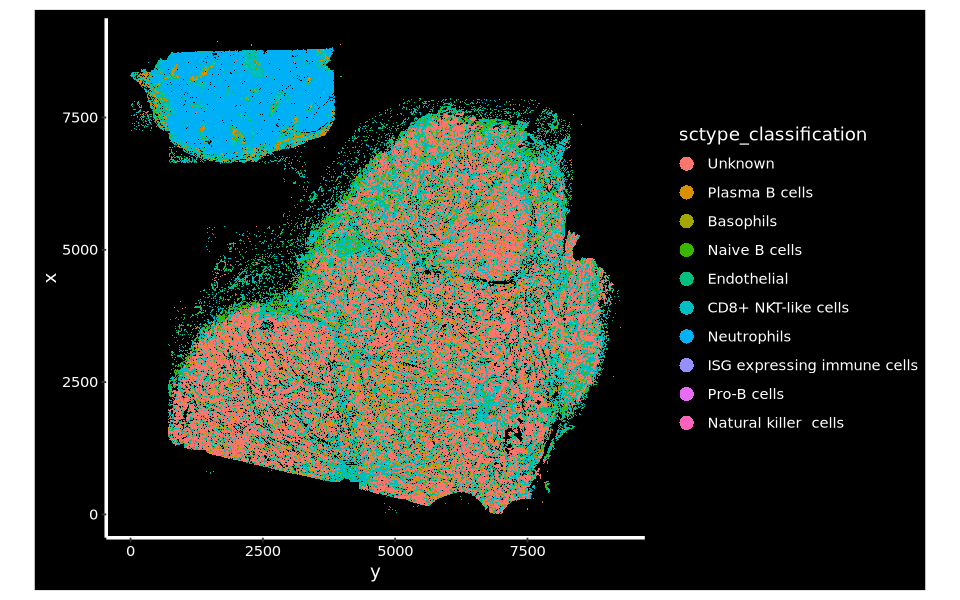

In [95]:
ImageDimPlot(breast, group.by = "sctype_classification", size = 0.1, axes=TRUE)

#ImageDimPlot(breast, fov = "breast", molecules = c("cuTAR32998","cuTAR215705","cuTAR279368","cuTAR176226"), nmols = 20000, axes=TRUE)

In [96]:
saveRDS(breast, "breast_scType.rds")

In [6]:
breast<-readRDS("breast_scType.rds")

In [10]:
getwd()

[1] "/scratch/project_mnt/S0010/Prakrithi/lnc_revision/xenium"

In [2]:
sc<-Read10X("sc_ref/breast/")

In [3]:
m<-read.csv("sc_ref/breast/metadata.csv")

In [5]:
dim(sc)
dim(m)

[1]  58892 236363

[1] 236363     35

In [4]:
rownames(m)<-m$X
m_o <- m[colnames(sc), , drop = FALSE]
head(m_o)

,X,nCount_RNA,nFeature_RNA,Doublet.Call,Patient_ID,Dataset,Sample,Gene_Coverage,Capture_Method,Sequencer,⋯,Grade,Tumor_Size_cm,Ki67,Age,Menopause_Status,Treatment_Status,Histology,SC50_Prediction,PAM50_Prediction,Cell_Type_Annotation
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Savas_AAACCTGCAAACAACA-1_TIL20_1,Savas_AAACCTGCAAACAACA-1_TIL20_1,1736,855,Singlet,TIL20,Savas,TIL20,3',10X Genomics Single Cell 3' v2,Illumina HiSeq 2500,⋯,NA,1.2-1.1,NA,NA,NA,Naive,NA,NA,TNBC,Regulatory T Cells
Savas_AAACCTGCACTACAGT-1_TIL20_1,Savas_AAACCTGCACTACAGT-1_TIL20_1,2292,1144,Singlet,TIL20,Savas,TIL20,3',10X Genomics Single Cell 3' v2,Illumina HiSeq 2500,⋯,NA,1.2-1.1,NA,NA,NA,Naive,NA,NA,TNBC,CD8+ T Cells
Savas_AAACCTGGTGAGCGAT-1_TIL20_1,Savas_AAACCTGGTGAGCGAT-1_TIL20_1,1882,678,Singlet,TIL20,Savas,TIL20,3',10X Genomics Single Cell 3' v2,Illumina HiSeq 2500,⋯,NA,1.2-1.1,NA,NA,NA,Naive,NA,NA,TNBC,CD4+ T Cells
Savas_AAACCTGTCAAAGACA-1_TIL20_1,Savas_AAACCTGTCAAAGACA-1_TIL20_1,2421,1017,Singlet,TIL20,Savas,TIL20,3',10X Genomics Single Cell 3' v2,Illumina HiSeq 2500,⋯,NA,1.2-1.1,NA,NA,NA,Naive,NA,NA,TNBC,CD8+ T Cells
Savas_AAACGGGAGTGCCAGA-1_TIL20_1,Savas_AAACGGGAGTGCCAGA-1_TIL20_1,1296,754,Singlet,TIL20,Savas,TIL20,3',10X Genomics Single Cell 3' v2,Illumina HiSeq 2500,⋯,NA,1.2-1.1,NA,NA,NA,Naive,NA,NA,TNBC,CD8+ T Cells
Savas_AAACGGGCAGCTTAAC-1_TIL20_1,Savas_AAACGGGCAGCTTAAC-1_TIL20_1,4505,1855,Singlet,TIL20,Savas,TIL20,3',10X Genomics Single Cell 3' v2,Illumina HiSeq 2500,⋯,NA,1.2-1.1,NA,NA,NA,Naive,NA,NA,TNBC,Regulatory T Cells


In [7]:
#m_o <- m[colnames(sc), , drop = FALSE]
s<-CreateSeuratObject(sc, meta.data = m_o)

In [8]:
s
colnames(sc)[23421]
m_o[23421,]

An object of class Seurat 
58892 features across 236363 samples within 1 assay 
Active assay: RNA (58892 features, 0 variable features)
 1 layer present: counts

[1] "AziziT_TCTCTAAGTCGCGAAA-1_BC9_T1"

,X,nCount_RNA,nFeature_RNA,Doublet.Call,Patient_ID,Dataset,Sample,Gene_Coverage,Capture_Method,Sequencer,⋯,Grade,Tumor_Size_cm,Ki67,Age,Menopause_Status,Treatment_Status,Histology,SC50_Prediction,PAM50_Prediction,Cell_Type_Annotation
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AziziT_TCTCTAAGTCGCGAAA-1_BC9_T1,AziziT_TCTCTAAGTCGCGAAA-1_BC9_T1,5577,1637,Singlet,BC9_1,AziziT,BC9_T1,5',10X Genomics Chromium v2 5',Illumina NextSeq 500,⋯,2,1.7,NA,65,Post,Naive,Lobular,NA,HR+,CD8+ T Cells


In [9]:
saveRDS(s,"sc_ref/breast/seurat_obj_raw_with_meta.rds")

In [13]:
# Downsample the Seurat object to 37,011 cells
target_n_cells <- 50000
downsampled_seurat <- downsample_seurat(s, target_n_cells)

# Check the resulting cell type distribution
table(downsampled_seurat$Cell_Type_Annotation)

# Save the downsampled object
saveRDS(downsampled_seurat, file = "sc_ref/breast/seurat_obj_raw_with_meta_downsampled_50k.rds")



                      B Cells       Cancer Epithelial Cells 
                         1309                         16052 
                 CD4+ T Cells                  CD8+ T Cells 
                         7606                          7662 
              Dendritic Cells             Endothelial Cells 
                          193                          1534 
             Epithelial Cells                   Fibroblasts 
                         1803                          4953 
                  Macrophages                    Mast Cells 
                         2460                           168 
                        MDSCs                     Monocytes 
                          240                           378 
          Myoepithelial Cells                   Neutrophils 
                          554                            31 
                     NK Cells Perivascular-like (PVL) Cells 
                          787                           513 
                 Plasma

In [16]:
head(downsampled_seurat@assays$RNA$counts)

  [[ suppressing 34 column names ‘Savas_AAACGGGGTAGTACCT-1_TIL20_1’, ‘Savas_AAAGATGCACATCTTT-1_TIL20_1’, ‘Savas_AAAGATGCAGTTCATG-1_TIL20_1’ ... ]]



6 x 50001 sparse Matrix of class "dgCMatrix"
                                                                               
RP11-34P13-3  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
FAM138A       . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
OR4F5         . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
RP11-34P13-7  . . . . . . . . . . . . 1 . . . . . . . . . . . . . . . . . . . .
RP11-34P13-8  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
RP11-34P13-14 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
                      
RP11-34P13-3  . ......
FAM138A       . ......
OR4F5         . ......
RP11-34P13-7  . ......
RP11-34P13-8  . ......
RP11-34P13-14 . ......

 .....suppressing 49967 columns in show(); maybe adjust options(max.print=, width=)
 ..............................

In [3]:
lt_m<-read.csv("mel/clean-data/BreastCancer_LT_breast_ref_subsetted_ref.csv")
head(lt_m)

,X,predicted.id,prediction.score.CD8..T.Cells,prediction.score.Regulatory.T.Cells,prediction.score.CD4..T.Cells,prediction.score.Fibroblasts,prediction.score.Plasma.Cells,prediction.score.Epithelial.Cells,prediction.score.Cancer.Epithelial.Cells,prediction.score.Endothelial.Cells,⋯,prediction.score.B.Cells,prediction.score.NK.Cells,prediction.score.MDSCs,prediction.score.Perivascular.like..PVL..Cells,prediction.score.Myoepithelial.Cells,prediction.score.Dendritic.Cells,prediction.score.Monocytes,prediction.score.Neutrophils,prediction.score.Mast.Cells,prediction.score.max
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,aaaabalk-1,Cancer Epithelial Cells,0.000000000,0.0000000,0.00000000,0.000000000,0.0000000,0.026301254,0.97369875,0.00000000,⋯,0.000000000,0.000000000,0,0,0,0,0,0,0,0.9736987
2,aaaaefcj-1,Cancer Epithelial Cells,0.000000000,0.0000000,0.00000000,0.000000000,0.0000000,0.011070353,0.98892965,0.00000000,⋯,0.000000000,0.000000000,0,0,0,0,0,0,0,0.9889296
3,aaaaekcn-1,Cancer Epithelial Cells,0.000000000,0.0000000,0.00000000,0.000000000,0.0000000,0.000000000,1.00000000,0.00000000,⋯,0.000000000,0.000000000,0,0,0,0,0,0,0,1.0000000
4,aaaaemhb-1,CD4+ T Cells,0.028252489,0.1525417,0.73961938,0.000000000,0.0000000,0.001506207,0.06854254,0.00000000,⋯,0.007156371,0.002381338,0,0,0,0,0,0,0,0.7396194
5,aaaaieck-1,Macrophages,0.013979121,0.0000000,0.09015796,0.004076127,0.1633265,0.138222842,0.23698196,0.05626421,⋯,0.000000000,0.044078172,0,0,0,0,0,0,0,0.2529131
6,aaaajegg-1,Cancer Epithelial Cells,0.004294547,0.0000000,0.02678789,0.000000000,0.0000000,0.069761863,0.83989913,0.00000000,⋯,0.000000000,0.059256567,0,0,0,0,0,0,0,0.8398991


In [7]:
# Subset Melanoma to keep only cells present in m$X
breast <- subset(breast, cells = lt_m$X)
# Ensure m is ordered to match colnames(Melanoma)
lt_m <- lt_m[match(colnames(breast), lt_m$X), ]


Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


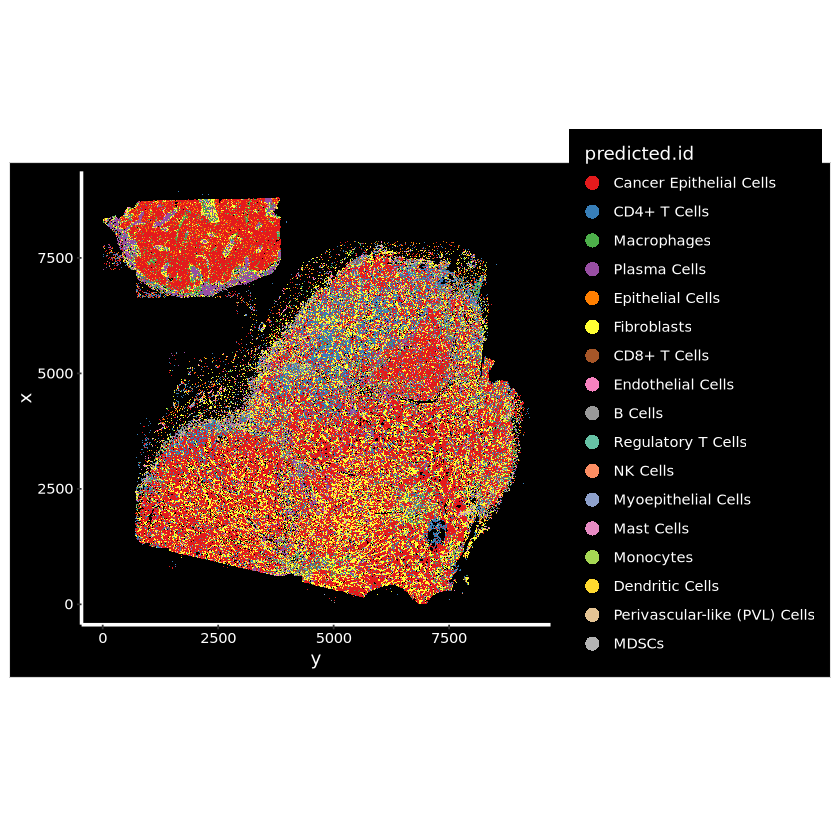

In [33]:
# Define the custom color palette
custom_colors <- c(
  "#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00", "#FFFF33", "#A65628",
  "#F781BF", "#999999", "#66C2A5", "#FC8D62", "#8DA0CB", "#E78AC3", "#A6D854",
  "#FFD92F", "#E5C494", "#B3B3B3"
)

# Apply the custom colors to the levels of predicted.id
names(custom_colors) <- levels(breast$predicted.id)

# Create the ImageDimPlot with custom colors
ImageDimPlot(
  object = breast,
  group.by = "predicted.id",
  size = 0.1,
  axes = TRUE,
  cols = custom_colors
)


In [9]:
head(breast)

,orig.ident,nCount_Xenium,nFeature_Xenium,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,Xenium_snn_res.0.3,seurat_clusters,sctype_classification
,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<fct>,<fct>,<chr>
aaaabalk-1,SeuratProject,185,60,0,0,0,0,0,0,Unknown
aaaaefcj-1,SeuratProject,138,55,0,0,0,0,0,0,Unknown
aaaaekcn-1,SeuratProject,141,50,0,0,0,0,0,0,Unknown
aaaaemhb-1,SeuratProject,76,34,0,0,0,0,0,0,Unknown
aaaaieck-1,SeuratProject,168,58,0,0,0,0,0,0,Unknown
aaaajegg-1,SeuratProject,161,59,0,0,0,0,0,0,Unknown
aaaakabk-1,SeuratProject,192,60,0,0,0,0,0,0,Unknown
aaaalfji-1,SeuratProject,121,52,0,0,0,0,4,4,Plasma B cells
aaaamdff-1,SeuratProject,154,52,0,0,0,0,0,0,Unknown


pdf 
  2

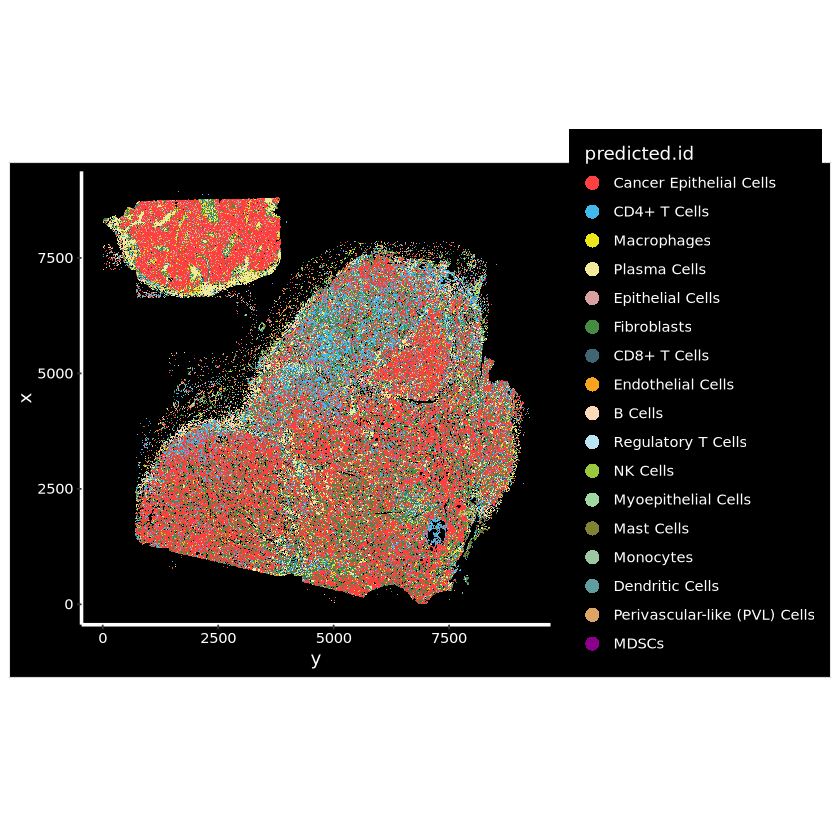

In [12]:
# Define your custom color palette
cell_type_colors <- c(
  "Cancer Epithelial Cells" = "#ff4040",
  "CD4+ T Cells" = "#41baeb",
  "B Cells" = "#fed9b9",
  "Plasma Cells" = "#f1ea9d",
  "NK Cells" = "#99ca3e",
  "CD8+ T Cells" = "#406573",
  "Fibroblasts" = "#458b41",
  "Epithelial Cells" = "#d8a1a1",
  "Myoepithelial Cells" = "#a1d8a1",
  "nan" = "grey",
  "Endothelial Cells" = "#f8a41e",
  "Perivascular-like (PVL) Cells" = "#dca566",
  "Mast Cells" = "#7f8133",
  "Macrophages" = "#eae71d",
  "Regulatory T Cells" = "#bbe5f3",
  "MDSCs" = "#8b008b",
  "Dendritic Cells" = "#5f9d9e",
  "Monocytes" = "#9cc7a1"
)

breast$predicted.id<-lt_m$predicted.id
# Ensure factor levels match the names in the color vector
levels_in_data <- unique(breast$predicted.id)
custom_colors <- cell_type_colors[levels_in_data]

# Plot with custom colors
P<-ImageDimPlot(
  object = breast,
  group.by = "predicted.id",
  size = 0.1,
  axes = TRUE,
  cols = custom_colors
)

pdf("breast_Xenium_cell_types.pdf")
P
dev.off()
P

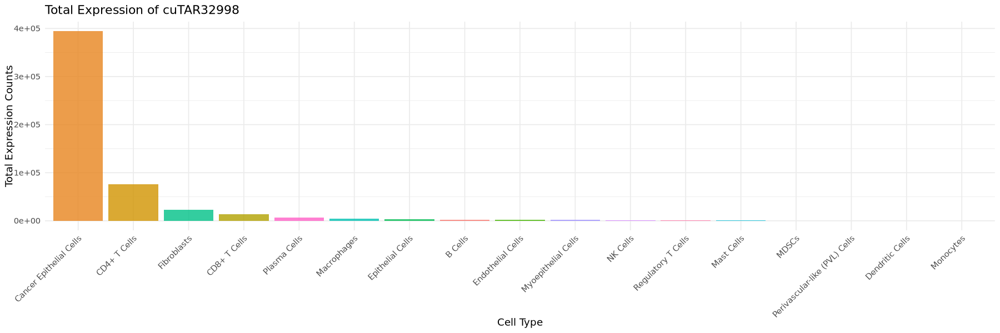

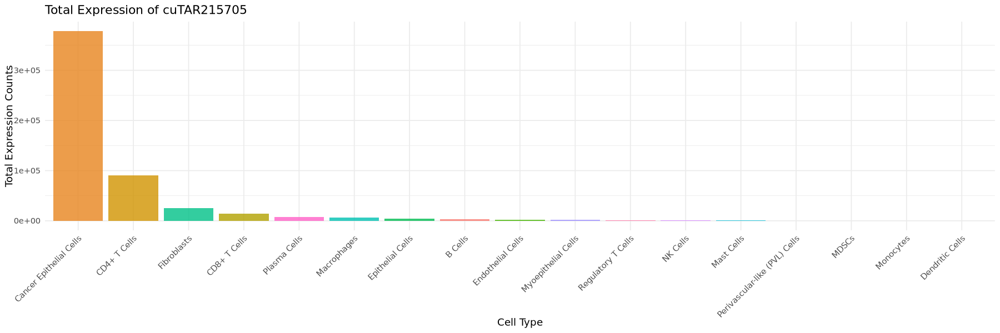

In [37]:
plot_bar_total_expression(breast, c( "cuTAR32998","cuTAR215705"))

In [38]:
table(breast$predicted.id)


                      B Cells       Cancer Epithelial Cells 
                        12654                        236534 
                 CD4+ T Cells                  CD8+ T Cells 
                        65421                         23498 
              Dendritic Cells             Endothelial Cells 
                          468                          7064 
             Epithelial Cells                   Fibroblasts 
                         8350                         64510 
                  Macrophages                    Mast Cells 
                        15809                          1360 
                        MDSCs                     Monocytes 
                          753                          1187 
          Myoepithelial Cells                      NK Cells 
                         3480                          1819 
Perivascular-like (PVL) Cells                  Plasma Cells 
                         1083                         16532 
           Regulatory T

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”


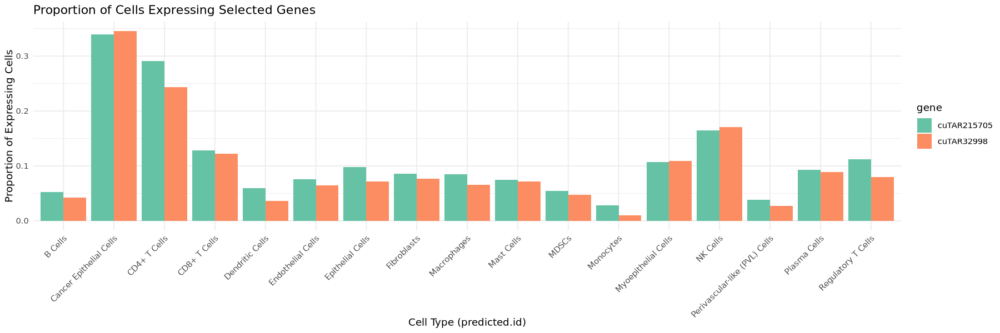

In [45]:
genes <- c("cuTAR32998", "cuTAR215705")  # Replace with your genes
plot_gene_expression_proportion(breast, genes)


Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”


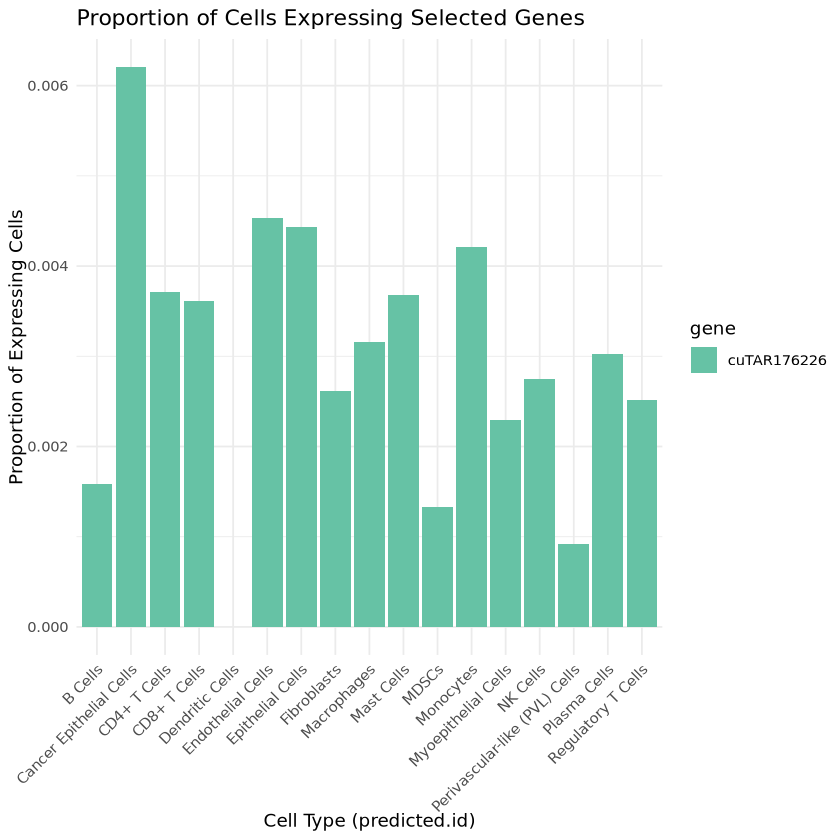

In [5]:
plot_gene_expression_proportion(breast,"cuTAR176226")

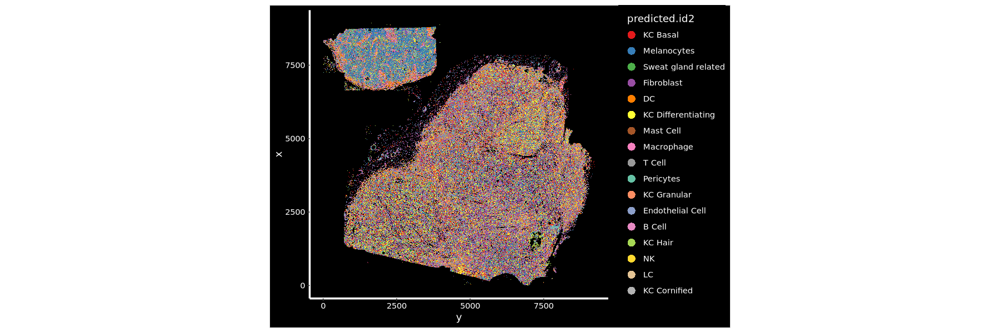

In [48]:
lt_m2<-read.csv("mel/clean-data/BreastCancer_LT_subsetted_ref.csv")
lt_m2 <- lt_m2[match(colnames(breast), lt_m2$X), ]

breast@meta.data$predicted.id2<-lt_m2$predicted.id
# Define the custom color palette
custom_colors <- c(
  "#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00", "#FFFF33", "#A65628",
  "#F781BF", "#999999", "#66C2A5", "#FC8D62", "#8DA0CB", "#E78AC3", "#A6D854",
  "#FFD92F", "#E5C494", "#B3B3B3"
)

# Apply the custom colors to the levels of predicted.id
names(custom_colors) <- levels(breast$predicted.id2)

# Create the ImageDimPlot with custom colors
ImageDimPlot(
  object = breast,
  group.by = "predicted.id2",
  size = 0.1,
  axes = TRUE,
  cols = custom_colors
)


In [3]:
breast<-readRDS("mel/clean-data/xenium_spatial_breast_LT.rds")

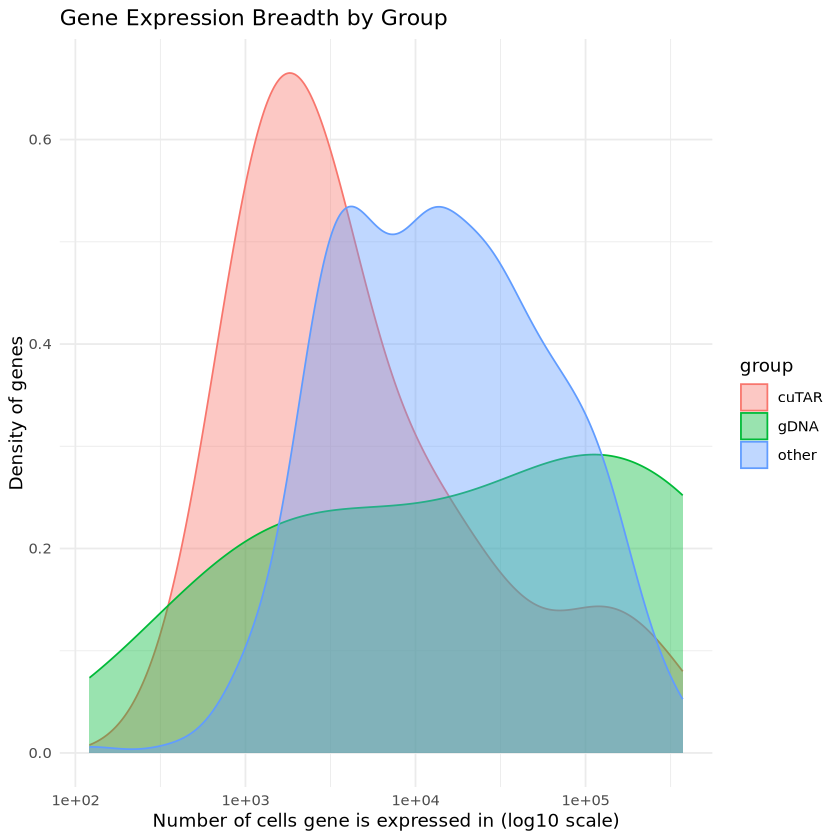

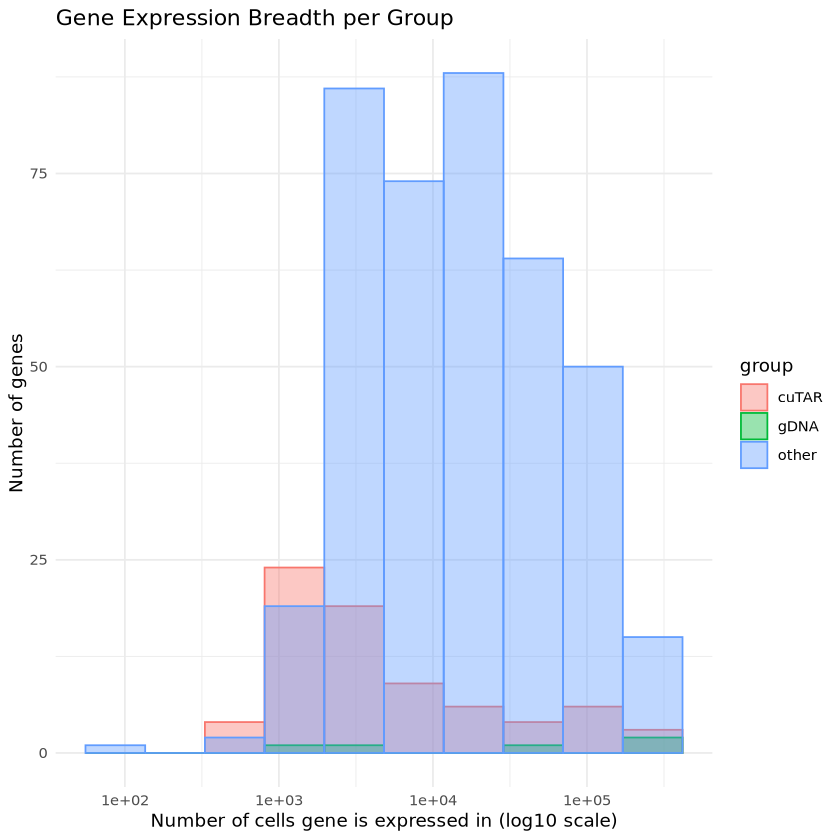

In [22]:

# Count number of cells each gene is expressed in (non-zero)
expr_cells <- Matrix::rowSums(counts > 0)

# Classify gene groups based on gene names
gene_names <- rownames(counts)

gene_group <- case_when(
  str_starts(gene_names, "gDNA") ~ "gDNA",
  str_starts(gene_names, "cuTAR") ~ "cuTAR",
  TRUE ~ "other"
)

# Create dataframe for plotting
df <- data.frame(
  gene = gene_names,
  n_cells = expr_cells,
  group = gene_group
)
df<-df[-421,]

# ------- DENSITY PLOT -------
ggplot(df, aes(x = n_cells, fill = group, color = group)) +
  geom_density(alpha = 0.4) +
  scale_x_log10() +
  labs(
    title = "Gene Expression Breadth by Group",
    x = "Number of cells gene is expressed in (log10 scale)",
    y = "Density of genes"
  ) +
  theme_minimal()

# ------- HISTOGRAM -------
ggplot(df, aes(x = n_cells, fill = group, color = group)) +
  geom_histogram(position = "identity", bins = 10, alpha = 0.4) +
  scale_x_log10() +
  labs(
    title = "Gene Expression Breadth per Group",
    x = "Number of cells gene is expressed in (log10 scale)",
    y = "Number of genes"
  ) +
  theme_minimal()


In [17]:
grep("cuTAR17", rownames(df))

[1] 420 421 422 423 424

In [18]:
df[420:425,]

,gene,n_cells,group
,<chr>,<int>,<chr>
cuTAR170206,cuTAR170206,2101,cuTAR
cuTAR171799,cuTAR171799,913,cuTAR
cuTAR176226,cuTAR176226,2186,cuTAR
cuTAR176317,cuTAR176317,33307,cuTAR
cuTAR17878,cuTAR17878,5450,cuTAR
cuTAR184918,cuTAR184918,350890,cuTAR


# Brain

In [ ]:
transcripts <- read_parquet("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Glioblastoma__20250319__042624/transcripts.parquet")
write.csv(transcripts, gzfile("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Glioblastoma__20250319__042624/transcripts.csv.gz"), row.names = FALSE)


In [21]:
gbm <-LoadXenium2("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Glioblastoma__20250319__042624/",
                  fov="fov")

10X data contains more than one type and is being returned as a list containing matrices of each type.



Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


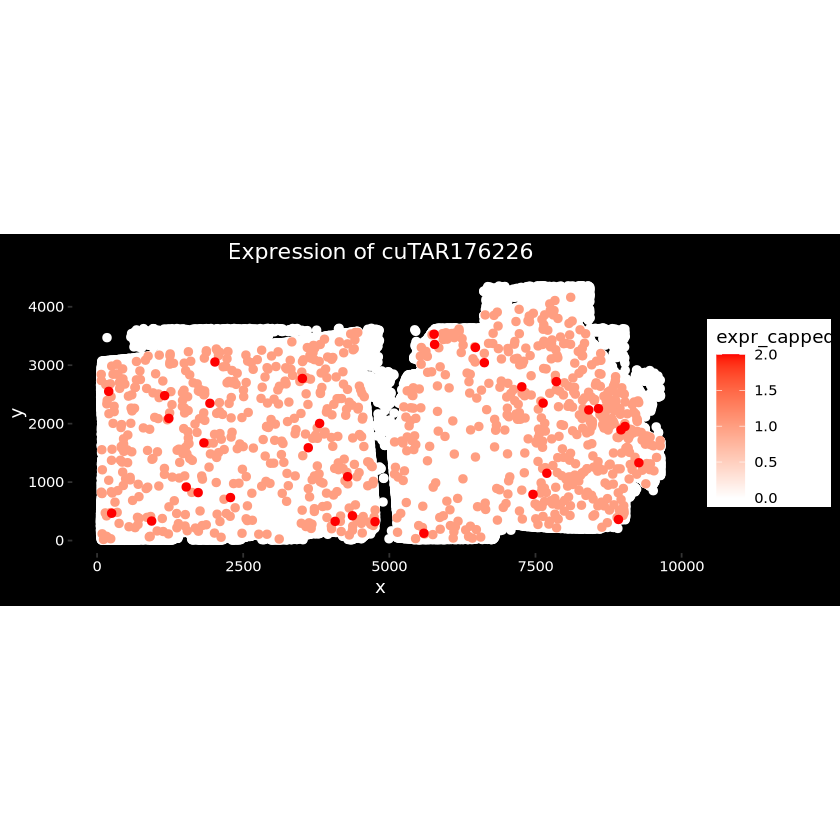

In [24]:
gene <- "cuTAR176226"
# Fetch spatial coords
coords <- GetTissueCoordinates(gbm)
# Fetch expression for gene
expr <- FetchData(gbm, vars = gene)[,1]
# Combine into dataframe
df <- data.frame(
  x = coords[,1],
  y = coords[,2],
  expr = expr)
# Filter max cutoff and set colors
df$expr_capped <- pmin(df$expr, 2)  # max cutoff 2
# Order points so high expression plotted last (on top)
df <- df %>% arrange(expr_capped)
# Plot with black background
ggplot(df, aes(x = x, y = y)) +
  geom_point(aes(color = expr_capped), size = 2) +
  scale_color_gradient(low = "white", high = "red") +
  coord_fixed() +
  ggtitle(paste("Expression of", gene)) +
  theme(
    panel.background = element_rect(fill = "black", color = NA),
    plot.background = element_rect(fill = "black", color = NA),
    panel.grid = element_blank(),
    axis.text = element_text(color = "white"),
    axis.title = element_text(color = "white"),
    plot.title = element_text(color = "white", hjust = 0.5)  )


Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


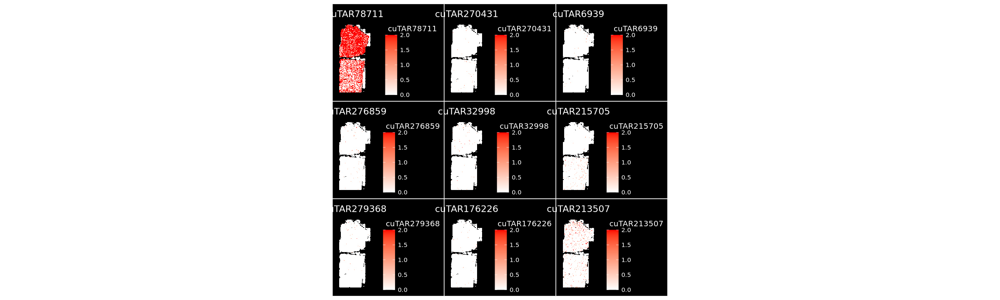

In [39]:
ImageFeaturePlot(gbm, features = c("cuTAR78711","cuTAR270431","cuTAR6939","cuTAR276859",
                                "cuTAR32998","cuTAR215705","cuTAR279368","cuTAR176226","cuTAR213507"), max.cutoff = 2, size = 0.5,
                 cols = c("white", "red"))


Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


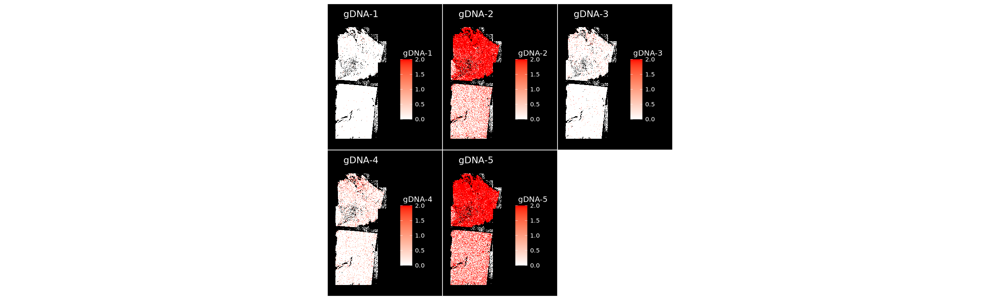

In [40]:
ImageFeaturePlot(gbm, features = c("gDNA-1","gDNA-2","gDNA-3","gDNA-4","gDNA-5"), max.cutoff = 2, size = 0.1, cols = c("white", "red"))

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


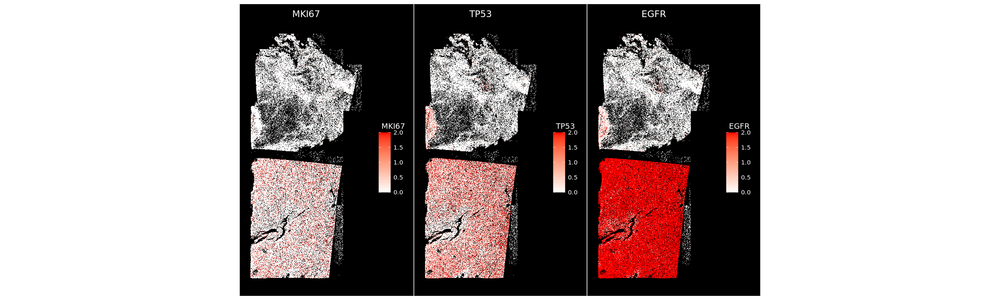

In [46]:
ImageFeaturePlot(gbm, features = c("MKI67","TP53","EGFR"), max.cutoff = 2, size = 0.1, cols = c("white", "red"))

In [15]:
c<-read.csv("sc_ref/SCSP0000480_counts_subset.csv")
rownames(c)<-c$X
c<-c[,-1]
m<-read.csv("sc_ref//SCSP0000480_processed_metadata_downsampled.csv")

In [16]:
head(c)
head(m)

,SF2777_CAATCGAAGGCATCGA.1,SF10433_AATAGAGCACACTTAG.1,SF12008_TTGTTGTGTCACCCTT.1,SF11815_AACCATGCAGCATACT.1,SF11248_GAAGGACGTGGTAATA.1,SF11815_AACAGGGAGGACAACC.1,SF2777_CATCCGTTCCGTAGTA.1,SF9962_CGAGTGCTCGGAATTC.1,SF5581_TCCTTTCCAAACCACT.1,SF12008_ATCGATGAGTGTTGTC.1,⋯,SF9494_AGAGAGCCAAACCATC.1,SF10857_AGATCCAAGGAATCGC.1,SF9372_TCCTAATTCGCCATAA.1,SF3076_AATCGTGTCCCTCTCC.1,SF9798_GTCATCCGTTATGTCG.1,SF10592_CCGGACAGTCTCTCCA.1,SF3243_TAGTGCAAGTTGGACG.1,SF11815_AGGTCATCATACTGAC.1,SF11857_CTACCTGGTCCCTGAG.1,SF10592_TGCGGCATCATAAGGA.1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
FO538757.2,0,0.4870451,0,0,0,0,0,1.682299,0.6816801,0,⋯,0.0000000,0,0,0,0.000000,0,0,0,0,0
RP5-857K21.4,0,0.8131500,0,0,0,0,0,0.000000,0.0000000,0,⋯,0.6123229,0,0,0,0.000000,0,0,0,0,0
RP11-206L10.9,0,0.0000000,0,0,0,0,0,0.000000,0.0000000,0,⋯,0.0000000,0,0,0,1.165425,0,0,0,0,0
NOC2L,0,0.0000000,0,0,0,0,0,0.000000,0.0000000,0,⋯,0.0000000,0,0,0,0.000000,0,0,0,0,0
ISG15,0,0.0000000,0,0,0,0,0,0.000000,0.0000000,0,⋯,0.0000000,0,0,0,0.000000,0,0,0,0,0
AGRN,0,0.0000000,0,0,0,0,0,0.000000,0.0000000,0,⋯,0.0000000,0,0,0,0.000000,0,0,0,0,0


,CELL,source,cell_type,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,clusters
,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,SF2777_CAATCGAAGGCATCGA-1,Primary,GBM cell,512,6.240276,1095,6.999423,14.520548,24.74886,43.01370,97.80822,10,2.397895,0.9132420,16
2,SF10433_AATAGAGCACACTTAG-1,Recurrent,GBM cell,2428,7.795235,2800,7.937732,4.928571,8.50000,15.64286,31.14286,8,2.197225,0.2857143,10
3,SF12008_TTGTTGTGTCACCCTT-1,Recurrent,GBM cell,823,6.714171,1741,7.462789,8.960368,16.94428,28.43194,62.89489,0,0.000000,0.0000000,5
4,SF11815_AACCATGCAGCATACT-1,Primary,GBM cell,719,6.579251,1578,7.364547,10.139417,19.64512,34.22053,72.24335,10,2.397895,0.6337135,4
5,SF11248_GAAGGACGTGGTAATA-1,Recurrent,GBM cell,633,6.452049,1398,7.243513,11.874106,22.60372,38.05436,80.97282,0,0.000000,0.0000000,19
6,SF11815_AACAGGGAGGACAACC-1,Primary,GBM cell,560,6.329721,1181,7.074963,13.463167,22.09992,39.03472,89.83912,6,1.945910,0.5080440,7


In [17]:
m<-read.csv("sc_ref//SCSP0000480_processed_metadata_downsampled.csv")
m$CELL<-gsub("-1",".1",m$CELL)
#m$CELL

In [18]:

#m$CELL<-gsub("-1",".1",m$CELL)
rownames(m)<-m$CELL
m <- m[colnames(c), , drop = FALSE]

In [19]:
colnames(c)[3244]
rownames(m)[3244]

[1] "SF3391_GAACACTAGCGTCAGA.1"

[1] "SF3391_GAACACTAGCGTCAGA.1"

In [20]:
s<-CreateSeuratObject(c,meta.data = m)
s

Warning message:
“Data is of class data.frame. Coercing to dgCMatrix.”


An object of class Seurat 
27925 features across 49998 samples within 1 assay 
Active assay: RNA (27925 features, 0 variable features)
 1 layer present: counts

In [21]:
saveRDS(s,"sc_ref/SCSP0000480_processed_downsampled.rds")

Warning message:
“No FOV associated with assay 'SCT', using global default FOV”


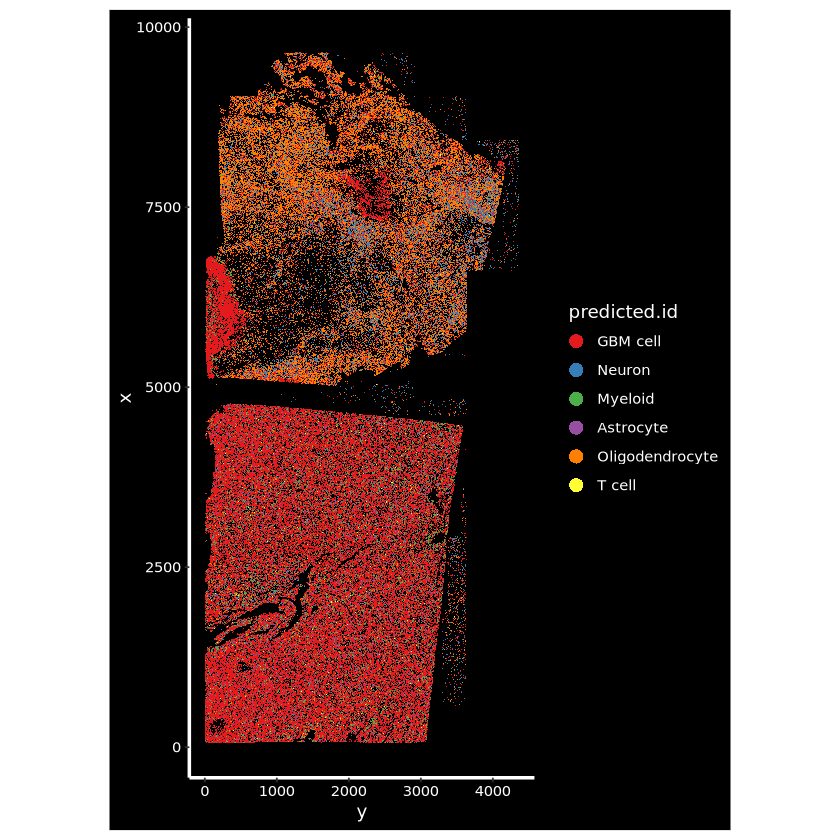

In [22]:
GBM<-readRDS("/scratch/project/stseq/Prakrithi/lnc_revision/xenium/mel/clean-data/xenium_spatial_GBM_LT.rds")

# Define the custom color palette
custom_colors <- c(
  "#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00", "#FFFF33", "#A65628",
  "#F781BF", "#999999", "#66C2A5", "#FC8D62", "#8DA0CB", "#E78AC3", "#A6D854",
  "#FFD92F", "#E5C494", "#B3B3B3"
)

# Apply the custom colors to the levels of predicted.id
names(custom_colors) <- levels(GBM$predicted.id)

# Create the ImageDimPlot with custom colors
ImageDimPlot(
  object = GBM,
  group.by = "predicted.id",
  size = 0.1,
  axes = TRUE,
  cols = custom_colors
)


Warning message:
“No FOV associated with assay 'SCT', using global default FOV”


pdf 
  2

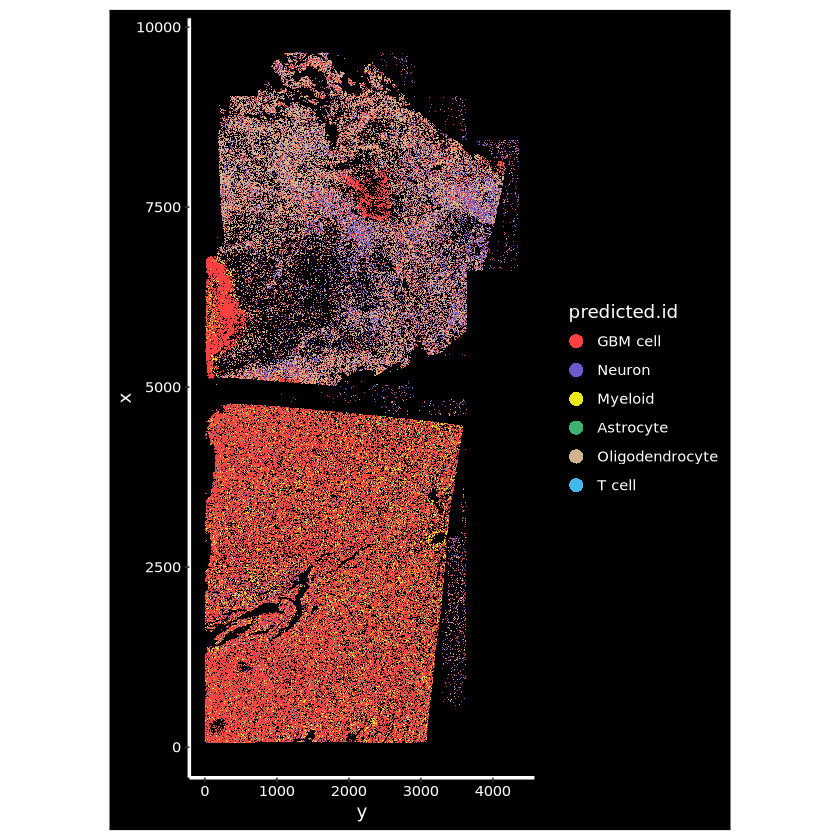

In [24]:
cell_type_colors_GBM <-c(
    "GBM cell"= "#ff4040",             # Match (Cancer Epithelial Cells)
    "Neuron"= "#6a5acd",              # New distinct (Slate Blue)
    "Myeloid"= "#eae71d",             # Match (Macrophages)
    "Astrocyte"= "#3cb371",           # New distinct green (Medium Sea Green)
    "Oligodendrocyte"= "#d2b48c",     # New distinct (Tan)
    "T cell"= "#41baeb",              # Match (CD4+ T Cells)
    "nan"= "grey"                     # Match
)
levels_in_data <- unique(GBM$predicted.id)
custom_colors <- cell_type_colors_GBM[levels_in_data]

# Plot with custom colors
P<-ImageDimPlot(
  object = GBM,
  group.by = "predicted.id",
  size = 0.1,
  axes = TRUE,
  cols = custom_colors
)

pdf("GBM_Xenium_cell_types.pdf")
P
dev.off()
P

# H&N

In [42]:
transcripts <- read_parquet("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Head_n_Neck__20250319__042625/transcripts.parquet")
write.csv(transcripts, gzfile("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Head_n_Neck__20250319__042625/transcripts.csv.gz"), row.names = FALSE)


In [17]:
HN <-LoadXenium2("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Head_n_Neck__20250319__042625/",
                  fov="fov")

10X data contains more than one type and is being returned as a list containing matrices of each type.



Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


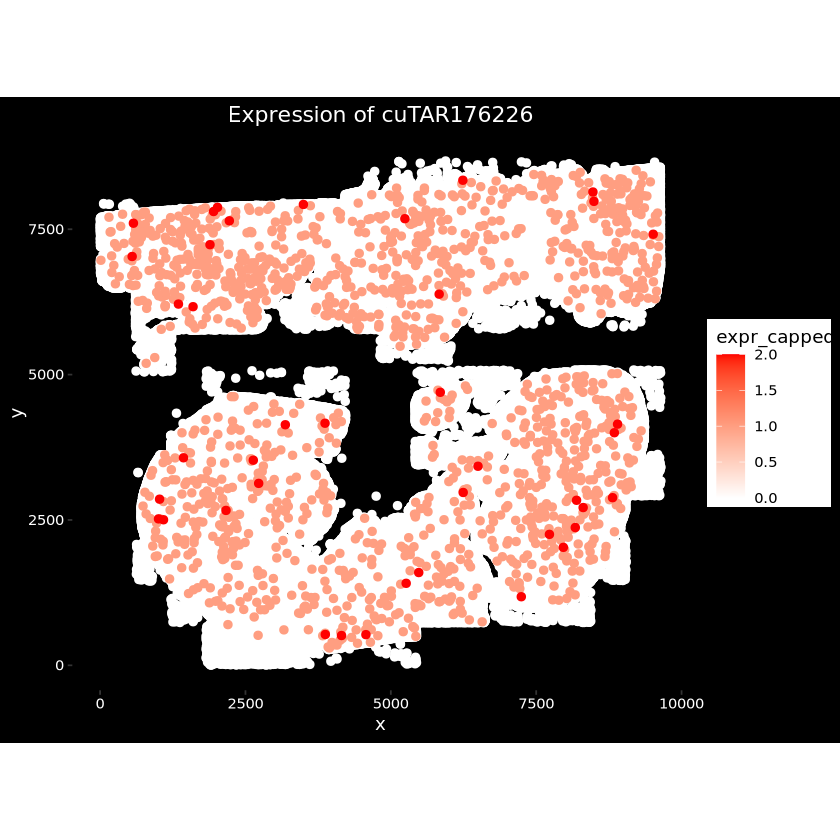

In [22]:
gene <- "cuTAR176226"
# Fetch spatial coords
coords <- GetTissueCoordinates(HN)
# Fetch expression for gene
expr <- FetchData(HN, vars = gene)[,1]
# Combine into dataframe
df <- data.frame(
  x = coords[,1],
  y = coords[,2],
  expr = expr)
# Filter max cutoff and set colors
df$expr_capped <- pmin(df$expr, 2)  # max cutoff 2
# Order points so high expression plotted last (on top)
df <- df %>% arrange(expr_capped)
# Plot with black background
ggplot(df, aes(x = x, y = y)) +
  geom_point(aes(color = expr_capped), size = 2) +
  scale_color_gradient(low = "white", high = "red") +
  coord_fixed() +
  ggtitle(paste("Expression of", gene)) +
  theme(
    panel.background = element_rect(fill = "black", color = NA),
    plot.background = element_rect(fill = "black", color = NA),
    panel.grid = element_blank(),
    axis.text = element_text(color = "white"),
    axis.title = element_text(color = "white"),
    plot.title = element_text(color = "white", hjust = 0.5)  )


Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”
Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


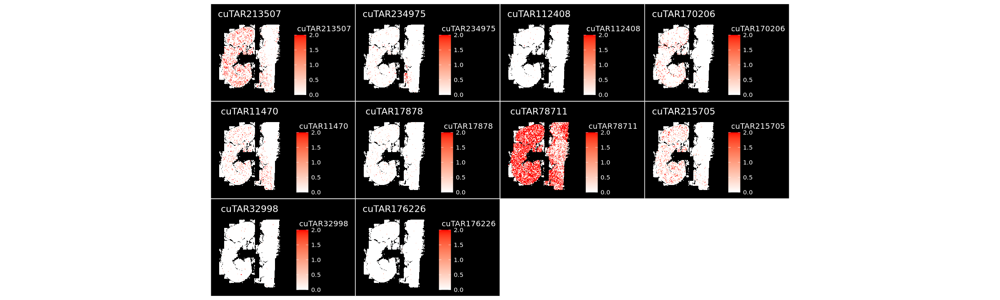

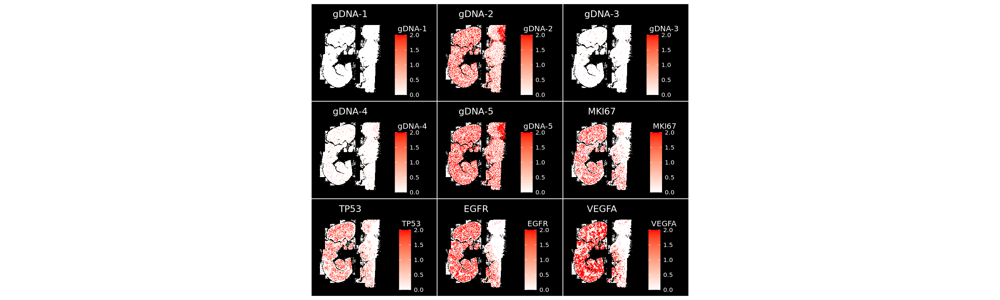

In [49]:
ImageFeaturePlot(HN, features = c("cuTAR213507","cuTAR234975","cuTAR112408","cuTAR170206","cuTAR11470","cuTAR17878",
                                 "cuTAR78711","cuTAR215705","cuTAR32998","cuTAR176226"), max.cutoff = 2, size = 0.5, cols = c("white", "red"))

ImageFeaturePlot(HN, features = c("gDNA-1","gDNA-2","gDNA-3","gDNA-4","gDNA-5","MKI67","TP53","EGFR","VEGFA"), max.cutoff = 2, size = 0.1, cols = c("white", "red"))

In [3]:
load("sc_ref/HN/GSE188737_hnscc_seu.RData")

In [27]:
'hnscc_seu'

[1] "hnscc_seu"

In [4]:
head(str(hnscc_seu))

Formal class 'Seurat' [package "Seurat"] with 13 slots


Warning message:
“Not a validObject(): no slot of name "images" for this object of class "Seurat"”


  ..@ assays      :List of 2
  .. ..$ RNA       :Formal class 'Assay' [package "Seurat"] with 8 slots


Warning message:
“Not a validObject(): no slot of name "assay.orig" for this object of class "Assay"”


  .. .. .. ..@ counts       :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:58189778] 40 67 117 128 134 141 148 178 191 216 ...
  .. .. .. .. .. ..@ p       : int [1:53460] 0 991 1687 3999 5529 8004 9193 9985 11368 12588 ...
  .. .. .. .. .. ..@ Dim     : int [1:2] 23148 53459
  .. .. .. .. .. ..@ Dimnames:List of 2
  .. .. .. .. .. .. ..$ : chr [1:23148] "RP11-34P13.7" "FO538757.3" "FO538757.2" "AP006222.2" ...
  .. .. .. .. .. .. ..$ : chr [1:53459] "AAAGCAACAAGCGCTC-1" "AAGTCTGAGGTGCTAG-1" "ACCAGTACATCTACGA-1" "ACGAGGAGTCGCGAAA-1" ...
  .. .. .. .. .. ..@ x       : num [1:58189778] 3 1 1 1 1 1 2 1 1 3 ...
  .. .. .. .. .. ..@ factors : list()
  .. .. .. ..@ data         :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:58189778] 40 67 117 128 134 141 148 178 191 216 ...
  .. .. .. .. .. ..@ p       : int [1:53460] 0 991 1687 3999 5529 8004 9193 9985 11368 12588 ...
  .. .. .. .. .. ..@ Dim 

Warning message:
“Not a validObject(): no slot of name "assay.orig" for this object of class "Assay"”


  .. .. .. ..@ counts       :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int(0) 
  .. .. .. .. .. ..@ p       : int 0
  .. .. .. .. .. ..@ Dim     : int [1:2] 0 0
  .. .. .. .. .. ..@ Dimnames:List of 2
  .. .. .. .. .. .. ..$ : NULL
  .. .. .. .. .. .. ..$ : NULL
  .. .. .. .. .. ..@ x       : num(0) 
  .. .. .. .. .. ..@ factors : list()
  .. .. .. ..@ data         :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:72006979] 0 1 2 3 6 7 8 9 10 12 ...
  .. .. .. .. .. ..@ p       : int [1:53460] 0 1111 2227 3289 4367 5465 6637 7757 8831 9928 ...
  .. .. .. .. .. ..@ Dim     : int [1:2] 2000 53459
  .. .. .. .. .. ..@ Dimnames:List of 2
  .. .. .. .. .. .. ..$ : chr [1:2000] "IGHG2" "IGKV4-1" "IGLC2" "IGHA1" ...
  .. .. .. .. .. .. ..$ : chr [1:53459] "AAAGCAACAAGCGCTC-1" "AAGTCTGAGGTGCTAG-1" "ACCAGTACATCTACGA-1" "ACGAGGAGTCGCGAAA-1" ...
  .. .. .. .. .. ..@ x       : num [1:72006979] 0.080268 0.07

Warning message:
“Not a validObject(): no slot of name "global" for this object of class "DimReduc"”


  .. .. .. ..@ cell.embeddings           : num [1:53459, 1:100] 20.5 18.6 28 24.7 25 ...
  .. .. .. .. ..- attr(*, "dimnames")=List of 2
  .. .. .. .. .. ..$ : chr [1:53459] "AAAGCAACAAGCGCTC-1" "AAGTCTGAGGTGCTAG-1" "ACCAGTACATCTACGA-1" "ACGAGGAGTCGCGAAA-1" ...
  .. .. .. .. .. ..$ : chr [1:100] "PC_1" "PC_2" "PC_3" "PC_4" ...
  .. .. .. ..@ feature.loadings          : num [1:2000, 1:100] -0.02207 -0.00929 -0.02181 -0.01335 -0.00941 ...
  .. .. .. .. ..- attr(*, "dimnames")=List of 2
  .. .. .. .. .. ..$ : chr [1:2000] "IGHG2" "IGKV4-1" "IGLC2" "IGHA1" ...
  .. .. .. .. .. ..$ : chr [1:100] "PC_1" "PC_2" "PC_3" "PC_4" ...
  .. .. .. ..@ feature.loadings.projected: num[0 , 0 ] 
  .. .. .. ..@ assay.used                : chr "integrated"
  .. .. .. ..@ stdev                     : num [1:100] 9.56 8.16 7.12 6 5.29 ...
  .. .. .. ..@ key                       : chr "PC_"
  .. .. .. ..@ jackstraw                 :Formal class 'JackStrawData' [package "Seurat"] with 4 slots
  .. .. .. .. .. 

Warning message:
“Not a validObject(): no slot of name "global" for this object of class "DimReduc"”


  .. .. .. ..@ cell.embeddings           : num [1:53459, 1:2] -11.1 -11.8 -10.8 -11.8 -11.9 ...
  .. .. .. .. ..- attr(*, "dimnames")=List of 2
  .. .. .. .. .. ..$ : chr [1:53459] "AAAGCAACAAGCGCTC-1" "AAGTCTGAGGTGCTAG-1" "ACCAGTACATCTACGA-1" "ACGAGGAGTCGCGAAA-1" ...
  .. .. .. .. .. ..$ : chr [1:2] "UMAP_1" "UMAP_2"
  .. .. .. ..@ feature.loadings          : num[0 , 0 ] 
  .. .. .. ..@ feature.loadings.projected: num[0 , 0 ] 
  .. .. .. ..@ assay.used                : chr "integrated"
  .. .. .. ..@ stdev                     : num(0) 
  .. .. .. ..@ key                       : chr "UMAP_"
  .. .. .. ..@ jackstraw                 :Formal class 'JackStrawData' [package "Seurat"] with 4 slots
  .. .. .. .. .. ..@ empirical.p.values     : num[0 , 0 ] 
  .. .. .. .. .. ..@ fake.reduction.scores  : num[0 , 0 ] 
  .. .. .. .. .. ..@ empirical.p.values.full: num[0 , 0 ] 
  .. .. .. .. .. ..@ overall.p.values       : num[0 , 0 ] 
  .. .. .. ..@ misc                      : list()
  .. .. .. ..

Warning message:
“Not a validObject(): no slot of name "assay.used" for this object of class "SeuratCommand"”


  .. .. .. ..@ name       : chr "FindIntegrationAnchors"
  .. .. .. ..@ time.stamp : POSIXct[1:1], format: "2019-07-01 22:19:57"
  .. .. .. ..@ call.string: chr [1:2] "FindIntegrationAnchors(object.list = seu3obj.list, dims = 1:30, " "    k.filter = 200)"
  .. .. .. ..@ params     :List of 11
  .. .. .. .. ..$ assay          : Named chr [1:7] "RNA" "RNA" "RNA" "RNA" ...
  .. .. .. .. .. ..- attr(*, "names")= chr [1:7] "HN237" "HN242" "HN251" "HN257" ...
  .. .. .. .. ..$ anchor.features: chr [1:2000] "IGHG2" "IGKV4-1" "IGLC2" "IGHA1" ...
  .. .. .. .. ..$ scale          : logi TRUE
  .. .. .. .. ..$ l2.norm        : logi TRUE
  .. .. .. .. ..$ dims           : int [1:30] 1 2 3 4 5 6 7 8 9 10 ...
  .. .. .. .. ..$ k.anchor       : num 5
  .. .. .. .. ..$ k.filter       : num 200
  .. .. .. .. ..$ k.score        : num 30
  .. .. .. .. ..$ max.features   : num 200
  .. .. .. .. ..$ eps            : num 0
  .. .. .. .. ..$ verbose        : logi TRUE
  .. .. .. ..@ NA         : NULL
  .. ..

Warning message:
“Not a validObject(): no slot of name "assay.used" for this object of class "SeuratCommand"”


  .. .. .. ..@ name       : chr "IntegrateData"
  .. .. .. ..@ time.stamp : POSIXct[1:1], format: "2019-07-01 22:35:28"
  .. .. .. ..@ call.string: chr "IntegrateData(anchorset = seu3obj.anchors, dims = 1:30)"
  .. .. .. ..@ params     :List of 11
  .. .. .. .. ..$ new.assay.name       : chr "integrated"
  .. .. .. .. ..$ features             : chr [1:2000] "IGHG2" "IGKV4-1" "IGLC2" "IGHA1" ...
  .. .. .. .. ..$ features.to.integrate: chr [1:2000] "IGHG2" "IGKV4-1" "IGLC2" "IGHA1" ...
  .. .. .. .. ..$ dims                 : int [1:30] 1 2 3 4 5 6 7 8 9 10 ...
  .. .. .. .. ..$ k.weight             : num 100
  .. .. .. .. ..$ sd.weight            : num 1
  .. .. .. .. ..$ sample.tree          : num [1:6, 1:2] -4 -3 -6 2 4 5 -2 -1 -7 1 ...
  .. .. .. .. ..$ preserve.order       : logi FALSE
  .. .. .. .. ..$ do.cpp               : logi TRUE
  .. .. .. .. ..$ eps                  : num 0
  .. .. .. .. ..$ verbose              : logi TRUE
  .. .. .. ..@ NA         : NULL
  .. ..$ ScaleDat

Warning message:
“Not a validObject(): no slot of name "assay.used" for this object of class "SeuratCommand"”


  .. .. .. ..@ name       : chr "ScaleData.integrated"
  .. .. .. ..@ time.stamp : POSIXct[1:1], format: "2019-07-01 22:36:21"
  .. .. .. ..@ call.string: chr "ScaleData(seu3obj.integrated, verbose = FALSE)"
  .. .. .. ..@ params     :List of 10
  .. .. .. .. ..$ features          : chr [1:2000] "IGHG2" "IGKV4-1" "IGLC2" "IGHA1" ...
  .. .. .. .. ..$ assay             : chr "integrated"
  .. .. .. .. ..$ model.use         : chr "linear"
  .. .. .. .. ..$ use.umi           : logi FALSE
  .. .. .. .. ..$ do.scale          : logi TRUE
  .. .. .. .. ..$ do.center         : logi TRUE
  .. .. .. .. ..$ scale.max         : num 10
  .. .. .. .. ..$ block.size        : num 1000
  .. .. .. .. ..$ min.cells.to.block: num 3000
  .. .. .. .. ..$ verbose           : logi FALSE
  .. .. .. ..@ NA         : NULL
  .. ..$ RunPCA.integrated           :Formal class 'SeuratCommand' [package "Seurat"] with 5 slots


Warning message:
“Not a validObject(): no slot of name "assay.used" for this object of class "SeuratCommand"”


  .. .. .. ..@ name       : chr "RunPCA.integrated"
  .. .. .. ..@ time.stamp : POSIXct[1:1], format: "2019-07-01 22:40:06"
  .. .. .. ..@ call.string: chr "RunPCA(seu3obj.integrated, npcs = npc, verbose = FALSE)"
  .. .. .. ..@ params     :List of 10
  .. .. .. .. ..$ assay          : chr "integrated"
  .. .. .. .. ..$ npcs           : num 100
  .. .. .. .. ..$ rev.pca        : logi FALSE
  .. .. .. .. ..$ weight.by.var  : logi TRUE
  .. .. .. .. ..$ verbose        : logi FALSE
  .. .. .. .. ..$ ndims.print    : int [1:5] 1 2 3 4 5
  .. .. .. .. ..$ nfeatures.print: num 30
  .. .. .. .. ..$ reduction.name : chr "pca"
  .. .. .. .. ..$ reduction.key  : chr "PC_"
  .. .. .. .. ..$ seed.use       : num 42
  .. .. .. ..@ NA         : NULL
  .. ..$ JackStraw.integrated.pca    :Formal class 'SeuratCommand' [package "Seurat"] with 5 slots


Warning message:
“Not a validObject(): no slot of name "assay.used" for this object of class "SeuratCommand"”


  .. .. .. ..@ name       : chr "JackStraw.integrated.pca"
  .. .. .. ..@ time.stamp : POSIXct[1:1], format: "2019-07-24 01:24:28"
  .. .. .. ..@ call.string: chr "JackStraw(seu3obj.integrated, num.replicate = 100, dims = npc)"
  .. .. .. ..@ params     :List of 7
  .. .. .. .. ..$ reduction    : chr "pca"
  .. .. .. .. ..$ assay        : chr "integrated"
  .. .. .. .. ..$ dims         : num 100
  .. .. .. .. ..$ num.replicate: num 100
  .. .. .. .. ..$ prop.freq    : num 0.01
  .. .. .. .. ..$ verbose      : logi TRUE
  .. .. .. .. ..$ maxit        : num 1000
  .. .. .. ..@ NA         : NULL
  .. ..$ ScoreJackStraw              :Formal class 'SeuratCommand' [package "Seurat"] with 5 slots


Warning message:
“Not a validObject(): no slot of name "assay.used" for this object of class "SeuratCommand"”


  .. .. .. ..@ name       : chr "ScoreJackStraw"
  .. .. .. ..@ time.stamp : POSIXct[1:1], format: "2019-07-24 01:24:28"
  .. .. .. ..@ call.string: chr "ScoreJackStraw(seu3obj.integrated, dims = 1:npc)"
  .. .. .. ..@ params     :List of 4
  .. .. .. .. ..$ reduction   : chr "pca"
  .. .. .. .. ..$ dims        : int [1:100] 1 2 3 4 5 6 7 8 9 10 ...
  .. .. .. .. ..$ score.thresh: num 1e-05
  .. .. .. .. ..$ do.plot     : logi FALSE
  .. .. .. ..@ NA         : NULL
  .. ..$ FindNeighbors.integrated.pca:Formal class 'SeuratCommand' [package "Seurat"] with 5 slots


Warning message:
“Not a validObject(): no slot of name "assay.used" for this object of class "SeuratCommand"”


  .. .. .. ..@ name       : chr "FindNeighbors.integrated.pca"
  .. .. .. ..@ time.stamp : POSIXct[1:1], format: "2019-07-24 14:07:03"
  .. .. .. ..@ call.string: chr "FindNeighbors(seu3obj.integrated, dims = 1:upc)"
  .. .. .. ..@ params     :List of 11
  .. .. .. .. ..$ reduction   : chr "pca"
  .. .. .. .. ..$ dims        : int [1:83] 1 2 3 4 5 6 7 8 9 10 ...
  .. .. .. .. ..$ assay       : chr "integrated"
  .. .. .. .. ..$ k.param     : num 20
  .. .. .. .. ..$ compute.SNN : logi TRUE
  .. .. .. .. ..$ prune.SNN   : num 0.0667
  .. .. .. .. ..$ nn.eps      : num 0
  .. .. .. .. ..$ verbose     : logi TRUE
  .. .. .. .. ..$ force.recalc: logi FALSE
  .. .. .. .. ..$ do.plot     : logi FALSE
  .. .. .. .. ..$ graph.name  : chr [1:2] "integrated_nn" "integrated_snn"
  .. .. .. ..@ NA         : NULL
  .. ..$ RunUMAP.integrated.pca      :Formal class 'SeuratCommand' [package "Seurat"] with 5 slots


Warning message:
“Not a validObject(): no slot of name "assay.used" for this object of class "SeuratCommand"”


  .. .. .. ..@ name       : chr "RunUMAP.integrated.pca"
  .. .. .. ..@ time.stamp : POSIXct[1:1], format: "2019-07-24 14:31:04"
  .. .. .. ..@ call.string: chr "RunUMAP(seu3obj.integrated, reduction = \"pca\", dims = 1:upc)"
  .. .. .. ..@ params     :List of 18
  .. .. .. .. ..$ dims                : int [1:83] 1 2 3 4 5 6 7 8 9 10 ...
  .. .. .. .. ..$ reduction           : chr "pca"
  .. .. .. .. ..$ assay               : chr "integrated"
  .. .. .. .. ..$ n.neighbors         : int 30
  .. .. .. .. ..$ n.components        : int 2
  .. .. .. .. ..$ metric              : chr "correlation"
  .. .. .. .. ..$ learning.rate       : num 1
  .. .. .. .. ..$ min.dist            : num 0.3
  .. .. .. .. ..$ spread              : num 1
  .. .. .. .. ..$ set.op.mix.ratio    : num 1
  .. .. .. .. ..$ local.connectivity  : int 1
  .. .. .. .. ..$ repulsion.strength  : num 1
  .. .. .. .. ..$ negative.sample.rate: int 5
  .. .. .. .. ..$ seed.use            : int 42
  .. .. .. .. ..$ angular.rp.fo

Warning message:
“Not a validObject(): no slot of name "assay.used" for this object of class "SeuratCommand"”


  .. .. .. ..@ name       : chr "FindClusters"
  .. .. .. ..@ time.stamp : POSIXct[1:1], format: "2019-07-25 13:39:08"
  .. .. .. ..@ call.string: chr "FindClusters(seu3obj.integrated, resolution = 0.6, n.start = 10)"
  .. .. .. ..@ params     :List of 9
  .. .. .. .. ..$ graph.name      : chr "integrated_snn"
  .. .. .. .. ..$ modularity.fxn  : num 1
  .. .. .. .. ..$ resolution      : num 0.6
  .. .. .. .. ..$ algorithm       : num 1
  .. .. .. .. ..$ n.start         : num 10
  .. .. .. .. ..$ n.iter          : num 10
  .. .. .. .. ..$ random.seed     : num 0
  .. .. .. .. ..$ group.singletons: logi TRUE
  .. .. .. .. ..$ verbose         : logi TRUE
  .. .. .. ..@ NA         : NULL
  ..@ tools       :List of 1
  .. ..$ Integration:Formal class 'IntegrationData' [package "Seurat"] with 7 slots
  .. .. .. ..@ neighbors         : NULL
  .. .. .. ..@ weights           : NULL
  .. .. .. ..@ integration.matrix: NULL
  .. .. .. ..@ anchors           :'data.frame':	266528 obs. of  5 variable

NULL

In [30]:
head(hnscc_seu)

,orig.ident,nCount_RNA,nFeature_RNA,sampleID,percent.mt,origin,patientID,P_Mid,seurat_clusters,genecount,cell_type
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<fct>,<fct>,<fct>
AAAGCAACAAGCGCTC-1,10X_hn,1900,991,1,3.105263,HN237P,HN237,P,0,500-1000,CAFs
AAGTCTGAGGTGCTAG-1,10X_hn,1057,696,1,9.082308,HN237P,HN237,P,0,500-1000,CAFs
ACCAGTACATCTACGA-1,10X_hn,5465,2312,1,4.299305,HN237P,HN237,P,0,1000-3000,CAFs
ACGAGGAGTCGCGAAA-1,10X_hn,3180,1530,1,5.345912,HN237P,HN237,P,0,1000-3000,CAFs
ACTGATGGTACTTCTT-1,10X_hn,5802,2475,1,3.152998,HN237P,HN237,P,0,1000-3000,CAFs
AGCCTAAAGGTTCCTA-1,10X_hn,2281,1189,1,7.756354,HN237P,HN237,P,0,1000-3000,CAFs
AGCTTGATCCGTTGTC-1,10X_hn,1301,792,1,4.528012,HN237P,HN237,P,0,500-1000,CAFs
AGGTCCGGTCATGCAT-1,10X_hn,3273,1383,1,3.817960,HN237P,HN237,P,0,1000-3000,CAFs
ATGAGGGTCCTGTACC-1,10X_hn,2349,1220,1,2.596850,HN237P,HN237,P,0,1000-3000,CAFs


In [34]:
unique(hnscc_seu@meta.data$cell_type)

[1] CAFs         B cells      Epithelial   TAMs         Endothelial 
 [6] T cells      Myofib       Salivary     NK           plasma cells
[11] pDC          mature DC    Mast cells  
13 Levels: Epithelial Salivary CAFs Myofib Endothelial NK T cells ... Mast cells

In [6]:
hnscc_seu@assays

$RNA
Assay data with 23148 features for 53459 cells
First 10 features:
 RP11-34P13.7, FO538757.3, FO538757.2, AP006222.2, RP4-669L17.10,
RP5-857K21.4, RP11-206L10.9, FAM87B, LINC00115, FAM41C 

$integrated
Assay data with 2000 features for 53459 cells
Top 10 variable features:
 IGHG2, IGKV4-1, IGLC2, IGHA1, IGKV1-39, SPP1, IGKV3-20, JCHAIN,
PLA2G2A, CCL19 


In [7]:
hn_s <- CreateSeuratObject(counts = hnscc_seu@assays$RNA@counts, meta.data = hnscc_seu@meta.data)
hn_s

An object of class Seurat 
23148 features across 53459 samples within 1 assay 
Active assay: RNA (23148 features, 0 variable features)
 1 layer present: counts

In [8]:
saveRDS(hn_s,"sc_ref/HN/GSE188737_hnscc_seu.rds")

Warning message:
“No FOV associated with assay 'SCT', using global default FOV”


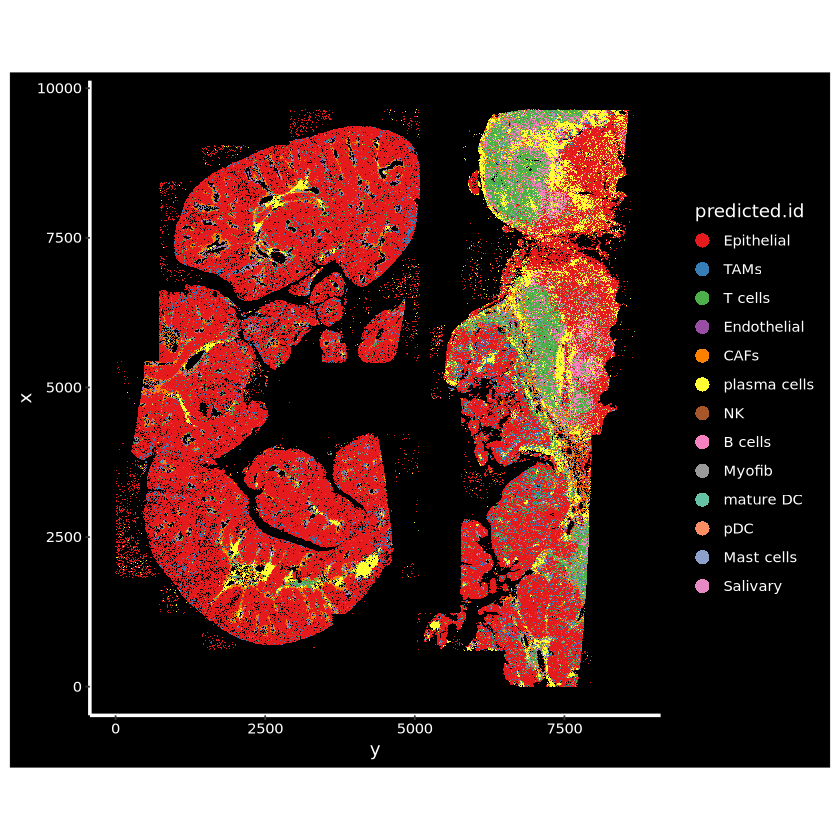

In [18]:
HN<-readRDS("/scratch/project/stseq/Prakrithi/lnc_revision/xenium/mel/clean-data/xenium_spatial_HN_LT.rds")



# Define the custom color palette
custom_colors <- c(
  "#E41A1C", "#377EB8", "#4DAF4A", "#984EA3", "#FF7F00", "#FFFF33", "#A65628",
  "#F781BF", "#999999", "#66C2A5", "#FC8D62", "#8DA0CB", "#E78AC3", "#A6D854",
  "#FFD92F", "#E5C494", "#B3B3B3"
)

# Apply the custom colors to the levels of predicted.id
names(custom_colors) <- levels(HN$predicted.id)

# Create the ImageDimPlot with custom colors
ImageDimPlot(
  object = HN,
  group.by = "predicted.id",
  size = 0.1,
  axes = TRUE,
  cols = custom_colors
)


Warning message:
“No FOV associated with assay 'SCT', using global default FOV”


pdf 
  2

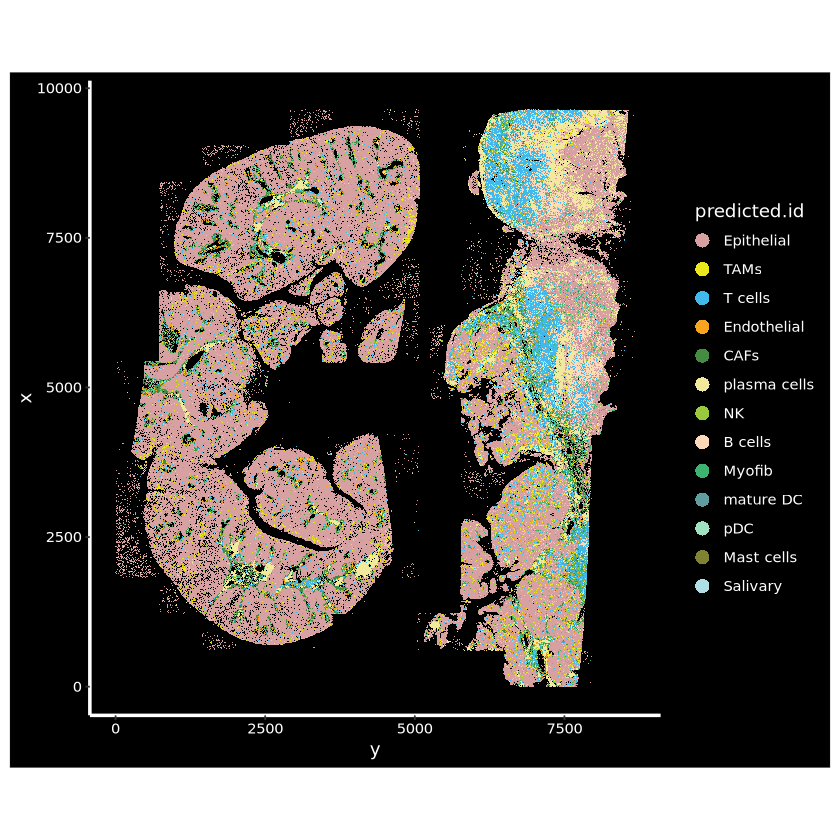

In [20]:
cell_type_colors_HN <- c(
    "Endothelial"= "#f8a41e",          # Match (Endothelial Cells)
    "TAMs"= "#eae71d",                 # Match (Macrophages)
    "T cells"= "#41baeb",             # Match (CD4+ T Cells)
    "Epithelial"= "#d8a1a1",          # Match
    "CAFs"= "#458b41",                # Match (Fibroblasts)
    "plasma cells"= "#f1ea9d",        # Match
    "NK"= "#99ca3e",                  # Match
    "B cells"= "#fed9b9",             # Match
    "Myofib"= "#3cb371",              # New distinct green (Medium Sea Green)
    "mature DC"= "#5f9d9e",           # Match (Dendritic Cells)
    "pDC"= "#9fe2bf",                 # New distinct (Light Mint Green)
    "Mast cells"= "#7f8133",          # Match
    "Salivary"= "#b0e0e6",            # New distinct (Powder Blue)
    "nan"= "grey"  )                   # Match
# Ensure factor levels match the names in the color vector
levels_in_data <- unique(HN$predicted.id)
custom_colors <- cell_type_colors_HN[levels_in_data]

# Plot with custom colors
P<-ImageDimPlot(
  object = HN,
  group.by = "predicted.id",
  size = 0.1,
  axes = TRUE,
  cols = custom_colors
)

pdf("HN_Xenium_cell_types.pdf")
P
dev.off()
P

Warning message:
“No FOV associated with assay 'SCT', using global default FOV”


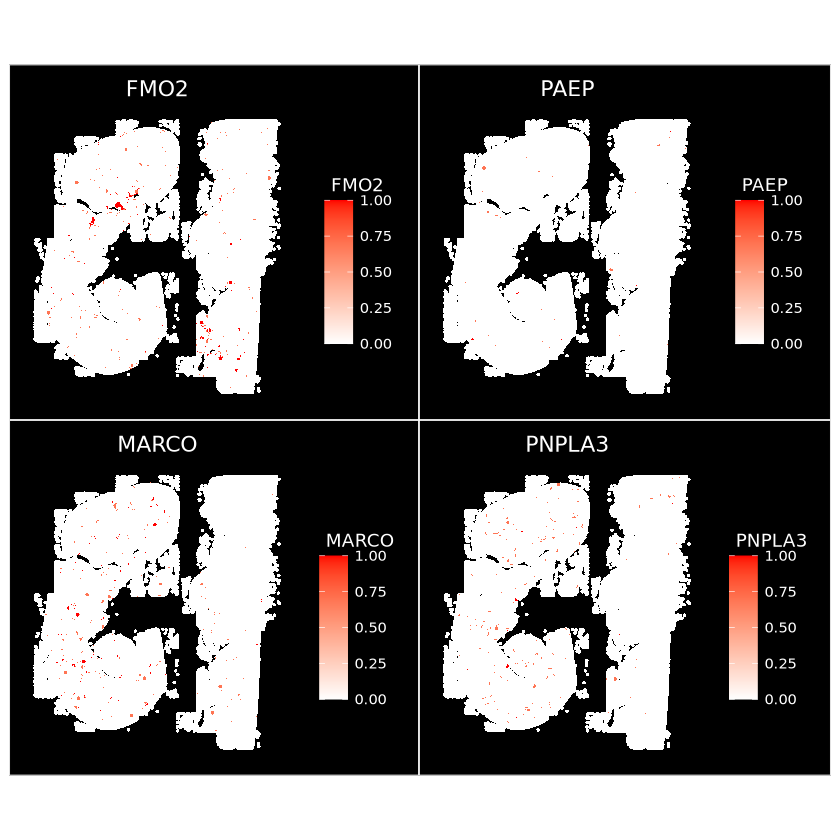

In [7]:
ImageFeaturePlot(HN, features = c("FMO2","PAEP","MARCO","PNPLA3"), max.cutoff = 1, size = 1, 
                 cols = c("white", "red"))

Warning message:
“No FOV associated with assay 'SCT', using global default FOV”


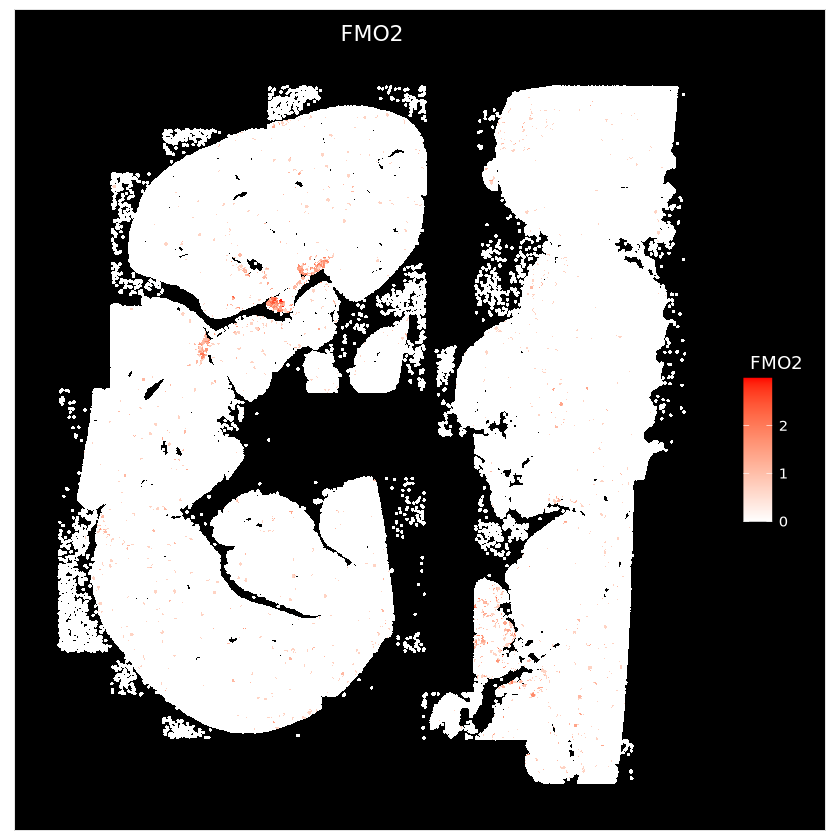

In [8]:
# Fetch expression for the feature
df <- FetchData(HN, vars = "FMO2")
df$cell <- rownames(df)

# Order cells by expression
ordered_cells <- df[order(df$FMO2), "cell"]

# Plot with custom cell order
ImageFeaturePlot(HN, 
                 features = "FMO2", 
                 cells = ordered_cells,
                 size = 1, 
                 cols = c("white", "red"))


# Melanoma

In [51]:
transcripts <- read_parquet("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__Melanoma__20250319__042625/transcripts.parquet")
write.csv(transcripts, gzfile("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__Melanoma__20250319__042625/transcripts.csv.gz"), row.names = FALSE)


In [3]:
Melanoma <-LoadXenium2("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__Melanoma__20250319__042625/",
                  fov="fov")

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


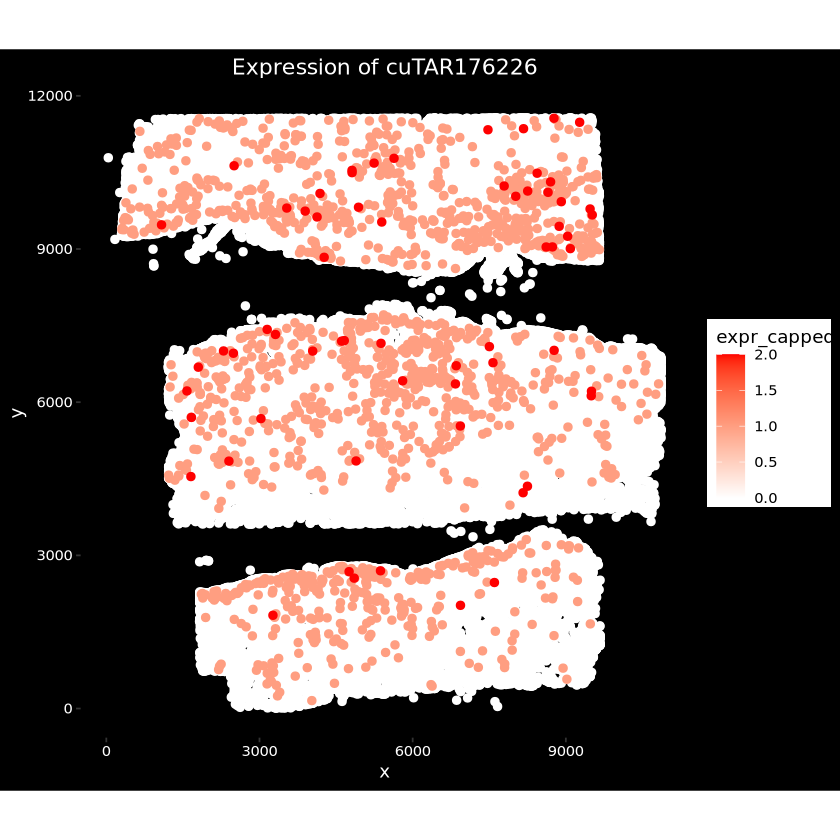

In [20]:
gene <- "cuTAR176226"
# Fetch spatial coords
coords <- GetTissueCoordinates(Melanoma)
# Fetch expression for gene
expr <- FetchData(Melanoma, vars = gene)[,1]
# Combine into dataframe
df <- data.frame(
  x = coords[,1],
  y = coords[,2],
  expr = expr)
# Filter max cutoff and set colors
df$expr_capped <- pmin(df$expr, 2)  # max cutoff 2
# Order points so high expression plotted last (on top)
df <- df %>% arrange(expr_capped)
# Plot with black background
ggplot(df, aes(x = x, y = y)) +
  geom_point(aes(color = expr_capped), size = 2) +
  scale_color_gradient(low = "white", high = "red") +
  coord_fixed() +
  ggtitle(paste("Expression of", gene)) +
  theme(
    panel.background = element_rect(fill = "black", color = NA),
    plot.background = element_rect(fill = "black", color = NA),
    panel.grid = element_blank(),
    axis.text = element_text(color = "white"),
    axis.title = element_text(color = "white"),
    plot.title = element_text(color = "white", hjust = 0.5)  )


Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”
Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


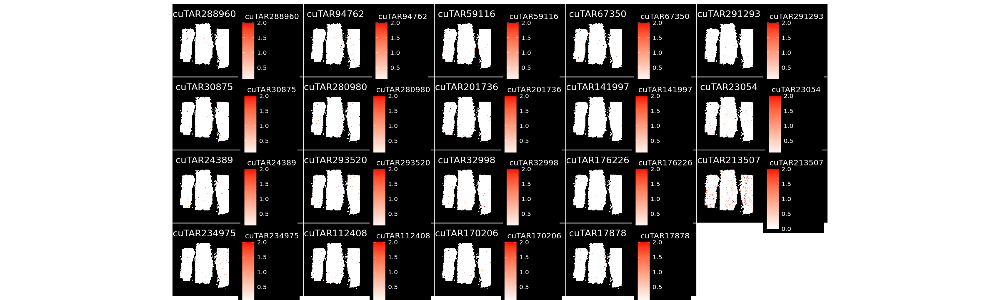

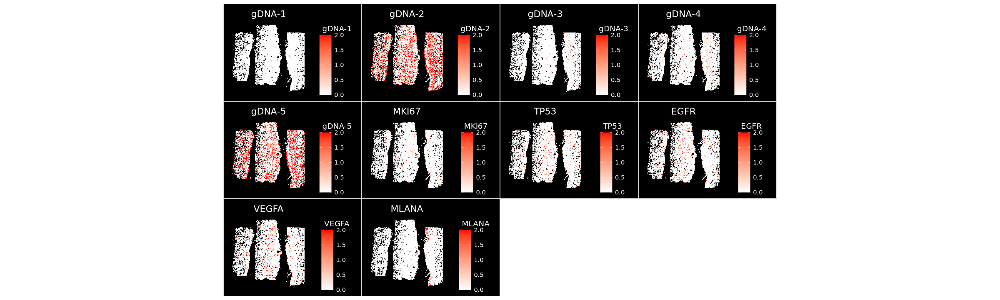

In [53]:
ImageFeaturePlot(Melanoma, features = c("cuTAR288960",
"cuTAR94762",
"cuTAR59116",
"cuTAR67350",
"cuTAR291293",
"cuTAR30875",
"cuTAR280980",
"cuTAR201736",
"cuTAR141997",
"cuTAR23054",
"cuTAR24389",
"cuTAR293520",
    "cuTAR32998","cuTAR176226","cuTAR213507","cuTAR234975",
                                 "cuTAR112408","cuTAR170206","cuTAR17878"), max.cutoff = 2, size = 0.5, cols = c("white", "red"))


ImageFeaturePlot(Melanoma, features = c("gDNA-1","gDNA-2","gDNA-3","gDNA-4","gDNA-5","MKI67","TP53","EGFR","VEGFA","MLANA"), max.cutoff = 2, size = 0.1, cols = c("white", "red"))

In [5]:
saveRDS(Melanoma,"/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__Melanoma__20250319__042625/Mel_loaded.rds")


In [5]:
m<-read.csv("mel/clean-data/Melanoma_LT_subsetted_ref.csv")
head(m)
dim(m)
Melanoma

,X,predicted.id,prediction.score.KC.Cornified,prediction.score.KC.Differentiating,prediction.score.T.Cell,prediction.score.KC.Hair,prediction.score.DC,prediction.score.NK,prediction.score.Fibroblast,prediction.score.KC.Basal,prediction.score.Melanocytes,prediction.score.Endothelial.Cell,prediction.score.Sweat.gland.related,prediction.score.Pericytes,prediction.score.KC.Granular,prediction.score.Macrophage,prediction.score.B.Cell,prediction.score.Mast.Cell,prediction.score.LC,prediction.score.max
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,aaaafcpg-1,KC Granular,0.36630497,0.00000000,0.00000000,0.00000000,0.00000000,0.000000,0,0.00000000,0.0000000,0,0,0,0.63369503,0,0.000000,0,0,0.6336950
2,aaaanfog-1,KC Differentiating,0.00000000,0.58686409,0.00000000,0.00000000,0.00000000,0.000000,0,0.00000000,0.0000000,0,0,0,0.41313591,0,0.000000,0,0,0.5868641
3,aaabjafo-1,KC Granular,0.30873389,0.00000000,0.00000000,0.00000000,0.00000000,0.000000,0,0.00000000,0.0000000,0,0,0,0.69126611,0,0.000000,0,0,0.6912661
4,aaabnmom-1,KC Cornified,0.64732121,0.17836566,0.00000000,0.05652624,0.00000000,0.000000,0,0.01952946,0.0000000,0,0,0,0.09825742,0,0.000000,0,0,0.6473212
5,aaaboeeh-1,NK,0.02863125,0.08110815,0.07792257,0.16116208,0.01463544,0.276557,0,0.18650676,0.1407677,0,0,0,0.00000000,0,0.032709,0,0,0.2765570
6,aaacfidn-1,KC Cornified,0.83613872,0.04589798,0.00000000,0.04360390,0.00000000,0.000000,0,0.02185188,0.0000000,0,0,0,0.05250752,0,0.000000,0,0,0.8361387


[1] 248057     20

An object of class Seurat 
541 features across 251604 samples within 3 assays 
Active assay: Xenium (480 features, 0 variable features)
 1 layer present: counts
 2 other assays present: ControlCodeword, ControlProbe
 1 spatial field of view present: fov

In [6]:
# Subset Melanoma to keep only cells present in m$X
Melanoma <- subset(Melanoma, cells = m$X)
# Ensure m is ordered to match colnames(Melanoma)
m <- m[match(colnames(Melanoma), m$X), ]


Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


In [8]:
dim(m)
Melanoma
m[23234,]
Melanoma@meta.data[23234,]

[1] 248057     20

An object of class Seurat 
541 features across 248057 samples within 3 assays 
Active assay: Xenium (480 features, 0 variable features)
 1 layer present: counts
 2 other assays present: ControlCodeword, ControlProbe
 1 spatial field of view present: fov

,X,predicted.id,prediction.score.KC.Cornified,prediction.score.KC.Differentiating,prediction.score.T.Cell,prediction.score.KC.Hair,prediction.score.DC,prediction.score.NK,prediction.score.Fibroblast,prediction.score.KC.Basal,prediction.score.Melanocytes,prediction.score.Endothelial.Cell,prediction.score.Sweat.gland.related,prediction.score.Pericytes,prediction.score.KC.Granular,prediction.score.Macrophage,prediction.score.B.Cell,prediction.score.Mast.Cell,prediction.score.LC,prediction.score.max
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
23234,bfhobljd-1,KC Cornified,0.9743017,0,0,0,0,0,0,0,0,0,0,0,0.02569835,0,0,0,0,0.9743017


,orig.ident,nCount_Xenium,nFeature_Xenium,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe
,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>
bfhobljd-1,SeuratProject,444,41,0,0,0,0


pdf 
  2

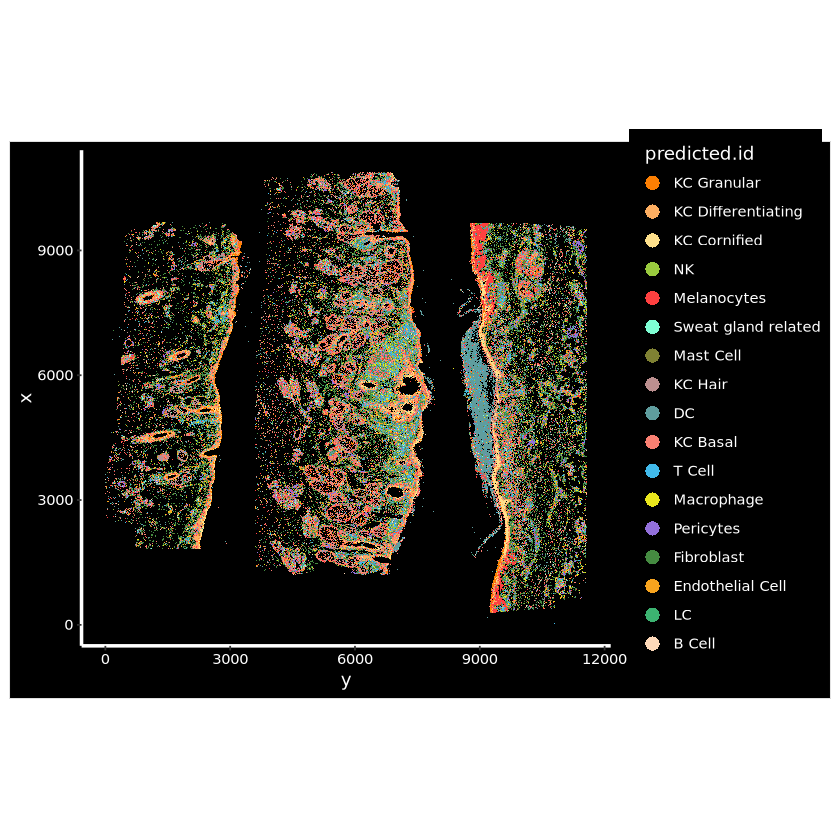

In [11]:
Melanoma@meta.data$predicted.id<-m$predicted.id
# Define your custom color palette
cell_type_colors <-c(
    "KC Granular"= "#fc7f03",      
    "KC Differentiating"= "#fdae61", # New distinct color
    "KC Cornified"= "#fee08b",       # New distinct color
    "NK"= "#99ca3e",                 # Match from BREAST_colors
    "Melanocytes"= "#ff4040",        # New distinct color
    "Sweat gland related"= "#7fffd4",# New distinct color
    "Mast Cell"= "#7f8133",          # Match from BREAST_colors
    "KC Hair"= "#bc8f8f",            # New distinct color
    "DC"= "#5f9d9e",                 # Match from BREAST_colors ("Dendritic Cells")
    "KC Basal"= "#fa8072",           # New distinct color
    "T Cell"= "#41baeb",             # Match (CD4+ T Cells color)
    "Macrophage"= "#eae71d",         # Match from BREAST_colors
    "Pericytes"= "#9370db",          # New distinct color
    "Fibroblast"= "#458b41",         # Match from BREAST_colors
    "Endothelial Cell"= "#f8a41e",   # Match from BREAST_colors
    "LC"= "#3cb371",                 # New distinct color
    "B Cell"= "#fed9b9",             # Match from BREAST_colors
    "nan"= "grey"                    # Same as in BREAST_colors
)


Melanoma$predicted.id<-m$predicted.id
# Ensure factor levels match the names in the color vector
levels_in_data <- unique(Melanoma$predicted.id)
custom_colors <- cell_type_colors[levels_in_data]

# Plot with custom colors
P<-ImageDimPlot(
  object = Melanoma,
  group.by = "predicted.id",
  size = 0.1,
  axes = TRUE,
  cols = custom_colors
)

pdf("Melanoma_Xenium_cell_types.pdf")
P
dev.off()
P

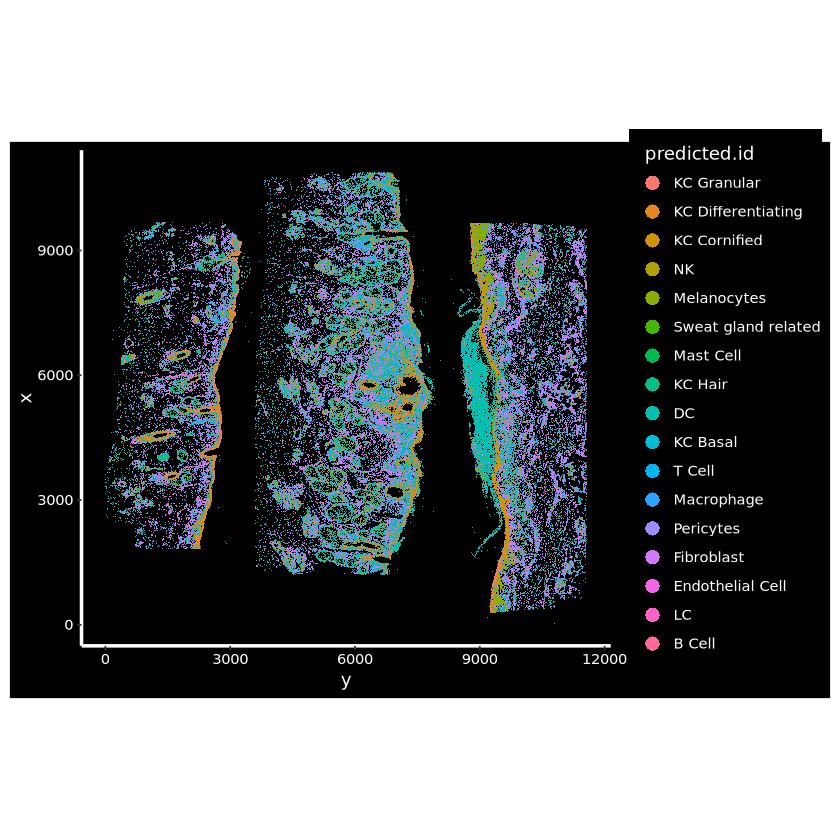

In [11]:
ImageDimPlot(Melanoma, group.by = "predicted.id", size = 0.1, axes=TRUE)


Warning message in brewer.pal(n = length(x = levels(x = molecules$molecule)), name = "Set1"):
“minimal value for n is 3, returning requested palette with 3 different levels
”


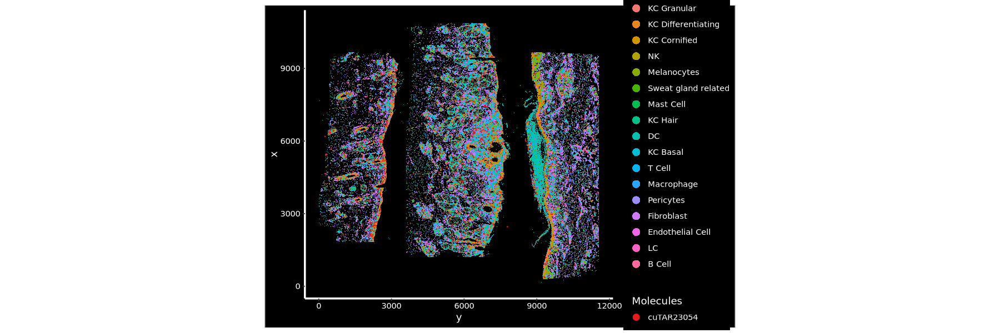

In [39]:

ImageDimPlot(Melanoma, group.by = "predicted.id", size = 0.05, axes=TRUE,molecules = c("cuTAR23054","MALAT"), nmols = 1000)# axes=TRUE)


In [12]:
saveRDS(Melanoma,"/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__Melanoma__20250319__042625/Mel_LT.rds")


In [1]:
Melanoma<-readRDS("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__Melanoma__20250319__042625/Mel_LT.rds")


In [2]:
Melanoma

Loading required package: SeuratObject

Warning message:
“package ‘SeuratObject’ was built under R version 4.4.1”
Loading required package: sp

Warning message:
“package ‘sp’ was built under R version 4.4.1”
‘SeuratObject’ was built with package ‘Matrix’ 1.6.5 but the current
version is 1.7.1; it is recomended that you reinstall ‘SeuratObject’ as
the ABI for ‘Matrix’ may have changed


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t




An object of class Seurat 
541 features across 248057 samples within 3 assays 
Active assay: Xenium (480 features, 0 variable features)
 1 layer present: counts
 2 other assays present: ControlCodeword, ControlProbe
 1 spatial field of view present: fov

In [3]:
# Define threshold
min.cells <- 3

# Calculate how many cells express each gene
gene_counts <- Matrix::rowSums(GetAssayData(Melanoma, slot = "counts") > 0)

# Filter genes
genes_to_keep <- names(gene_counts[gene_counts >= min.cells])
Melanoma <- subset(Melanoma, features = genes_to_keep)


Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


In [4]:
Melanoma

An object of class Seurat 
480 features across 248057 samples within 1 assay 
Active assay: Xenium (480 features, 0 variable features)
 1 layer present: counts
 1 spatial field of view present: fov

Warning message:
“Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead.”


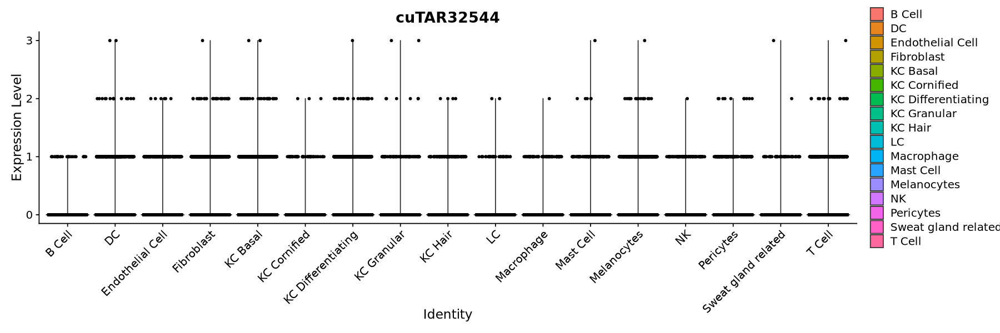

In [14]:
options(repr.plot.width = 15, repr.plot.height = 5)

# Replace 'YourGene' with the gene you want to plot
VlnPlot(Melanoma, features = "cuTAR32544", group.by = "predicted.id") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels if needed


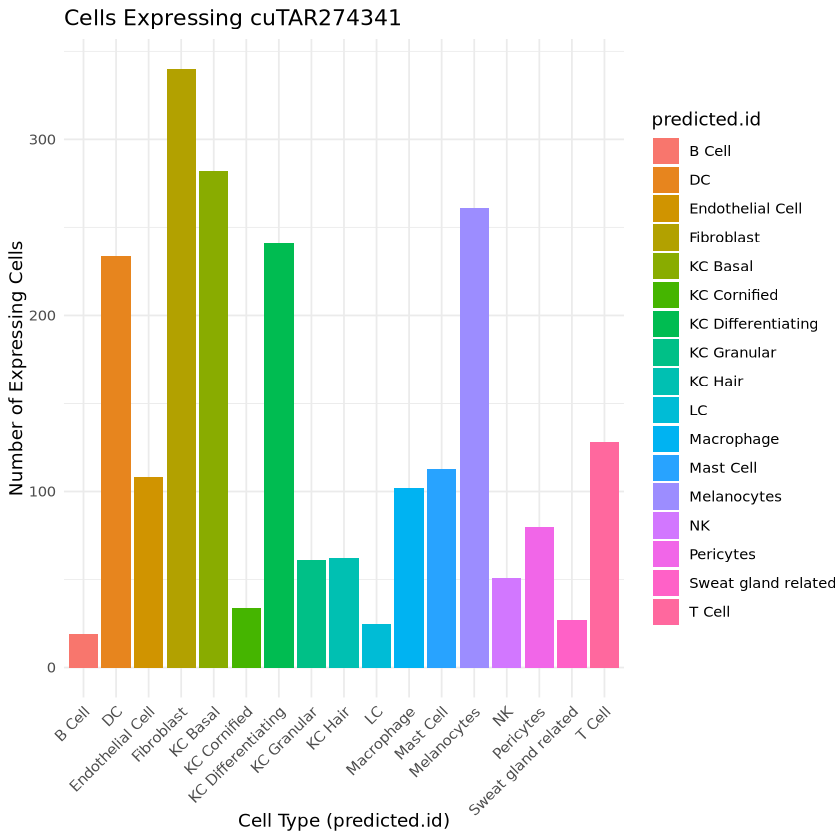

In [7]:
# Define gene of interest
gene <- "cuTAR274341"#"cuTAR293520" #"cuTAR201736" #"cuTAR23054"

# Extract expression matrix
expr_matrix <- as.data.frame(GetAssayData(Melanoma, slot = "counts"))

# Identify cells expressing the gene (nonzero counts)
expr_cells <- colnames(expr_matrix)[expr_matrix[gene, ] > 0]

# Create a data frame for plotting
expr_df <- data.frame(
  cell = expr_cells,
  predicted.id = Melanoma$predicted.id[expr_cells]
)

# Count the number of cells per `predicted.id`
expr_counts <- expr_df %>%
  group_by(predicted.id) %>%
  summarise(num_cells = n())

# Bar plot of expressing cells by `predicted.id`
ggplot(expr_counts, aes(x = predicted.id, y = num_cells, fill = predicted.id)) +
  geom_bar(stat = "identity") +
  theme_minimal() +
  labs(x = "Cell Type (predicted.id)", y = "Number of Expressing Cells", title = paste("Cells Expressing", gene)) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))


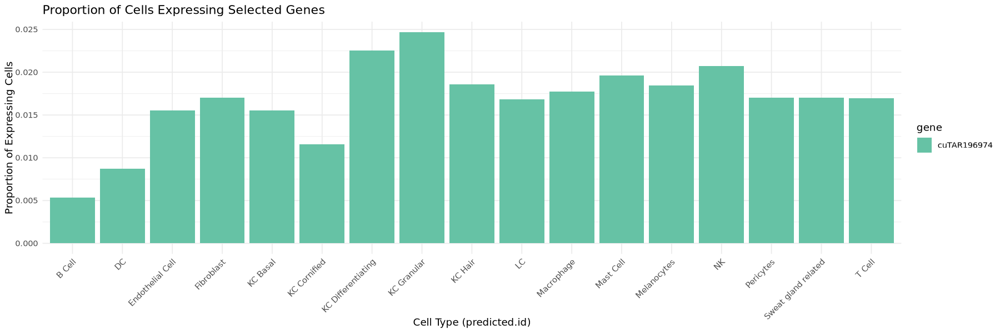

In [10]:
# Define genes of interest (can be one or multiple genes)
genes <- c("cuTAR196974") #, "Gene2", "Gene3")  # Replace with your genes
options(repr.plot.width = 15, repr.plot.height = 5)


# Extract expression matrix
expr_matrix <- as.data.frame(GetAssayData(Melanoma, slot = "counts"))

# Filter for selected genes
expr_matrix <- expr_matrix[rownames(expr_matrix) %in% genes, ]

# Identify cells expressing each gene
expr_long <- as.data.frame(t(expr_matrix)) %>%
  mutate(cell = rownames(.)) %>%
  pivot_longer(cols = all_of(genes), names_to = "gene", values_to = "expression") %>%
  mutate(expression_binary = ifelse(expression > 0, 1, 0))  # Convert to 1 (expressed) or 0 (not)

# Add predicted.id information
expr_long$predicted.id <- Melanoma$predicted.id[expr_long$cell]

# Calculate proportion of expressing cells per cell type
expr_counts <- expr_long %>%
  group_by(gene, predicted.id) %>%
  summarise(
    num_expressing = sum(expression_binary),
    total_cells = n(),
    prop_expressing = num_expressing / total_cells,
    .groups = "drop"
  )

# Plot as a grouped bar plot (proportion)
ggplot(expr_counts, aes(x = predicted.id, y = prop_expressing, fill = gene)) +
  geom_bar(stat = "identity", position = "dodge") +
  theme_minimal() +
  labs(x = "Cell Type (predicted.id)", y = "Proportion of Expressing Cells", 
       title = "Proportion of Cells Expressing Selected Genes") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  scale_fill_brewer(palette = "Set2")  # Adjust colors if needed


In [34]:
library(sf)

ERROR: Error in library(sf): there is no package called ‘sf’


# Colorectal

In [55]:
transcripts <- read_parquet("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Colorectal__20250319__042625/transcripts.parquet")
write.csv(transcripts, gzfile("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Colorectal__20250319__042625/transcripts.csv.gz"), row.names = FALSE)


In [12]:
CRC <-LoadXenium2("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Colorectal__20250319__042625/",
                  fov="fov")

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [41]:
CRC <- subset(CRC, subset = nCount_Xenium > 0)

Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


In [42]:
saveRDS(CRC,"/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Colorectal__20250319__042625/CRC_loaded.rds")


In [5]:
#CRC<-readRDS("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016987__Colorectal__20250319__042625/CRC_loaded.rds")

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


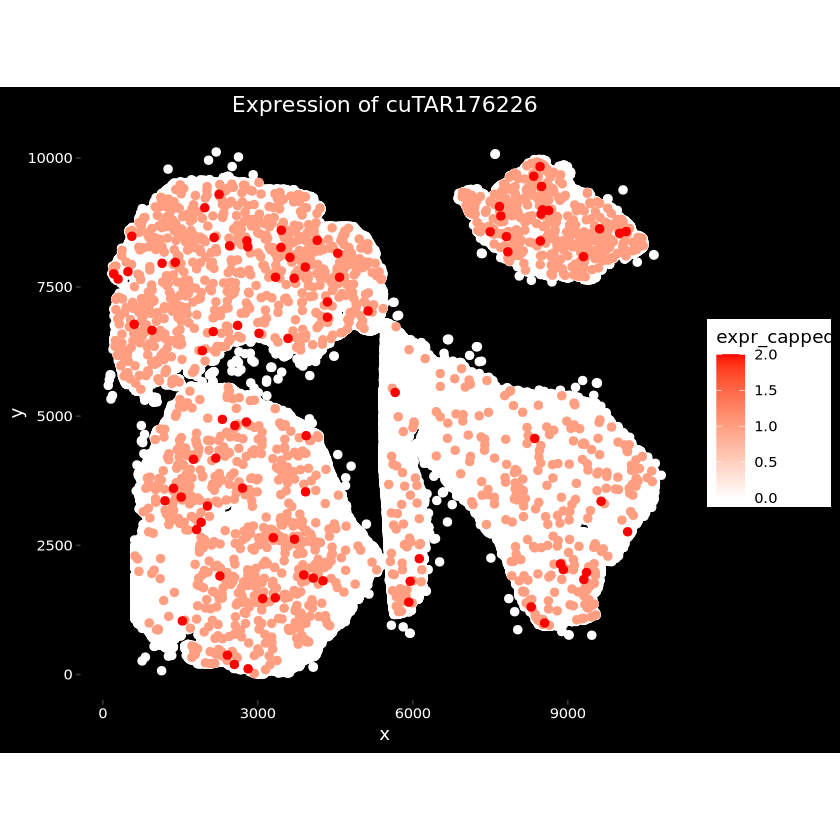

In [16]:
library(Seurat)
library(ggplot2)
library(dplyr)

gene <- "cuTAR176226"

# Fetch spatial coords
coords <- GetTissueCoordinates(CRC)

# Fetch expression for gene
expr <- FetchData(CRC, vars = gene)[,1]

# Combine into dataframe
df <- data.frame(
  x = coords[,1],
  y = coords[,2],
  expr = expr
)

# Filter max cutoff and set colors
df$expr_capped <- pmin(df$expr, 2)  # max cutoff 2

# Order points so high expression plotted last (on top)
df <- df %>% arrange(expr_capped)

# Plot with black background
ggplot(df, aes(x = x, y = y)) +
  geom_point(aes(color = expr_capped), size = 2) +
  scale_color_gradient(low = "white", high = "red") +
  coord_fixed() +
  ggtitle(paste("Expression of", gene)) +
  theme(
    panel.background = element_rect(fill = "black", color = NA),
    plot.background = element_rect(fill = "black", color = NA),
    panel.grid = element_blank(),
    axis.text = element_text(color = "white"),
    axis.title = element_text(color = "white"),
    plot.title = element_text(color = "white", hjust = 0.5)
  )


Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”
Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


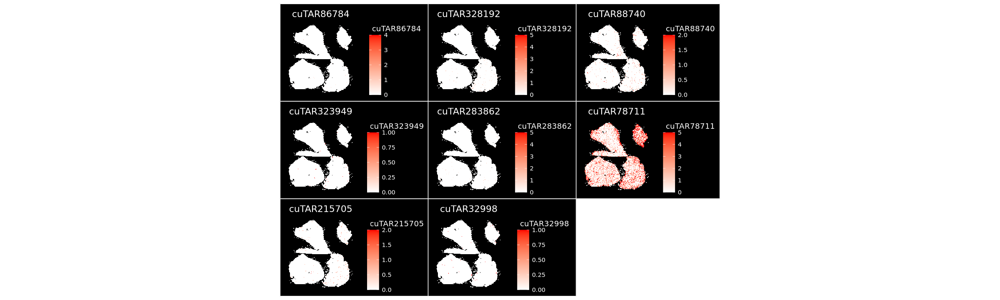

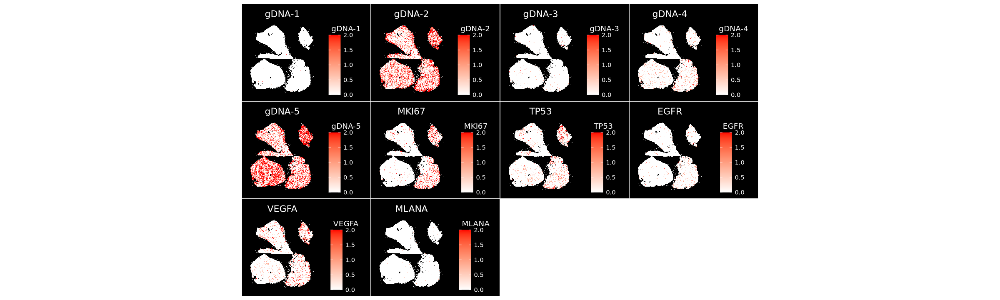

In [58]:
ImageFeaturePlot(CRC, features = c("cuTAR86784","cuTAR328192","cuTAR88740","cuTAR323949","cuTAR283862",
    "cuTAR78711","cuTAR215705","cuTAR32998"), max.cutoff = c(10,
    5, 2, 1), size = 0.5, cols = c("white", "red"))


ImageFeaturePlot(CRC, features = c("gDNA-1","gDNA-2","gDNA-3","gDNA-4","gDNA-5","MKI67","TP53","EGFR","VEGFA","MLANA"), max.cutoff = 2, size = 0.1, cols = c("white", "red"))

Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”
Warning message in brewer.pal(n = length(x = levels(x = molecules$molecule)), name = "Set1"):
“minimal value for n is 3, returning requested palette with 3 different levels
”


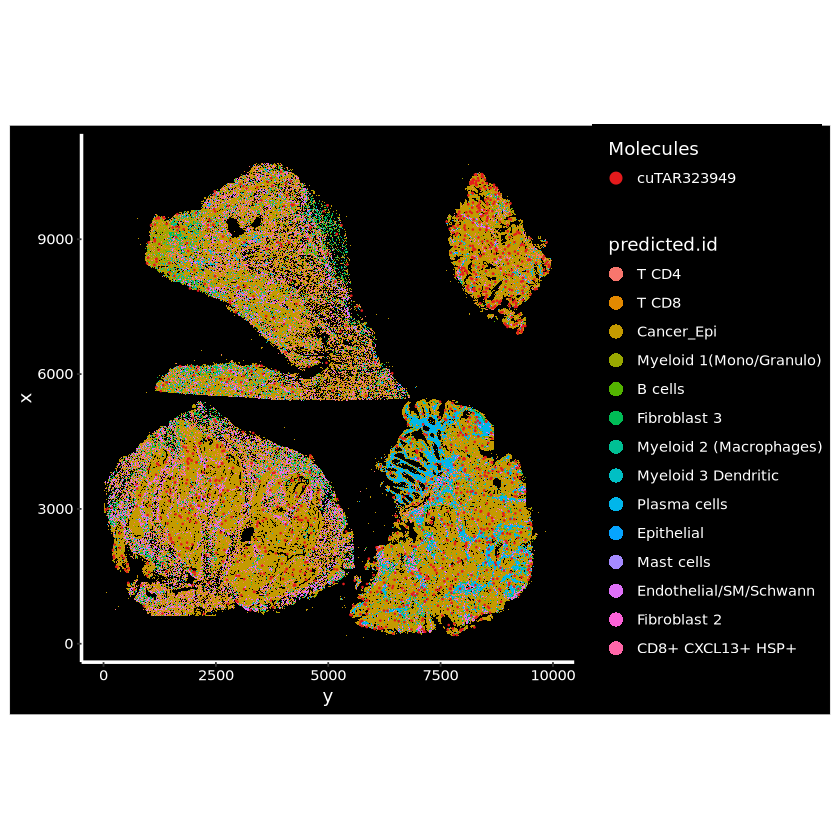

In [14]:
m<-read.csv("mel/clean-data/Colorectal_LT_subsetted_ref.csv")

# Subset Melanoma to keep only cells present in m$X
CRC <- subset(CRC, cells = m$X)
# Ensure m is ordered to match colnames(Melanoma)
m <- m[match(colnames(CRC), m$X), ]

CRC@meta.data$predicted.id<-m$predicted.id
ImageDimPlot(CRC, group.by = "predicted.id", size = 0.05, axes=TRUE,molecules = c("cuTAR323949"), nmols = 10000)# axes=TRUE)

pdf 
  2

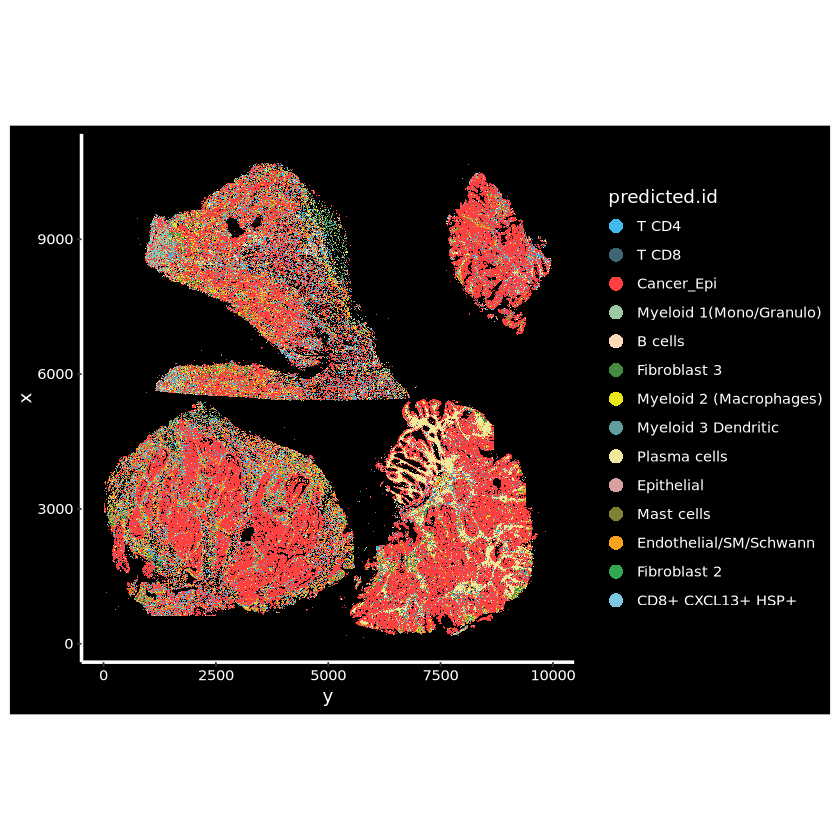

In [16]:
cell_type_colors_CRC <- c(
    "T CD4"= "#41baeb",                  # Match (CD4+ T Cells)
    "T CD8"= "#406573",                  # Match (CD8+ T Cells)
    "Cancer_Epi"= "#ff4040",            # Match (Cancer Epithelial Cells)
    "Myeloid 1(Mono/Granulo)"= "#9cc7a1", # Match (Monocytes)
    "B cells"= "#fed9b9",               # Match
    "Fibroblast 3"= "#458b41",          # Match
    "Myeloid 2 (Macrophages)"= "#eae71d",# Match
    "Myeloid 3 Dendritic"= "#5f9d9e",   # Match
    "Plasma cells"= "#f1ea9d",          # Match
    "Epithelial"= "#d8a1a1",            # Match (Epithelial Cells)
    "Mast cells"= "#7f8133",            # Match
    "Endothelial/SM/Schwann"= "#f8a41e",# New distinct color (Coral)
    "nan"= "grey",                      # Match
    "Fibroblast 2"= "#32a852",          # New distinct green (not in BREAST)
    "CD8+ CXCL13+ HSP+"= "#7ec8e3"      # New distinct blue
)

# Ensure factor levels match the names in the color vector
levels_in_data <- unique(CRC$predicted.id)
custom_colors <- cell_type_colors_CRC[levels_in_data]

# Plot with custom colors
P<-ImageDimPlot(
  object = CRC,
  group.by = "predicted.id",
  size = 0.1,
  axes = TRUE,
  cols = custom_colors
)

pdf("CRC_Xenium_cell_types.pdf")
P
dev.off()
P

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”
Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


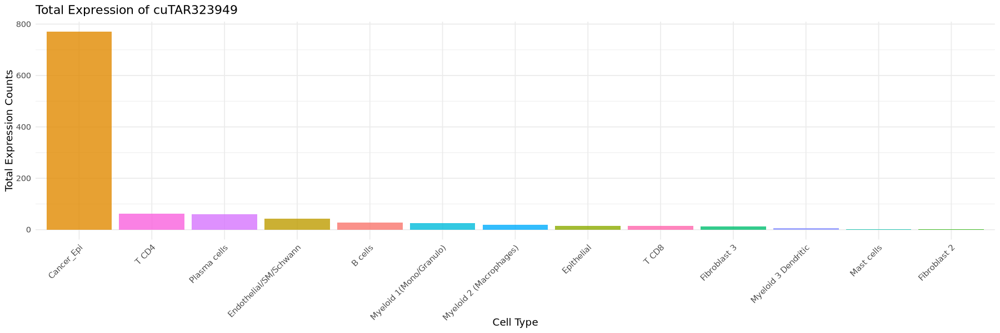

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


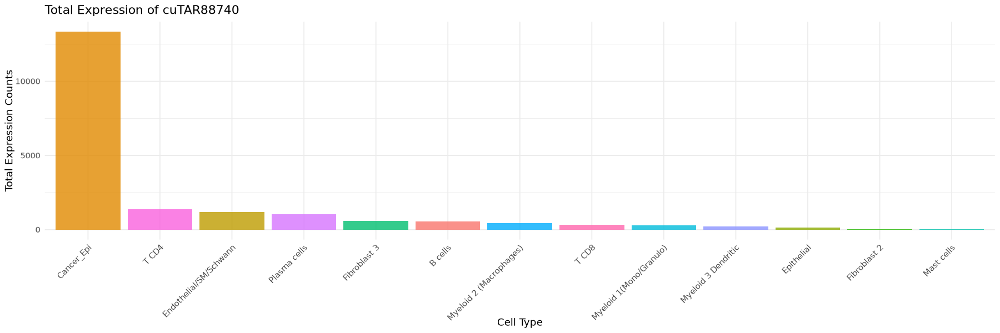

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


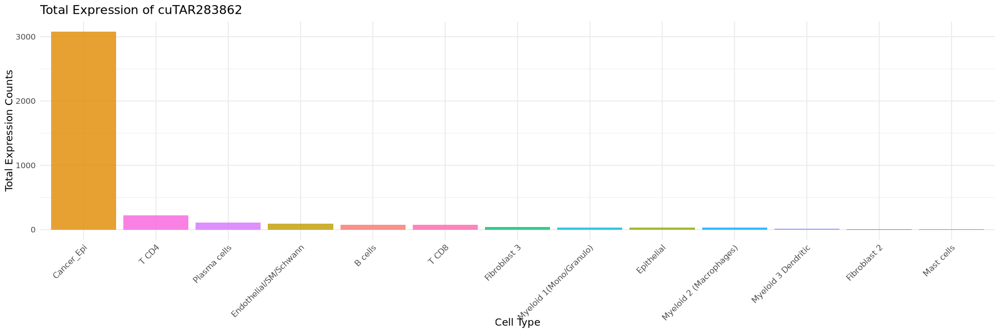

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


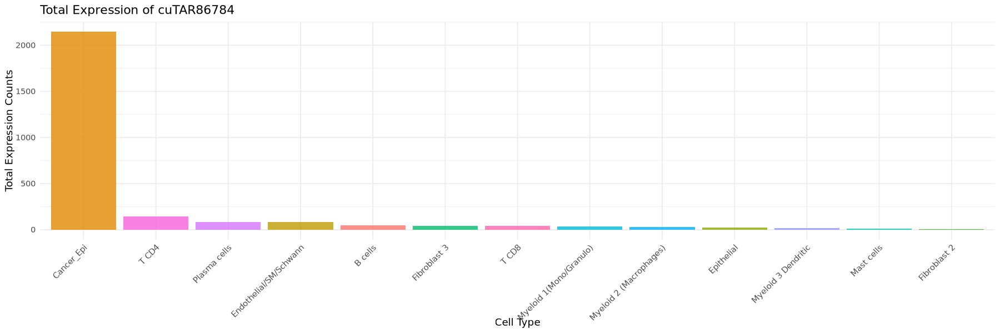

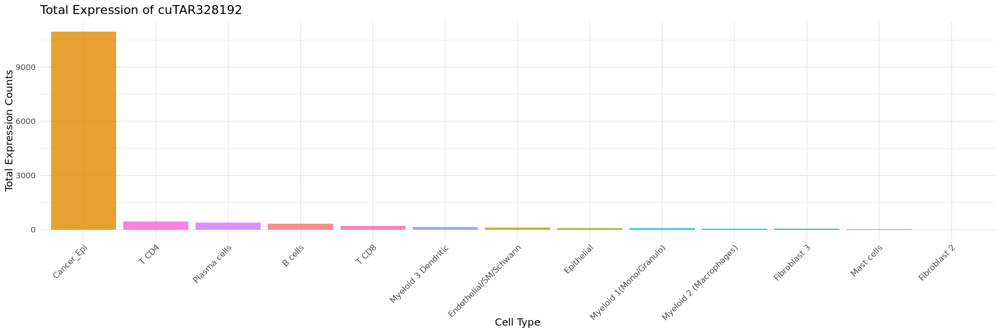

In [67]:
plot_bar_total_expression(CRC, c("cuTAR323949","cuTAR88740", "cuTAR283862","cuTAR86784","cuTAR328192"))


In [46]:
table(m$predicted.id)


                B cells              Cancer_Epi       CD8+ CXCL13+ HSP+ 
                  11931                  276235                       7 
 Endothelial/SM/Schwann              Epithelial            Fibroblast 2 
                  32799                    3515                     455 
           Fibroblast 3              Mast cells Myeloid 1(Mono/Granulo) 
                  12152                     710                    9115 
Myeloid 2 (Macrophages)     Myeloid 3 Dendritic            Plasma cells 
                   9392                    4091                   33185 
                  T CD4                   T CD8 
                  43827                    7252 

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”
Warning message:
“Groups with fewer than two datapoints have been dropped.
ℹ Set `drop = FALSE` to consider such groups for position adjustment purposes.”


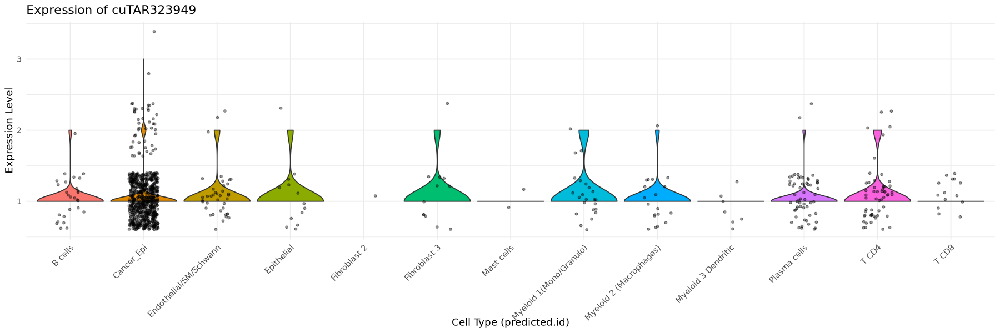

In [66]:
plot_violin_gene_expression(CRC, c("cuTAR323949"))

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


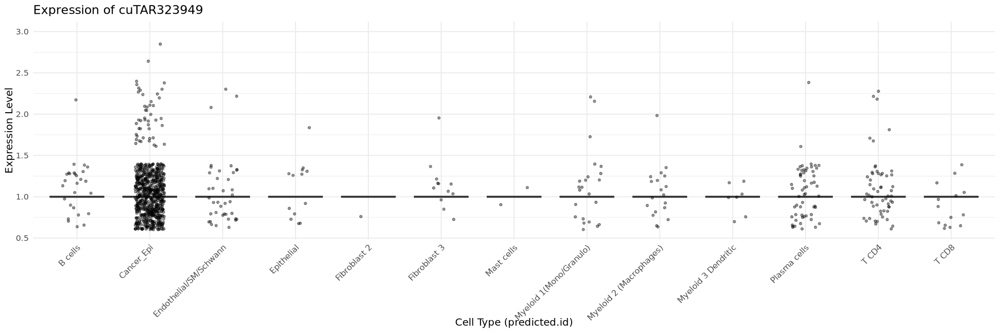

In [54]:
# Example usage:
plot_boxplot_gene_expression(CRC, c("cuTAR323949"))

In [70]:
CRC2<-readRDS("mel/clean-data/xenium_spatial_CRC_LT.rds")
CRC2

An object of class Seurat 
1021 features across 444666 samples within 4 assays 
Active assay: SCT (480 features, 480 variable features)
 3 layers present: counts, data, scale.data
 3 other assays present: Xenium, ControlCodeword, ControlProbe
 2 dimensional reductions calculated: pca, umap
 1 spatial field of view present: fov

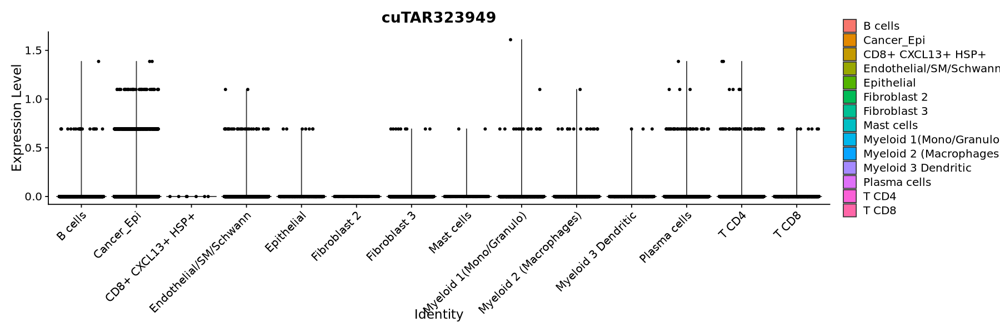

In [73]:
VlnPlot(CRC2, features = "cuTAR323949", group.by = "predicted.id", layer="data") 

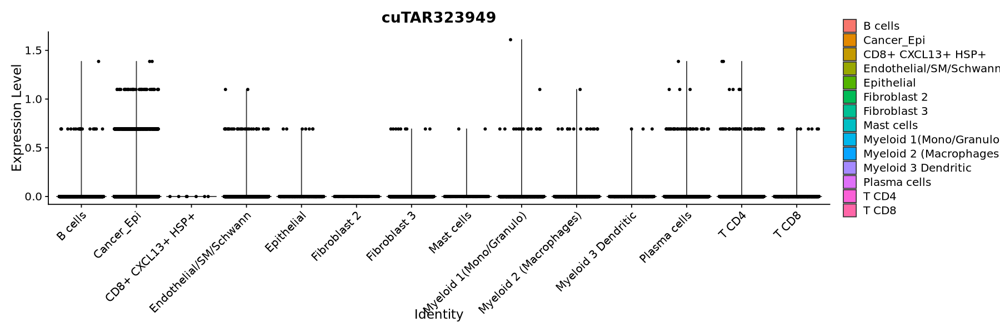

In [74]:
VlnPlot(CRC2, features = "cuTAR323949", group.by = "predicted.id")

# edgeR DE analysis cancer types

In [60]:
library(Seurat)
library(dplyr)

# List of your Seurat objects (replace with actual object names)
xenium_objects <- list(breast, gbm, HN, Melanoma, CRC)
sample_names <- c("breast", "gbm", "HN", "Melanoma", "CRC")

# Initialize lists to store counts and metadata
counts_list <- list()
metadata_list <- list()

for (i in seq_along(xenium_objects)) {
  obj <- xenium_objects[[i]]
  sample_id <- sample_names[i]
  
  # Extract counts
  counts_list[[sample_id]] <- GetAssayData(obj, slot = "counts")

  # Extract metadata and add sample ID
  meta <- obj@meta.data
  meta$barcode <- rownames(meta)  # Ensure barcodes are stored
  meta$sample_id <- sample_id  # Add sample ID
  
  # Add random cluster assignment (cluster IDs 1, 2, or 3)
  meta$cluster <- sample(1:3, nrow(meta), replace = TRUE)
  
  metadata_list[[sample_id]] <- meta
}

# Merge count matrices and metadata
merged_counts <- do.call(cbind, counts_list)
merged_metadata <- do.call(rbind, metadata_list)

# Check the first few rows of the merged metadata to verify
head(merged_metadata)
write.table(merged_counts,"merged_counts.txt",sep="\t",quote=FALSE)
write.table(merged_metadata,"merged_metadata.txt",sep="\t",quote=FALSE)


,orig.ident,nCount_Xenium,nFeature_Xenium,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,barcode,sample_id,cluster
,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<int>
breast.aaaabalk-1,SeuratProject,185,60,0,0,0,0,aaaabalk-1,breast,1
breast.aaaaefcj-1,SeuratProject,138,55,0,0,0,0,aaaaefcj-1,breast,3
breast.aaaaekcn-1,SeuratProject,141,50,0,0,0,0,aaaaekcn-1,breast,3
breast.aaaaemhb-1,SeuratProject,76,34,0,0,0,0,aaaaemhb-1,breast,1
breast.aaaaieck-1,SeuratProject,168,58,0,0,0,0,aaaaieck-1,breast,3
breast.aaaajegg-1,SeuratProject,161,59,0,0,0,0,aaaajegg-1,breast,1


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 6.9 GiB”


5 x 5 sparse Matrix of class "dgCMatrix"
       aaaabalk-1 aaaaefcj-1 aaaaekcn-1 aaaaemhb-1 aaaaieck-1
A2M             .          .          .          .          .
ACE2            .          .          .          .          .
ACTA2           1          .          .          .          1
ACTB            5          1          2          1          1
ADAM28          .          .          .          .          .

In [47]:
breast_counts<-GetAssayData(breast, slot = "counts")
write.table(breast_counts,"breast_counts.txt",sep="\t",quote=FALSE)
gbm_counts<-GetAssayData(gbm, slot = "counts")
write.table(gbm_counts,"GBM_counts.txt",sep="\t",quote=FALSE)

HN_counts<-GetAssayData(HN, slot = "counts")
write.table(HN_counts,"HN_counts.txt",sep="\t",quote=FALSE)

Mel_counts<-GetAssayData(Melanoma, slot = "counts")
write.table(Mel_counts,"Mel_counts.txt",sep="\t",quote=FALSE)

CRC_counts<-GetAssayData(CRC, slot = "counts")
write.table(CRC_counts,"CRC_counts.txt",sep="\t",quote=FALSE)


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”


In [66]:
library(Seurat)
library(dplyr)

# List of your Seurat objects (replace with actual object names)
xenium_objects <- list(breast, gbm, HN, Melanoma, CRC)
sample_names <- c("breast", "gbm", "HN", "Melanoma", "CRC")

# Initialize lists to store counts and metadata
counts_list <- list()
metadata_list <- list()

for (i in seq_along(xenium_objects)) {
  obj <- xenium_objects[[i]]
  sample_id <- sample_names[i]
  
  # Extract counts
  counts_list[[sample_id]] <- GetAssayData(obj, slot = "counts")

  # Extract metadata and add sample ID
  meta <- obj@meta.data
  meta$barcode <- rownames(meta)  # Ensure barcodes are stored
  meta$sample_id <- sample_id  # Add sample ID
  
  # Add random cluster assignment (cluster IDs 1, 2, or 3)
  meta$cluster <- sample(1:3, nrow(meta), replace = TRUE)
  
  # Add sample ID suffix to barcodes
  meta$barcode <- paste(meta$barcode, sample_id, sep = "_")
  
  # Update rownames in metadata
  rownames(meta) <- meta$barcode
  
  metadata_list[[sample_id]] <- meta
}

# Merge count matrices and metadata
merged_counts <- do.call(cbind, counts_list)
merged_metadata <- do.call(rbind, metadata_list)

# Ensure barcodes in merged_counts and merged_metadata match
colnames(merged_counts) <- paste(colnames(merged_counts), rep(sample_names, each = ncol(merged_counts) / length(sample_names)), sep = "_")
merged_metadata$barcode <- paste(merged_metadata$barcode, rep(sample_names, each = nrow(merged_metadata) / length(sample_names)), sep = "_")

# Check dimensions
print(dim(merged_counts))
print(dim(merged_metadata))

# Write the data to files
write.table(merged_counts, "merged_counts.txt", sep = "\t", quote = FALSE)
write.table(merged_metadata, "merged_metadata.txt", sep = "\t", quote = FALSE)


[1]     480 1925081
[1] 1925081      10


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 6.9 GiB”


In [68]:
dim(merged_counts)

5 x 5 sparse Matrix of class "dgCMatrix"
       aaaabalk-1_breast aaaaefcj-1_breast aaaaekcn-1_breast aaaaemhb-1_breast
A2M                    .                 .                 .                 .
ACE2                   .                 .                 .                 .
ACTA2                  1                 .                 .                 .
ACTB                   5                 1                 2                 1
ADAM28                 .                 .                 .                 .
       aaaaieck-1_breast
A2M                    .
ACE2                   .
ACTA2                  1
ACTB                   1
ADAM28                 .

In [70]:
merged_counts_m<-as.matrix(merged_counts)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 6.9 GiB”


In [79]:
sum(duplicated(rownames(merged_counts_m)))
sum(rownames(merged_counts_m) == "")
sum(is.na(rownames(merged_counts_m)))
sum(is.na(colnames(merged_counts_m)))


[1] 0

[1] 0

[1] 0

[1] 0

In [82]:
dim(merged_counts_m)

[1]     480 1925081

# edgeR

In [3]:
c<-read.csv("cuTAR_merged_counts.txt",sep="\t", row.names=1, header=TRUE)

In [84]:
dim(c)

NULL

In [2]:
#so<-CreateSeuratObject(c)
so<-readRDS("cutars_merged.rds")
so

An object of class Seurat 
76 features across 1925081 samples within 1 assay 
Active assay: RNA (76 features, 0 variable features)
 1 layer present: counts

In [3]:
# Load libraries
library(Seurat)
library(Matrix)

# Step 1: Ensure gene names are unique
rownames(so) <- make.unique(rownames(so))

# Step 2: Get gene names and filter for cuTAR
genes <- rownames(so)
cutar_genes <- genes[grepl("^cuTAR", genes)]

# Step 3: Subset expression matrix for those genes
cutar_counts <- GetAssayData(so, slot = "counts")[cutar_genes, , drop = FALSE]

# Step 4: Count number of cells each gene is expressed in (>0 counts)
cell_counts <- Matrix::rowSums(cutar_counts > 0)

# Step 5: Count genes expressed in at least 3, 5, 10, 100 cells
num_cutars_expressed3   <- sum(cell_counts >= 3)
num_cutars_expressed5   <- sum(cell_counts >= 5)
num_cutars_expressed10  <- sum(cell_counts >= 10)
num_cutars_expressed100 <- sum(cell_counts >= 100)

cat("cuTAR genes expressed in ≥3 cells:", num_cutars_expressed3, "\n")
cat("cuTAR genes expressed in ≥5 cells:", num_cutars_expressed5, "\n")
cat("cuTAR genes expressed in ≥10 cells:", num_cutars_expressed10, "\n")
cat("cuTAR genes expressed in ≥100 cells:", num_cutars_expressed100, "\n")



Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


cuTAR genes expressed in ≥3 cells: 76 
cuTAR genes expressed in ≥5 cells: 76 
cuTAR genes expressed in ≥10 cells: 76 
cuTAR genes expressed in ≥100 cells: 76 


In [3]:
m<-read.csv("merged_metadata.txt", sep="\t")
head(m)

,orig.ident,nCount_Xenium,nFeature_Xenium,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,barcode,sample_id,cluster
,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<int>
breast.aaaabalk-1_breast,SeuratProject,185,60,0,0,0,0,aaaabalk-1_breast_breast,breast,2
breast.aaaaefcj-1_breast,SeuratProject,138,55,0,0,0,0,aaaaefcj-1_breast_breast,breast,2
breast.aaaaekcn-1_breast,SeuratProject,141,50,0,0,0,0,aaaaekcn-1_breast_breast,breast,1
breast.aaaaemhb-1_breast,SeuratProject,76,34,0,0,0,0,aaaaemhb-1_breast_breast,breast,2
breast.aaaaieck-1_breast,SeuratProject,168,58,0,0,0,0,aaaaieck-1_breast_breast,breast,2
breast.aaaajegg-1_breast,SeuratProject,161,59,0,0,0,0,aaaajegg-1_breast_breast,breast,3


In [4]:
so <- AddMetaData(so,m)

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 957984 rows containing non-finite outside the scale range
(`stat_ydensity()`).”


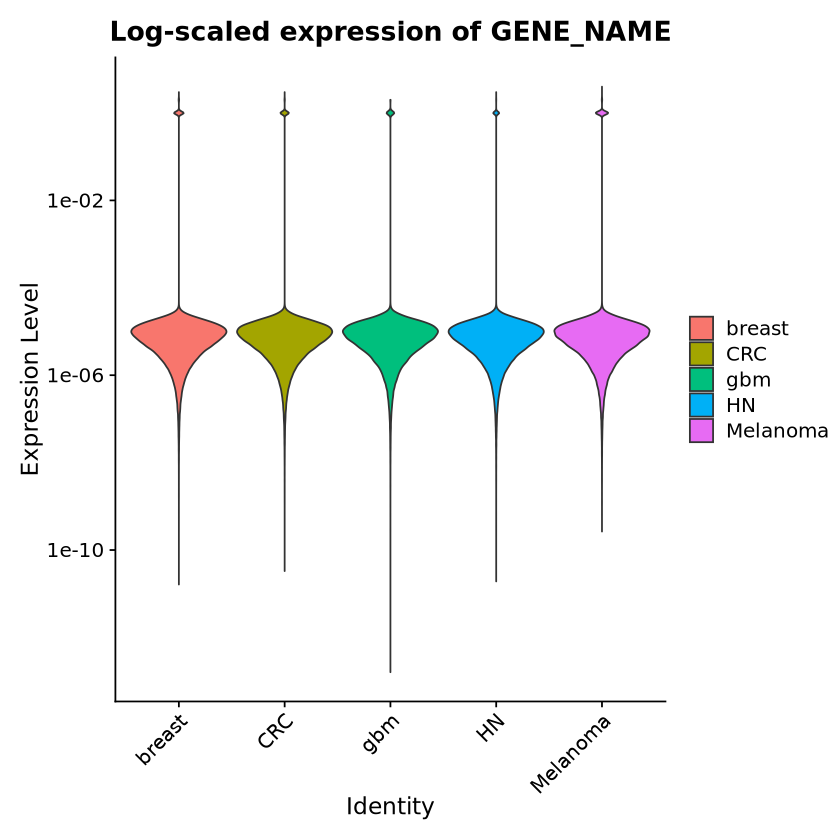

In [6]:
## brriar dist

#VlnPlot(so, features = "cuTAR176226", group.by = "sample_id", pt.size = 0)
VlnPlot(so, features = "cuTAR176226", group.by = "sample_id", pt.size = 0) +
  scale_y_log10() +
  ggtitle("Log-scaled expression of GENE_NAME")


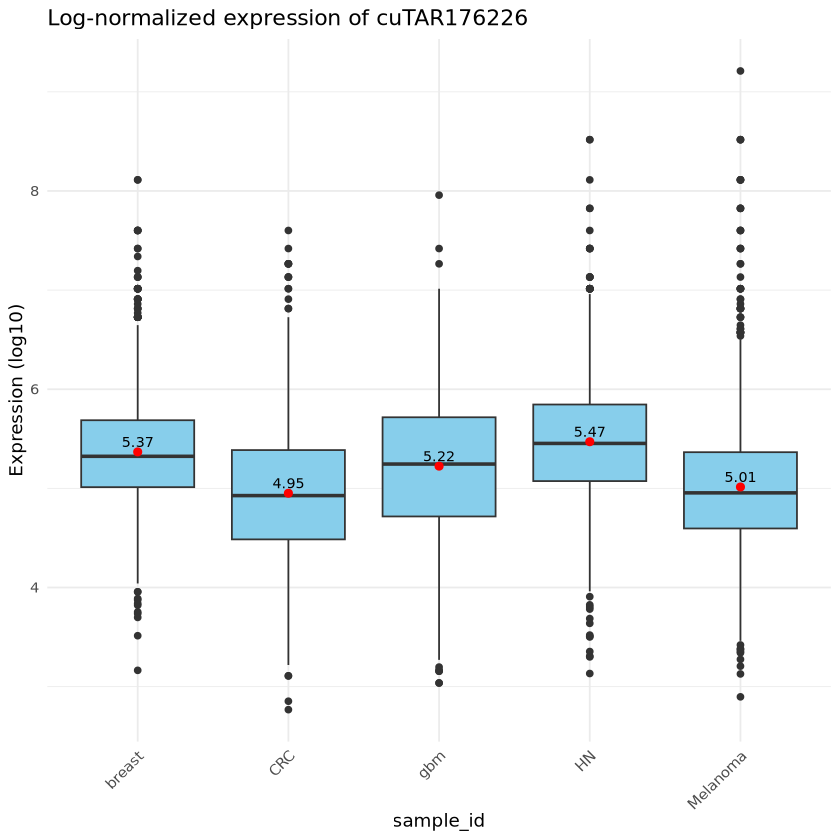

In [22]:
library(ggplot2)

gene <- "cuTAR176226"
group_var <- "sample_id"  # Replace with your actual metadata column
#so <- NormalizeData(so)

# Extract expression for that gene from counts
expr_values <- GetAssayData(so, assay = "RNA", slot = "data")[gene, ]

# Create dataframe with expression and grouping variable
df <- data.frame(
  expression = as.numeric(expr_values),
  group = so@meta.data[[group_var]]
)

# Filter for cells with expression > 0
df <- df[df$expression > 0, ]
mean_df <- aggregate(expression ~ group, data = df, FUN = mean)

# Plot with log10 scale
ggplot(df, aes(x = group, y = expression)) +
  geom_boxplot(fill = "skyblue") +
  stat_summary(fun = mean, geom = "point", shape = 20, size = 3, color = "red") +
  geom_text(
    data = mean_df,
    aes(x = group, y = expression, label = round(expression, 2)),
    vjust = -0.5,
    color = "black",
    size = 3
  ) +
 # scale_y_log10() +
  theme_minimal() +
  labs(
    title = paste("Log-normalized expression of", gene),
    x = group_var,
    y = "Expression (log10)"
  ) +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

In [1]:
#  decideTestsDGE.R

decideTests.DGEExact <- decideTests.DGELRT <- function(object,adjust.method="BH",p.value=0.05,lfc=0,...)
{
	decideTestsDGE(object=object,adjust.method=adjust.method,p.value=p.value,lfc=lfc)
}

decideTestsDGE <- function(object,adjust.method="BH",p.value=0.05,lfc=2)
#	Accept or reject hypothesis tests across genes and contrasts
#	edgeR team. Original author was Davis McCarthy.
#	Created 15 August 2010. Last modified 15 July 2018.
{
#	Check object class
	if( !(is(object,"DGEExact") || is(object,"DGELRT")) ) stop("Need DGEExact or DGELRT object")

#	Apply multiple testing
	p <- object$table$PValue
	p <- p.adjust(p, method=adjust.method)
	isDE <- as.integer(p < p.value)

#	Extract logFC
	logFC <- object$table$logFC

#	Check for F-test with multiple logFC columns
	FTest <- is.null(logFC)

#	With multiple contrasts, apply lfc threshold to maximum logFC
	if(FTest) {
		if(lfc>0) {
			coef.col <- grep("^logFC",colnames(object$table))
			logFC <- object$table[,coef.col]
			SmallFC <- rowSums(abs(logFC) >= lfc) == 0
			isDE[SmallFC] <- 0L
		}

#	With single contrast, apply directionality and lfc threshold
	} else {
		isDE[isDE & logFC<0] <- -1L
		SmallFC <- (abs(logFC) < lfc)
		isDE[SmallFC] <- 0L
	}

#	Assemble TestResults object
	isDE <- matrix(isDE, ncol=1)
	row.names(isDE) <- row.names(object)
	colnames(isDE) <- paste(rev(object$comparison),collapse="-")

#	Record possible values
	if(FTest) {
		attr(isDE,"levels") <- c(0L,1L)
		attr(isDE,"labels") <- c("NotSig","Sig")
	} else {
		attr(isDE,"levels") <- c(-1L,0L,1L)
		attr(isDE,"labels") <- c("Down","NotSig","Up")
	}		

	new("TestResults", isDE)
}

[1] 0.0007658962

,breast_vs_others,CRC_vs_others,gbm_vs_others,HN_vs_others,Melanoma_vs_others
Down,0,2,2,0,0
NotSig,73,73,74,70,76
Up,3,1,0,6,0


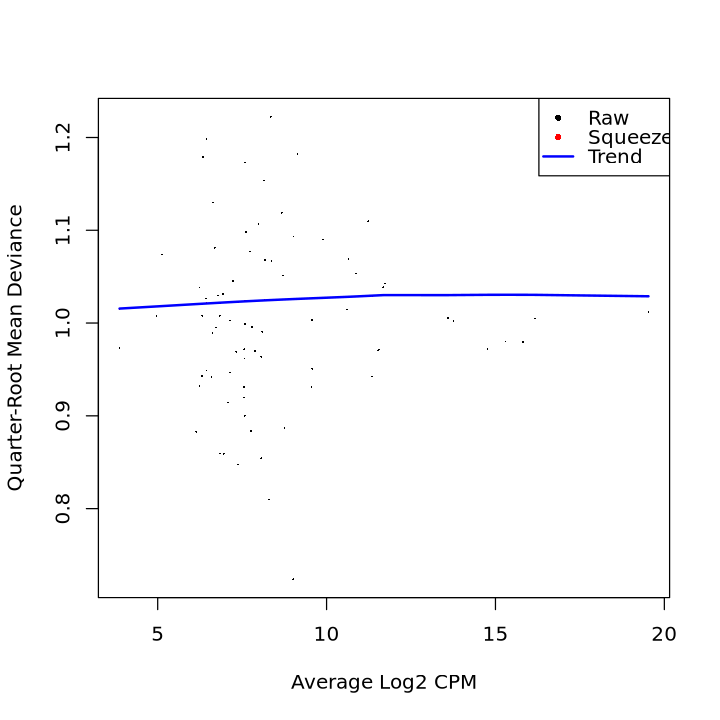

In [25]:
y<-Seurat2PB(so,sample="sample_id", cluster="cluster")
y<-normLibSizes(y)
donor<-factor(y$sample$sample)
design<-model.matrix(~donor)
colnames(design)<-gsub("donor","",colnames(design))
#colnames(design)<-gsub("cluster","",colnames(design))
colnames(design)[1]<-"Int"
y<-estimateDisp(y,design,robust=TRUE)
y$common.dispersion 
fit<-glmQLFit(y,design,robust=TRUE) 
ncls<-nlevels(donor) 
contr<-rbind(matrix(1/(1-ncls),ncls,ncls), +matrix(0,ncol(design)-ncls,ncls)) 
diag(contr)<-1 
contr[1,]<-0 
rownames(contr)<-colnames(design) 
colnames(contr)<-colnames(design)
qlf<-list() 
for(i in 1:ncls){ 
  qlf[[i]]<-glmQLFTest(fit,contrast=contr[,i]) 
  qlf[[i]]$comparison<-paste0(levels(donor)[i],"_vs_others") 
}
options(repr.plot.width = 6, repr.plot.height = 6)
cluster<-as.factor(y$samples$cluster) 
#pdf("MDS_edgeR_SCC_KC_only_corrected_labels.pdf")
#plotMDS(y,pch=16,col=c(2:8)[cluster],main="MDS") 
#legend("topleft",legend=paste0(levels(cluster)), pch=14,col=2:8,cex=0.8)
#dev.off()
#plotMDS(y,pch=16,col=c(2:8)[cluster],main="MDS") 
#pdf("dispersion.pdf")
#plotBCV(y)
#dev.off()

#pdf("QLdisp.pdf")
plotQLDisp(fit)
#dev.off()

dt<-lapply(lapply(qlf,decideTestsDGE),summary) 
dt.all<-do.call("cbind",dt) 
head(dt.all)
#write.table(dt.all,"KC_only_cluster_wise_stats_labels_corrected.txt",sep="\t",quote=FALSE,row.names=TRUE)


[1] 76

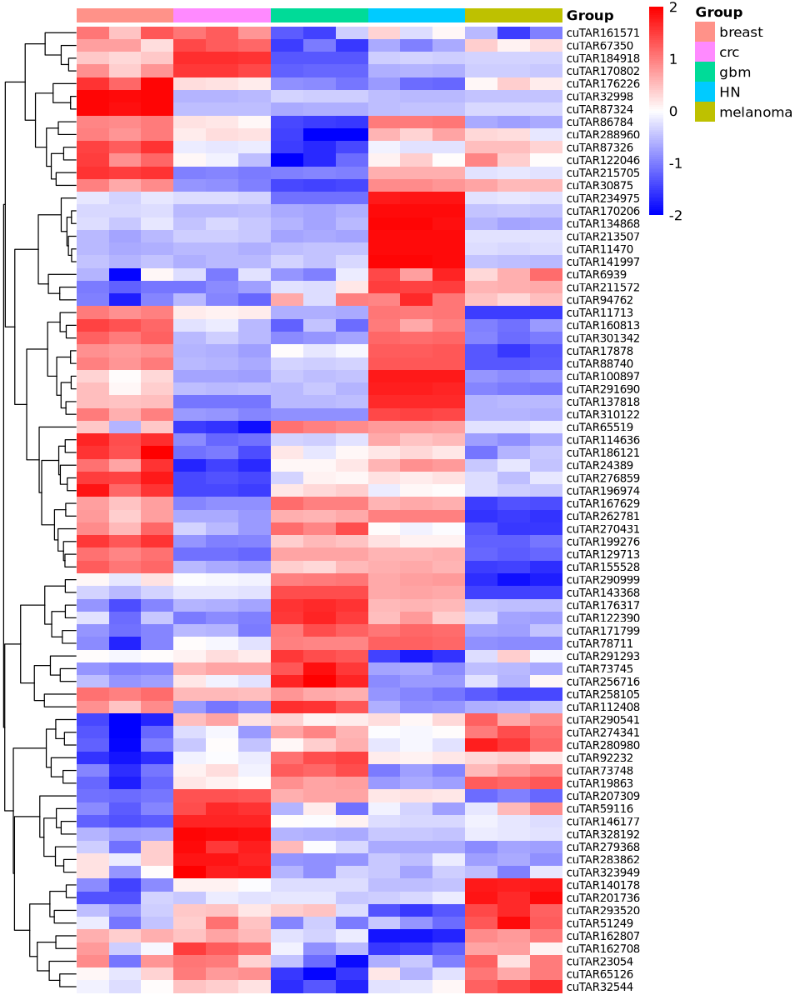

In [9]:
top <- 50  # Number of top genes to select from each direction (up and down)
topMarkers <- list()

for (i in 1:ncls) {
  # Get the table for the current cluster
  current_table <- qlf[[i]]$table #[c(kc_up_sig,mel_up_sig),] ### with or without subsetting sig, same results
  
  # Order genes by PValue, then by logFC (positive and negative separately)
  ordered_genes <- current_table[order(current_table$PValue, decreasing = FALSE), ]
  
  # Filter for upregulated genes (logFC > 0)
  upregulated <- ordered_genes[ordered_genes$logFC > 0, ]
  upregulated <- upregulated[order(-upregulated$logFC), ]  # Sort by descending logFC
  
  # Filter for downregulated genes (logFC < 0)
  downregulated <- ordered_genes[ordered_genes$logFC < 0, ]
  downregulated <- downregulated[order(downregulated$logFC), ]  # Sort by ascending logFC
  
  # Remove unwanted genes (e.g., RPS, RPL, LINC)
  upregulated <- upregulated[!grepl("^RPS|^RPL|^LINC", rownames(upregulated)), ]
  downregulated <- downregulated[!grepl("^RPS|^RPL|^LINC", rownames(downregulated)), ]
  
  # Select top N genes from both up and down
  top_up <- head(rownames(upregulated), top)
  top_down <- head(rownames(downregulated), top)
  
  # Combine selected genes for this cluster
  topMarkers[[i]] <- c(top_up, top_down)
}

# Combine all selected genes into a single list
combined_topMarkers <- unlist(topMarkers, use.names = FALSE)

# Remove duplicates if necessary
combined_topMarkers <- unique(combined_topMarkers)

# Print the total number of genes in the final list
length(combined_topMarkers)

# Final result: `combined_topMarkers` contains top genes (upregulated and downregulated) for all clusters
topMarkers <-combined_topMarkers


lcpm<-cpm(y,log=TRUE) 
annot<-data.frame(cluster=cluster) 
rownames(annot)<-colnames(y) 
ann_colors<-list(cluster=0:14) 
names(ann_colors$cluster)<-levels(cluster)


options(repr.plot.width = 8, repr.plot.height = 10)

library(pheatmap)
#o<-read.csv("KC_only_desired_order.txt",sep="\t",header=FALSE)
#desired_order<-o$V1
colnames(lcpm)<-gsub("cluster","",colnames(lcpm))
#desired_order<-c("0","1","11","2","4","6","3","5","7","8","9","10","12","13","14","15")
#lcpm_o <- lcpm[,match(desired_order, colnames(lcpm)), drop = FALSE]


#rownames(annot)<-gsub("cluster","",rownames(annot))
#annot_o <- annot[match(desired_order, rownames(annot)), , drop = FALSE]

library(pheatmap)

# Assuming km1_up_sig and km2_up_sig are your lists of significant genes for KM1 and KM2
heatmap_data2 <- lcpm[topMarkers, ]

# Create a column annotation (for KM1 and KM2)
annotation_col <- data.frame(
  Group = rep(c("breast", "crc","gbm","HN","melanoma"), each = 3)  # Adjust according to your number of columns per group
)

# Set rownames of the annotation to match column names in the heatmap
rownames(annotation_col) <- colnames(heatmap_data2)

# Plot the heatmap with annotation bars
km1_km2_sig2 <- pheatmap::pheatmap(
  heatmap_data2,
  breaks = seq(-2, 2, length.out = 101),
  color = colorRampPalette(c("blue", "white", "red"))(100),
  scale = "row",
  cluster_cols = FALSE,
  border_color = "NA",
  fontsize_row = 8,
  show_colnames = FALSE,
  annotation_col = annotation_col,  # Adding the annotation column here
#  annotation_colors = list(Group = c("KM1" = "blue", "KM2" = "red"))  # Customize colors for annotation
)

# You can access the ordered genes with the following line
genes_on_heatmap_km1_km2_sig2 <- rownames(heatmap_data2)[km1_km2_sig2$tree_row$order]


[1] 76

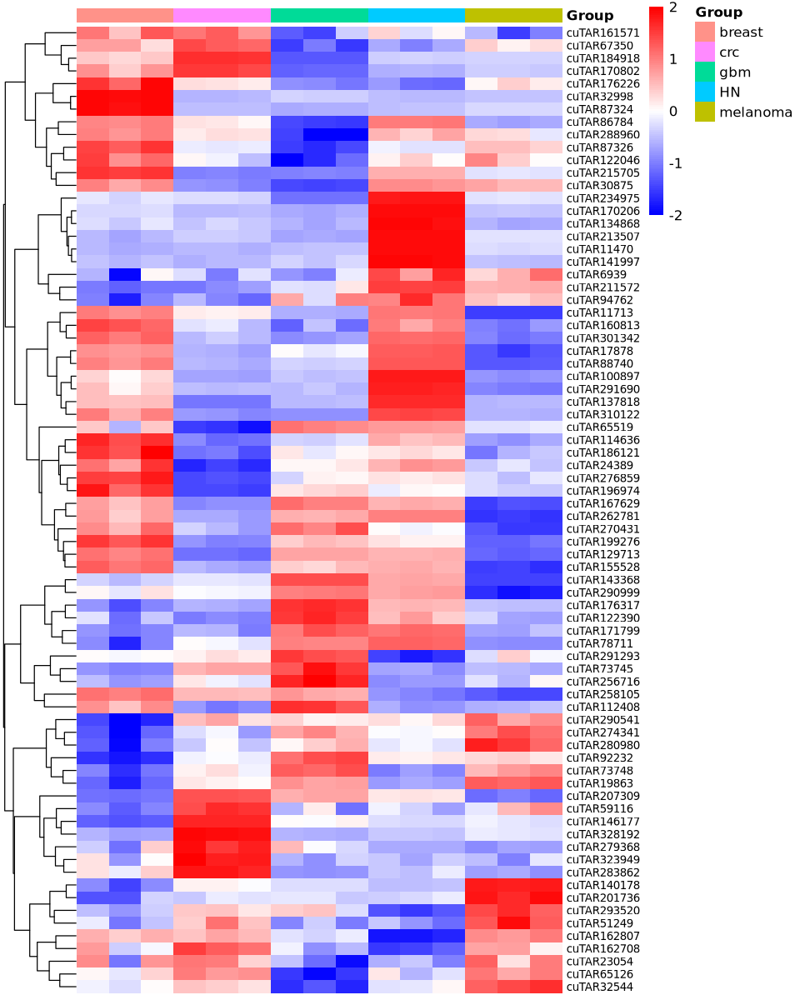

In [53]:
top <- 50  # Number of top genes to select from each direction (up and down)
topMarkers <- list()

for (i in 1:ncls) {
  # Get the table for the current cluster
  current_table <- qlf[[i]]$table #[c(kc_up_sig,mel_up_sig),] ### with or without subsetting sig, same results
  
  # Order genes by PValue, then by logFC (positive and negative separately)
  ordered_genes <- current_table[order(current_table$PValue, decreasing = FALSE), ]
  ordered_genes<-ordered_genes[ordered_genes$PValue < 0.05,]
  # Filter for upregulated genes (logFC > 0)
  upregulated <- ordered_genes[ordered_genes$logFC > 0, ]
  upregulated <- upregulated[order(-upregulated$logFC), ]  # Sort by descending logFC
  
  # Filter for downregulated genes (logFC < 0)
  downregulated <- ordered_genes[ordered_genes$logFC < 0, ]
  downregulated <- downregulated[order(downregulated$logFC), ]  # Sort by ascending logFC
  
  # Remove unwanted genes (e.g., RPS, RPL, LINC)
  upregulated <- upregulated[!grepl("^RPS|^RPL|^LINC", rownames(upregulated)), ]
  downregulated <- downregulated[!grepl("^RPS|^RPL|^LINC", rownames(downregulated)), ]
  
  # Select top N genes from both up and down
  top_up <- head(rownames(upregulated), top)
  top_down <- head(rownames(downregulated), top)
  
  # Combine selected genes for this cluster
  topMarkers[[i]] <- c(top_up, top_down)
}

# Combine all selected genes into a single list
combined_topMarkers <- unlist(topMarkers, use.names = FALSE)

# Remove duplicates if necessary
combined_topMarkers <- unique(combined_topMarkers)

# Print the total number of genes in the final list
length(combined_topMarkers)
"
# Final result: `combined_topMarkers` contains top genes (upregulated and downregulated) for all clusters
topMarkers <-combined_topMarkers


lcpm<-cpm(y,log=TRUE) 
annot<-data.frame(cluster=cluster) 
rownames(annot)<-colnames(y) 
ann_colors<-list(cluster=0:14) 
names(ann_colors$cluster)<-levels(cluster)


options(repr.plot.width = 8, repr.plot.height = 10)

library(pheatmap)
#o<-read.csv("KC_only_desired_order.txt",sep="\t",header=FALSE)
#desired_order<-o$V1
colnames(lcpm)<-gsub("cluster","",colnames(lcpm))
#desired_order<-c("0","1","11","2","4","6","3","5","7","8","9","10","12","13","14","15")
#lcpm_o <- lcpm[,match(desired_order, colnames(lcpm)), drop = FALSE]


#rownames(annot)<-gsub("cluster","",rownames(annot))
#annot_o <- annot[match(desired_order, rownames(annot)), , drop = FALSE]

library(pheatmap)

# Assuming km1_up_sig and km2_up_sig are your lists of significant genes for KM1 and KM2
heatmap_data2 <- lcpm[topMarkers, ]

# Create a column annotation (for KM1 and KM2)
annotation_col <- data.frame(
  Group = rep(c("breast", "crc","gbm","HN","melanoma"), each = 3)  # Adjust according to your number of columns per group
)

# Set rownames of the annotation to match column names in the heatmap
rownames(annotation_col) <- colnames(heatmap_data2)

# Plot the heatmap with annotation bars
km1_km2_sig2 <- pheatmap::pheatmap(
  heatmap_data2,
  breaks = seq(-2, 2, length.out = 101),
  color = colorRampPalette(c("blue", "white", "red"))(100),
  scale = "row",
  cluster_cols = FALSE,
  border_color = "NA",
  fontsize_row = 8,
  show_colnames = FALSE,
  annotation_col = annotation_col,  # Adding the annotation column here
#  annotation_colors = list(Group = c("KM1" = "blue", "KM2" = "red"))  # Customize colors for annotation
)

# You can access the ordered genes with the following line
genes_on_heatmap_km1_km2_sig2 <- rownames(heatmap_data2)[km1_km2_sig2$tree_row$order]


[1] 50

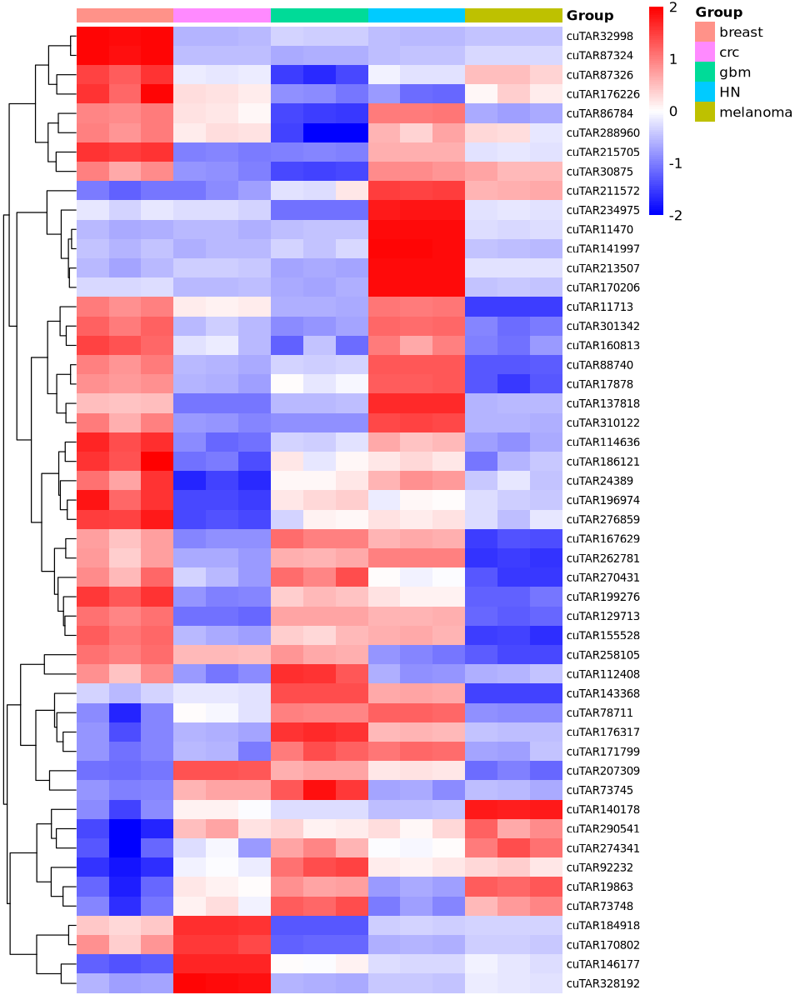

In [47]:
top <- 50  # Number of top genes to select from each direction (up and down)
topMarkers <- list()


for (i in 1:ncls) {
  qlf[[i]]$table$FDR <- p.adjust(qlf[[1]]$table$PValue, method = "BH")

  # Get the table for the current cluster
  current_table <- qlf[[i]]$table #[c(kc_up_sig,mel_up_sig),] ### with or without subsetting sig, same results
  
  # Order genes by PValue, then by logFC (positive and negative separately)
  ordered_genes <- current_table[order(current_table$FDR, decreasing = FALSE), ]
  ordered_genes$logFC<-ordered_genes$FDR < 0.05
  # Filter for upregulated genes (logFC > 0)
  upregulated <- ordered_genes[ordered_genes$logFC > 0, ]
  upregulated <- upregulated[order(-upregulated$logFC), ]  # Sort by descending logFC
  
  # Filter for downregulated genes (logFC < 0)
  downregulated <- ordered_genes[ordered_genes$logFC < 0, ]
  downregulated <- downregulated[order(downregulated$logFC), ]  # Sort by ascending logFC
  
  # Remove unwanted genes (e.g., RPS, RPL, LINC)
  upregulated <- upregulated[!grepl("^RPS|^RPL|^LINC", rownames(upregulated)), ]
  downregulated <- downregulated[!grepl("^RPS|^RPL|^LINC", rownames(downregulated)), ]
  
  # Select top N genes from both up and down
  top_up <- head(rownames(upregulated), top)
  top_down <- head(rownames(downregulated), top)
  
  # Combine selected genes for this cluster
  topMarkers[[i]] <- c(top_up)
}

# Combine all selected genes into a single list
combined_topMarkers <- unlist(topMarkers, use.names = FALSE)

# Remove duplicates if necessary
combined_topMarkers <- unique(combined_topMarkers)

# Print the total number of genes in the final list
length(combined_topMarkers)

# Final result: `combined_topMarkers` contains top genes (upregulated and downregulated) for all clusters
topMarkers <-combined_topMarkers


lcpm<-cpm(y,log=TRUE) 
annot<-data.frame(cluster=cluster) 
rownames(annot)<-colnames(y) 
ann_colors<-list(cluster=0:14) 
names(ann_colors$cluster)<-levels(cluster)


options(repr.plot.width = 8, repr.plot.height = 10)

library(pheatmap)
#o<-read.csv("KC_only_desired_order.txt",sep="\t",header=FALSE)
#desired_order<-o$V1
colnames(lcpm)<-gsub("cluster","",colnames(lcpm))
#desired_order<-c("0","1","11","2","4","6","3","5","7","8","9","10","12","13","14","15")
#lcpm_o <- lcpm[,match(desired_order, colnames(lcpm)), drop = FALSE]


#rownames(annot)<-gsub("cluster","",rownames(annot))
#annot_o <- annot[match(desired_order, rownames(annot)), , drop = FALSE]

library(pheatmap)

# Assuming km1_up_sig and km2_up_sig are your lists of significant genes for KM1 and KM2
heatmap_data2 <- lcpm[topMarkers, ]

# Create a column annotation (for KM1 and KM2)
annotation_col <- data.frame(
  Group = rep(c("breast", "crc","gbm","HN","melanoma"), each = 3)  # Adjust according to your number of columns per group
)

# Set rownames of the annotation to match column names in the heatmap
rownames(annotation_col) <- colnames(heatmap_data2)

# Plot the heatmap with annotation bars
sig2 <- pheatmap::pheatmap(
  heatmap_data2,
  breaks = seq(-2, 2, length.out = 101),
  color = colorRampPalette(c("blue", "white", "red"))(100),
  scale = "row",
  cluster_cols = FALSE,
  border_color = "NA",
  fontsize_row = 8,
  show_colnames = FALSE,
  annotation_col = annotation_col,  # Adding the annotation column here
#  annotation_colors = list(Group = c("KM1" = "blue", "KM2" = "red"))  # Customize colors for annotation
)

# You can access the ordered genes with the following line
genes_on_heatmap_sig2 <- rownames(heatmap_data2)[sig2$tree_row$order]


pdf("HM_FDR.pdf",height=10, width=8)
sig2
dev.off()

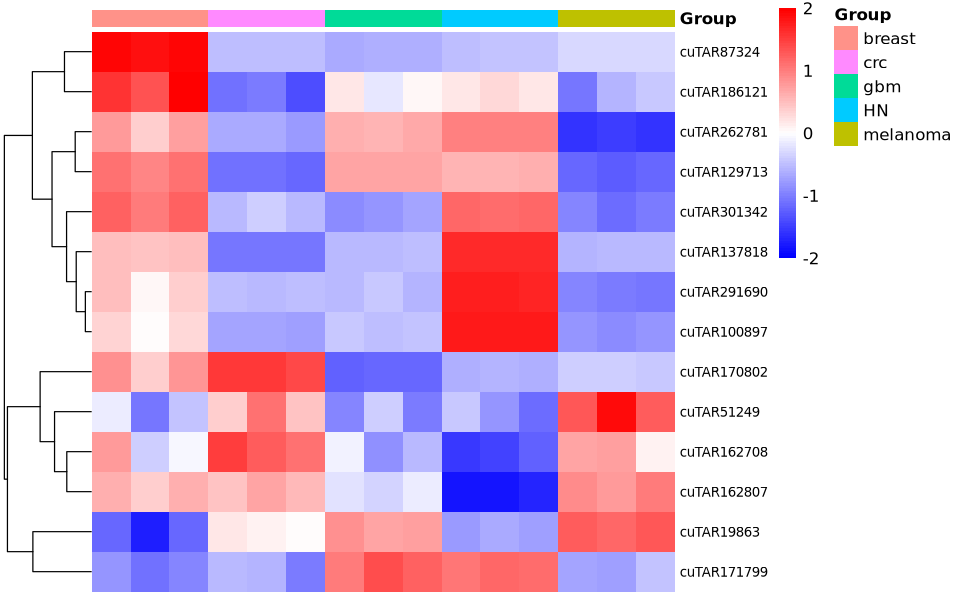

In [49]:
options(repr.plot.width = 8, repr.plot.height = 5)

pan<-c("cuTAR19863","cuTAR291690","cuTAR262781","cuTAR137818","cuTAR87324","cuTAR170802","cuTAR51249","cuTAR129713","cuTAR100897",
"cuTAR171799","cuTAR301342","cuTAR162708","cuTAR162807","cuTAR186121")
pheatmap::pheatmap(
  lcpm[pan,],
  breaks = seq(-2, 2, length.out = 101),
  color = colorRampPalette(c("blue", "white", "red"))(100),
  scale = "row",
  cluster_cols = FALSE,
  border_color = "NA",
  fontsize_row = 8,
  show_colnames = FALSE,
  annotation_col = annotation_col,  # Adding the annotation column here
#  annotation_colors = list(Group = c("KM1" = "blue", "KM2" = "red"))  # Customize colors for annotation
)

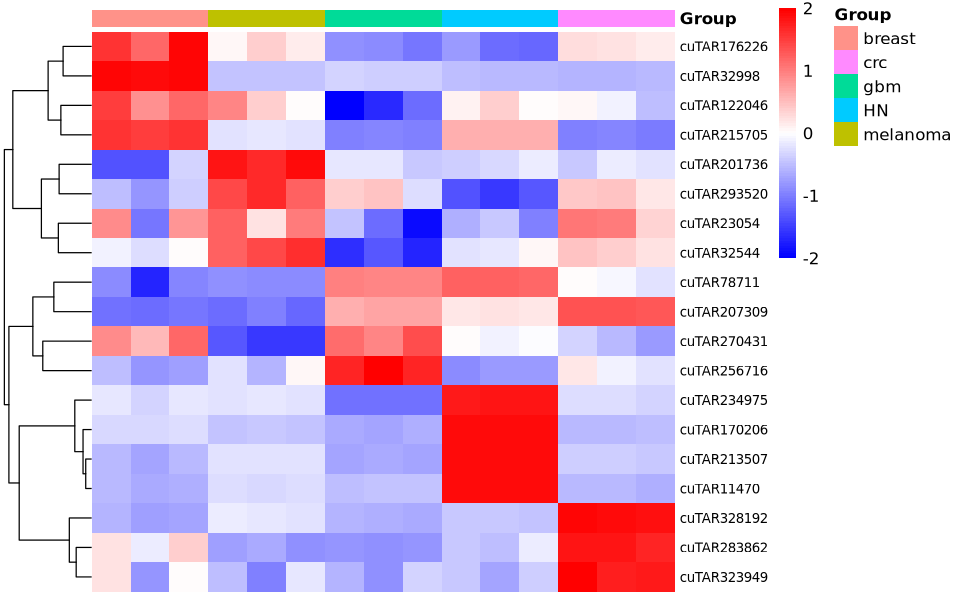

In [14]:
options(repr.plot.width = 8, repr.plot.height = 5)

cancer_specific<-c("cuTAR176226","cuTAR32998","cuTAR122046","cuTAR215705",
       "cuTAR201736","cuTAR293520","cuTAR23054","cuTAR32544",
       "cuTAR270431","cuTAR78711","cuTAR256716","cuTAR207309",
       "cuTAR234975","cuTAR170206","cuTAR213507","cuTAR11470",
       "cuTAR328192","cuTAR283862","cuTAR323949"
       )


desired_order<-c('breast_1','breast_2','breast_3','Melanoma_1','Melanoma_2','Melanoma_3','gbm_1','gbm_2','gbm_3','HN_1','HN_2','HN_3',
                 'CRC_1','CRC_2','CRC_3')

lcpm_o <- lcpm[,match(desired_order, colnames(lcpm)), drop = FALSE]


rownames(annot)<-gsub("cluster","",rownames(annot))
annot_o <- annot[match(desired_order, rownames(annot)), , drop = FALSE]


pheatmap::pheatmap(
  lcpm_o[cancer_specific,],
  breaks = seq(-2, 2, length.out = 101),
  color = colorRampPalette(c("blue", "white", "red"))(100),
  scale = "row",
  cluster_cols = FALSE,
  border_color = "NA",
  fontsize_row = 8,
  show_colnames = FALSE,
  annotation_col = annotation_col,  # Adding the annotation column here
#  annotation_colors = list(Group = c("KM1" = "blue", "KM2" = "red"))  # Customize colors for annotation
)

pdf 
  2

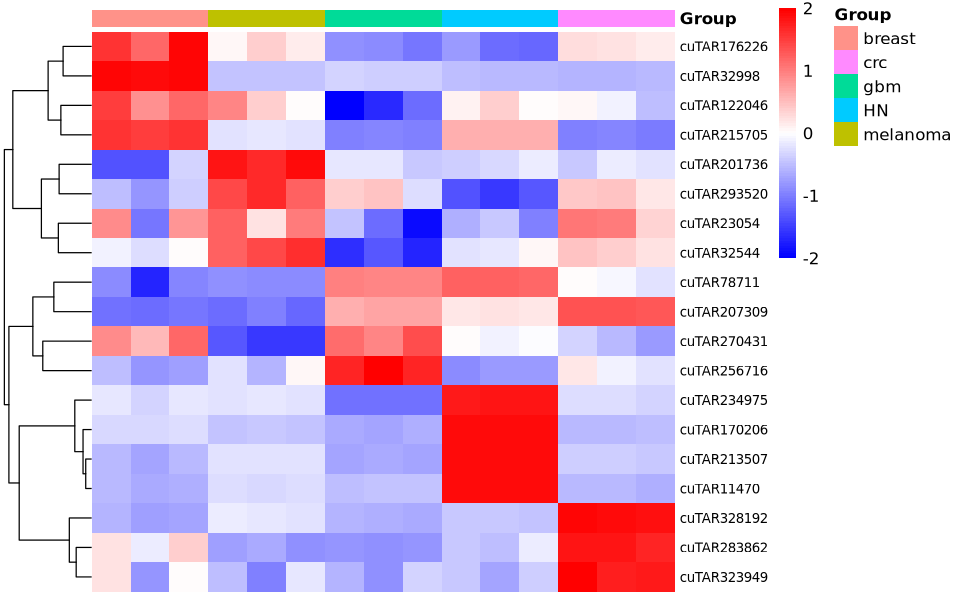

In [20]:
p<-pheatmap::pheatmap(
  lcpm_o[cancer_specific,],
  breaks = seq(-2, 2, length.out = 101),
  color = colorRampPalette(c("blue", "white", "red"))(100),
  scale = "row",
  cluster_cols = FALSE,
  border_color = "NA",
  fontsize_row = 8,
  show_colnames = FALSE,
  annotation_col = annotation_col,  # Adding the annotation column here
#  annotation_colors = list(Group = c("KM1" = "blue", "KM2" = "red"))  # Customize colors for annotation
)
pdf("plots/cancer_specific_cuTARs_xenium_HM.pdf", width=8, height=5)
p
dev.off()

In [15]:
colnames(lcpm)

[1] "breast_1"   "breast_2"   "breast_3"   "CRC_1"      "CRC_2"     
 [6] "CRC_3"      "gbm_1"      "gbm_2"      "gbm_3"      "HN_1"      
[11] "HN_2"       "HN_3"       "Melanoma_1" "Melanoma_2" "Melanoma_3"

In [8]:
colnames(lcpm)

[1] "breast_1"   "breast_2"   "breast_3"   "CRC_1"      "CRC_2"     
 [6] "CRC_3"      "gbm_1"      "gbm_2"      "gbm_3"      "HN_1"      
[11] "HN_2"       "HN_3"       "Melanoma_1" "Melanoma_2" "Melanoma_3"

In [9]:
rownames(heatmap_data2)

[1] "cuTAR32998"  "cuTAR87324"  "cuTAR215705" "cuTAR86784"  "cuTAR160813"
 [6] "cuTAR137818" "cuTAR114636" "cuTAR87326"  "cuTAR129713" "cuTAR11713" 
[11] "cuTAR199276" "cuTAR301342" "cuTAR17878"  "cuTAR88740"  "cuTAR30875" 
[16] "cuTAR155528" "cuTAR258105" "cuTAR276859" "cuTAR186121" "cuTAR196974"
[21] "cuTAR176226" "cuTAR122046" "cuTAR288960" "cuTAR270431" "cuTAR184918"
[26] "cuTAR167629" "cuTAR310122" "cuTAR112408" "cuTAR24389"  "cuTAR162807"
[31] "cuTAR170802" "cuTAR262781" "cuTAR67350"  "cuTAR100897" "cuTAR161571"
[36] "cuTAR291690" "cuTAR283862" "cuTAR162708" "cuTAR23054"  "cuTAR290999"
[41] "cuTAR65519"  "cuTAR65126"  "cuTAR207309" "cuTAR11470"  "cuTAR146177"
[46] "cuTAR141997" "cuTAR328192" "cuTAR211572" "cuTAR92232"  "cuTAR290541"
[51] "cuTAR213507" "cuTAR170206" "cuTAR171799" "cuTAR73748"  "cuTAR73745" 
[56] "cuTAR19863"  "cuTAR274341" "cuTAR176317" "cuTAR234975" "cuTAR140178"
[61] "cuTAR201736" "cuTAR280980" "cuTAR94762"  "cuTAR122390" "cuTAR256716"
[66] "cuTAR143368" "cuTAR78711"  "cuTAR134868" "cuTAR59116"  "cuTAR293520"
[71] "cuTAR6939"   "cuTAR51249"  "cuTAR279368" "cuTAR323949" "cuTAR32544" 
[76] "cuTAR291293"

In [38]:
qlf[[1]]$table$FDR <- p.adjust(qlf[[1]]$table$PValue, method = "BH")

# Add a column for significance
logFC_threshold <- 0.1  # Fold change threshold (adjust as needed)
fdr_threshold <- 0.05 # FDR threshold for significance

qlf[[1]]$table$Significance <- with(qlf[[1]]$table, ifelse(FDR < fdr_threshold & logFC > logFC_threshold, "Upregulated",
                                          ifelse(FDR < fdr_threshold & logFC < -logFC_threshold, "Downregulated", "Not Significant")))

km1_up_sig<-rownames(qlf[[1]]$table[qlf[[1]]$table$logFC > logFC_threshold & qlf[[1]]$table$FDR < fdr_threshold, ])
km2_up_sig<-rownames(qlf[[1]]$table[qlf[[1]]$table$logFC < -logFC_threshold & qlf[[1]]$table$FDR < fdr_threshold, ])
length(km1_up_sig)
length(km2_up_sig)
km1_up_sig

[1] 36

[1] 30

[1] "cuTAR100897" "cuTAR112408" "cuTAR114636" "cuTAR11713"  "cuTAR122046"
 [6] "cuTAR129713" "cuTAR137818" "cuTAR155528" "cuTAR160813" "cuTAR161571"
[11] "cuTAR162807" "cuTAR167629" "cuTAR170802" "cuTAR176226" "cuTAR17878" 
[16] "cuTAR184918" "cuTAR186121" "cuTAR196974" "cuTAR199276" "cuTAR215705"
[21] "cuTAR24389"  "cuTAR258105" "cuTAR262781" "cuTAR270431" "cuTAR276859"
[26] "cuTAR288960" "cuTAR291690" "cuTAR301342" "cuTAR30875"  "cuTAR310122"
[31] "cuTAR32998"  "cuTAR67350"  "cuTAR86784"  "cuTAR87324"  "cuTAR87326" 
[36] "cuTAR88740"

In [54]:
#grep("cuTAR283862",rownames(qlf[[1]]$table))
qlf[[2]]$table[48,] # 24 for cuTAR176226; cuTAR283862: 48

,logFC,logCPM,F,PValue,FDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cuTAR283862,0.7538012,7.073753,366.7275,5.271514e-67,0.1412995


In [10]:
pdf("HM.pdf",height=10, width=8)
km1_km2_sig2
dev.off)

pdf 
  2

Warning message:
“No layers found matching search pattern provided”
Warning message in FetchData.Assay5(object = object[[DefaultAssay(object = object)]], :
“data layer is not found and counts layer is used”


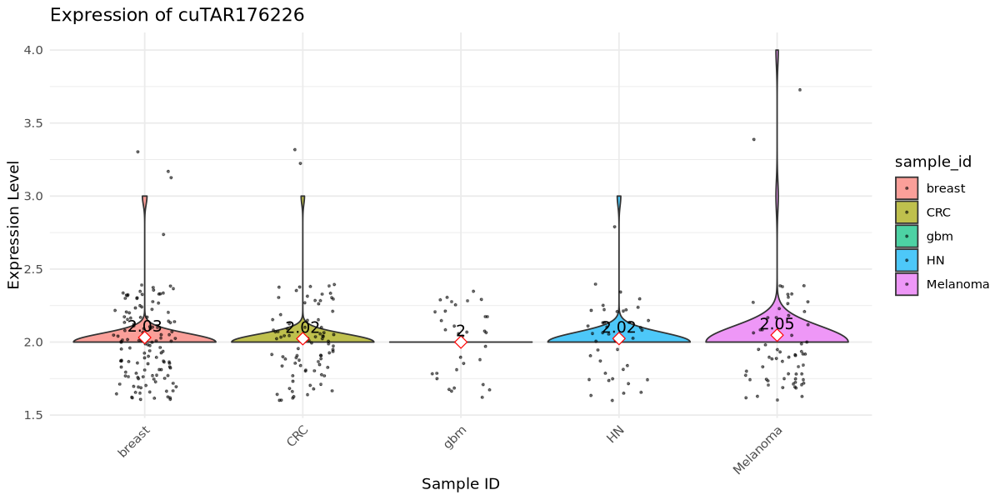

In [18]:
# Define the gene of interest
gene_of_interest <- "cuTAR176226"

# Extract expression and metadata
data_to_plot <- FetchData(so, vars = c(gene_of_interest, "sample_id"))

# Rename columns for clarity
colnames(data_to_plot) <- c("expression", "sample_id")

# Exclude cells with zero expression
data_to_plot <- data_to_plot %>% filter(expression > 1)

# Calculate mean expression per sample
mean_expression <- data_to_plot %>%
  group_by(sample_id) %>%
  summarise(mean_expr = mean(expression))

# Make violin plot
ggplot(data_to_plot, aes(x = sample_id, y = expression, fill = sample_id)) +
  geom_violin(scale = "width", trim = TRUE, alpha = 0.7) +  # Violin plot
  geom_jitter(width = 0.2, alpha = 0.5, size = 0.5) +  # Add cell-level points
  stat_summary(fun = mean, geom = "point", shape = 23, size = 3, color = "red", fill = "white") +  # Show mean value
  geom_text(data = mean_expression, aes(x = sample_id, y = mean_expr, label = round(mean_expr, 2)), 
            vjust = -0.5, color = "red", size = 4) +  # Display mean value
  theme_minimal() +
  labs(title = paste("Expression of", gene_of_interest),
       x = "Sample ID",
       y = "Expression Level") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x labels for clarity


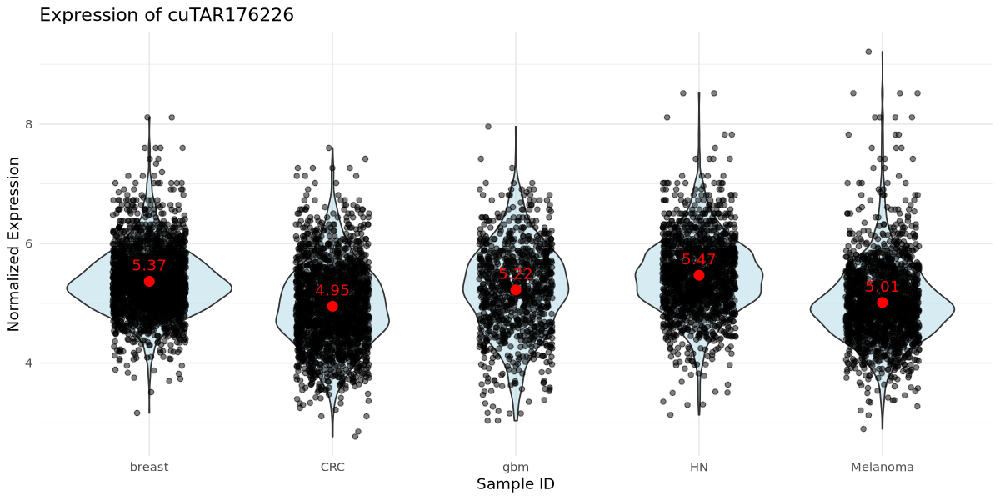

In [27]:
# Define gene of interest
gene_of_interest <- "cuTAR176226"

# Extract normalized expression data and metadata
data_to_plot <- FetchData(so, vars = c(gene_of_interest, "sample_id"), slot = "data")

# Filter out cells with zero expression
data_to_plot <- data_to_plot %>% filter(!!sym(gene_of_interest) > 1)

# Compute mean expression per sample
mean_values <- data_to_plot %>%
  group_by(sample_id) %>%
  summarize(mean_expr = mean(!!sym(gene_of_interest)))

# Create violin plot with mean values displayed
ggplot(data_to_plot, aes(x = sample_id, y = !!sym(gene_of_interest))) +
  geom_violin(fill = "lightblue", alpha = 0.5) +
  geom_jitter(width = 0.2, alpha = 0.5, color = "black") +
  geom_point(data = mean_values, aes(x = sample_id, y = mean_expr), color = "red", size = 3) +
  geom_text(data = mean_values, aes(x = sample_id, y = mean_expr, label = round(mean_expr, 2)),vjust = -1,color = "red") +
  labs(x = "Sample ID", y = "Normalized Expression", title = paste("Expression of", gene_of_interest)) + theme_minimal()


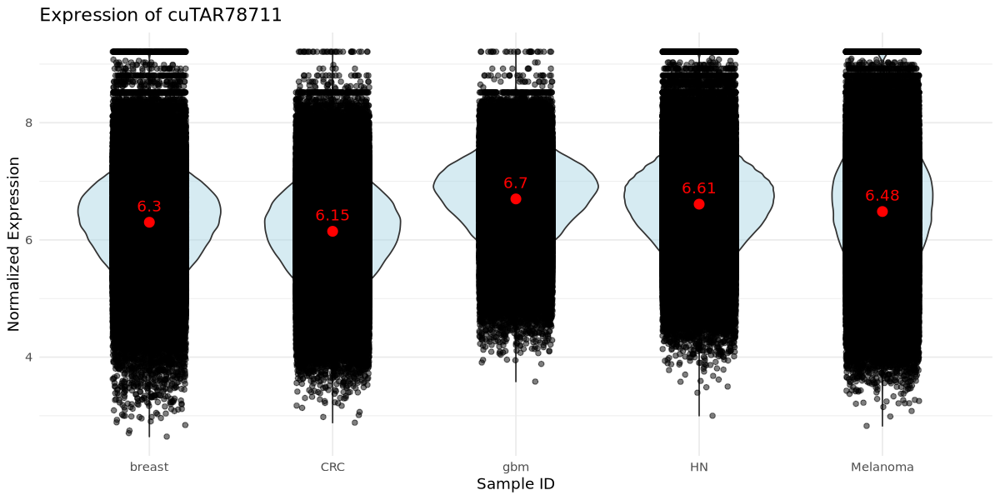

In [29]:
# Define gene of interest
gene_of_interest <- "cuTAR78711"

# Extract normalized expression data and metadata
data_to_plot <- FetchData(so, vars = c(gene_of_interest, "sample_id"), slot = "data")

# Filter out cells with zero expression
data_to_plot <- data_to_plot %>% filter(!!sym(gene_of_interest) > 0)

# Compute mean expression per sample
mean_values <- data_to_plot %>%
  group_by(sample_id) %>%
  summarize(mean_expr = mean(!!sym(gene_of_interest)))

# Create violin plot with mean values displayed
ggplot(data_to_plot, aes(x = sample_id, y = !!sym(gene_of_interest))) +
  geom_violin(fill = "lightblue", alpha = 0.5) +
  geom_jitter(width = 0.2, alpha = 0.5, color = "black") +
  geom_point(data = mean_values, aes(x = sample_id, y = mean_expr), color = "red", size = 3) +
  geom_text(data = mean_values, aes(x = sample_id, y = mean_expr, label = round(mean_expr, 2)),vjust = -1,color = "red") +
  labs(x = "Sample ID", y = "Normalized Expression", title = paste("Expression of", gene_of_interest)) + theme_minimal()


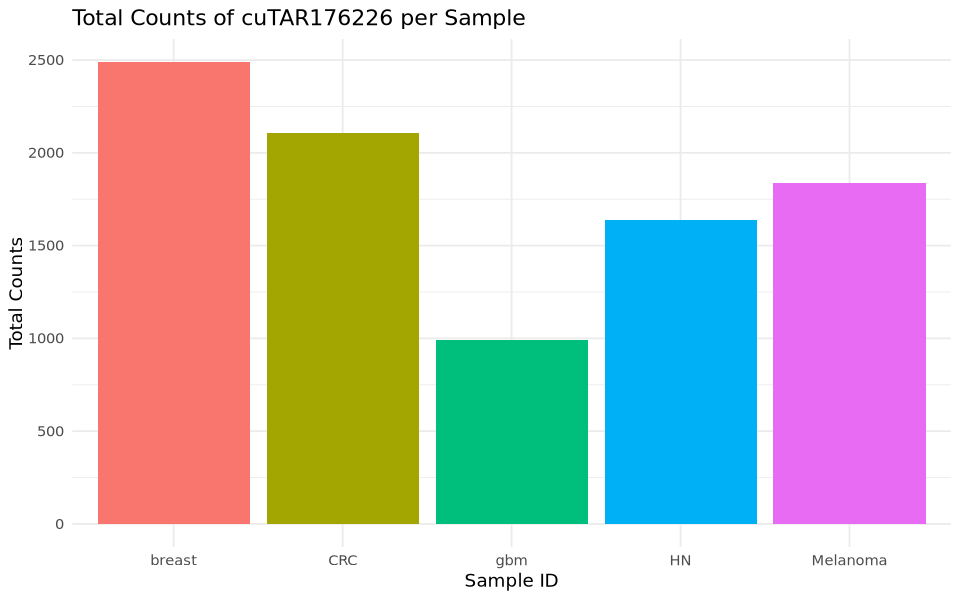

In [59]:
options(repr.plot.width = 8, repr.plot.height = 5)

# Specify gene of interest
gene_name <- "cuTAR176226" #"cuTAR78711"  # Replace with your gene

# Extract raw counts for the gene
gene_counts <- FetchData(so, vars = gene_name, slot = "counts")

# Add sample IDs
gene_counts$sample_id <- so$sample_id

# Sum counts per sample
gene_summary <- gene_counts %>%
  group_by(sample_id) %>%
  summarise(total_count = sum(.data[[gene_name]]))  # Sum counts across all cells

# Plot total counts
ggplot(gene_summary, aes(x = sample_id, y = total_count, fill = sample_id)) +
  geom_bar(stat = "identity") +
  labs(title = paste("Total Counts of", gene_name, "per Sample"),
       x = "Sample ID",
       y = "Total Counts") +
  theme_minimal() +
  theme(legend.position = "none")


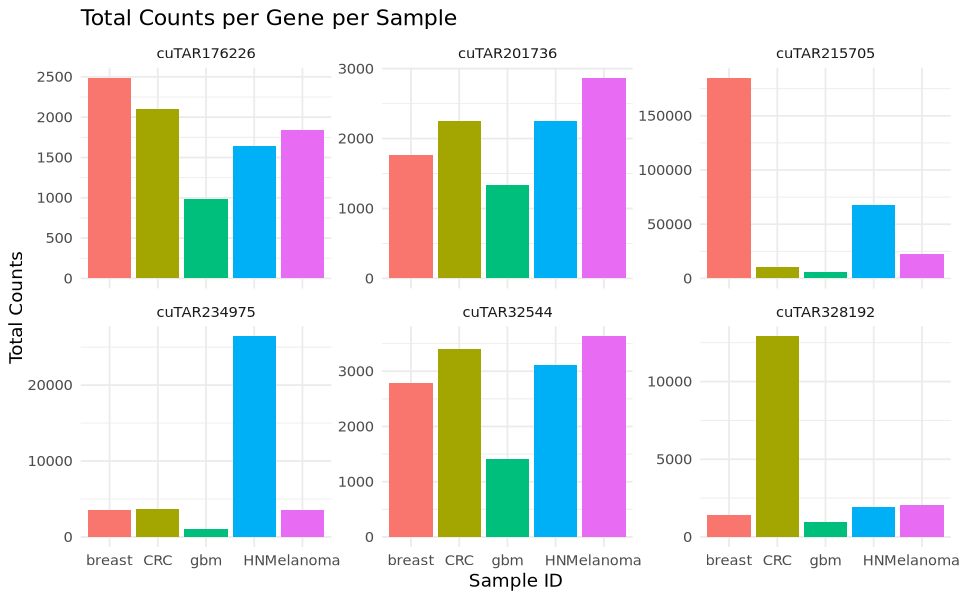

In [68]:
#options(repr.plot.width = 10, repr.plot.height = 6)

# List of genes to plot
gene_list <- c("cuTAR215705","cuTAR176226","cuTAR328192", "cuTAR234975","cuTAR201736","cuTAR32544")  # Add more genes as needed

# Extract raw counts for all genes
gene_counts <- FetchData(so, vars = gene_list, slot = "counts")

# Add sample IDs
gene_counts$sample_id <- so$sample_id

# Convert to long format
gene_long <- gene_counts %>%
  pivot_longer(cols = all_of(gene_list), names_to = "gene", values_to = "count")

# Sum counts per sample for each gene
gene_summary <- gene_long %>%
  group_by(sample_id, gene) %>%
  summarise(total_count = sum(count), .groups = "drop") 

# Plot total counts for each gene
ggplot(gene_summary, aes(x = sample_id, y = total_count, fill = sample_id)) +
  geom_bar(stat = "identity") +
  facet_wrap(~gene, scales = "free_y") +  # Separate plots per gene
  labs(title = "Total Counts per Gene per Sample",
       x = "Sample ID",
       y = "Total Counts") +
  theme_minimal() +
  theme(legend.position = "none")


In [70]:
install.packages("ggpubr")

also installing the dependencies ‘rbibutils’, ‘Deriv’, ‘modelr’, ‘microbenchmark’, ‘Rdpack’, ‘numDeriv’, ‘doBy’, ‘SparseM’, ‘MatrixModels’, ‘boot’, ‘minqa’, ‘nloptr’, ‘reformulas’, ‘backports’, ‘carData’, ‘Formula’, ‘nnet’, ‘pbkrtest’, ‘quantreg’, ‘lme4’, ‘broom’, ‘corrplot’, ‘car’, ‘ggsci’, ‘ggsignif’, ‘polynom’, ‘rstatix’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done



In [23]:
#so_SCT <- SCTransform(so, vars.to.regress = "sample_id")


Running SCTransform on assay: RNA

Running SCTransform on layer: counts

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

`vst.flavor` is set to 'v2' but could not find glmGamPoi installed.
Please install the glmGamPoi package for much faster estimation.
--------------------------------------------
install.packages('BiocManager')
BiocManager::install('glmGamPoi')
--------------------------------------------
Falling back to native (slower) implementation.




In [24]:
so<-NormalizeData(so)

Normalizing layer: counts



In [78]:

# load libraries and functions
lapply(c("dplyr","Seurat","HGNChelper","openxlsx"), library, character.only = T)
source("https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/R/gene_sets_prepare.R"); source("https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/R/sctype_score_.R")


# get cell-type-specific gene sets from our in-built database (DB)
gs_list <- gene_sets_prepare("https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/ScTypeDB_short.xlsx", "Immune system") # e.g. Immune system, Liver, Pancreas, Kidney, Eye, Brain

# load example (scaled/normalized) scRNA-seq matrix
scRNAseqData <- readRDS(gzcon(url('https://raw.githubusercontent.com/IanevskiAleksandr/sc-type/master/exampleData.RDS')));

# assign cell types
es.max <- sctype_score(scRNAseqData = scRNAseqData, scaled = TRUE, gs = gs_list$gs_positive, gs2 = gs_list$gs_negative)

# View results, cell-type by cell matrix. See the complete example below
View(es.max)


Please cite our software :) 
 
 Sehyun Oh et al. HGNChelper: identification and correction of invalid gene symbols for human and mouse. F1000Research 2020, 9:1493. DOI: https://doi.org/10.12688/f1000research.28033.1 
 
 Type `citation('HGNChelper')` for a BibTeX entry.



[[1]]
 [1] "ggpubr"       "tidyr"        "ggplot2"      "pheatmap"     "edgeR"       
 [6] "limma"        "Seurat"       "SeuratObject" "sp"           "dplyr"       
[11] "stats"        "graphics"     "grDevices"    "utils"        "datasets"    
[16] "methods"      "base"        

[[2]]
 [1] "ggpubr"       "tidyr"        "ggplot2"      "pheatmap"     "edgeR"       
 [6] "limma"        "Seurat"       "SeuratObject" "sp"           "dplyr"       
[11] "stats"        "graphics"     "grDevices"    "utils"        "datasets"    
[16] "methods"      "base"        

[[3]]
 [1] "HGNChelper"   "ggpubr"       "tidyr"        "ggplot2"      "pheatmap"    
 [6] "edgeR"        "limma"        "Seurat"       "SeuratObject" "sp"          
[11] "dplyr"        "stats"        "graphics"     "grDevices"    "utils"       
[16] "datasets"     "methods"      "base"        

[[4]]
 [1] "openxlsx"     "HGNChelper"   "ggpubr"       "tidyr"        "ggplot2"     
 [6] "pheatmap"     "edgeR"        "limma"        "Seurat"       "SeuratObject"
[11] "sp"           "dplyr"        "stats"        "graphics"     "grDevices"   
[16] "utils"        "datasets"     "methods"      "base"

Warning message in checkGeneSymbols(markers_all):
“Human gene symbols should be all upper-case except for the 'orf' in open reading frames. The case of some letters was corrected.”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in checkGeneSymbols(markers_all):
“x contains non-approved gene symbols”
Warning message in

,AAACATACAACCAC-1,AAACATTGAGCTAC-1,AAACATTGATCAGC-1,AAACCGTGCTTCCG-1,AAACCGTGTATGCG-1,AAACGCACTGGTAC-1,AAACGCTGACCAGT-1,AAACGCTGGTTCTT-1,AAACGCTGTAGCCA-1,AAACGCTGTTTCTG-1,⋯,TTTCAGTGTCACGA-1,TTTCAGTGTCTATC-1,TTTCAGTGTGCAGT-1,TTTCCAGAGGTGAG-1,TTTCGAACACCTGA-1,TTTCGAACTCTCAT-1,TTTCTACTGAGGCA-1,TTTCTACTTCCTCG-1,TTTGCATGAGAGGC-1,TTTGCATGCCTCAC-1
Pro-B cells,-0.83486173,1.58495755,-0.83486173,0.29247294,-0.83486173,0.41766286,-0.83486173,-0.83486173,0.01800423,-0.83486173,⋯,3.64340141,-0.83486173,4.13879895,0.20012476,1.425473714,0.55529043,1.51700098,3.85460406,4.11091998,-0.83486173
Pre-B cells,-0.83948489,1.77421867,-0.83948489,0.37817573,-0.83948489,0.51339630,-0.83948489,-0.83948489,0.08171564,-0.83948489,⋯,3.99759215,-0.83948489,4.53268266,0.27842830,1.601956436,0.66205107,1.70081718,4.22571709,4.50256992,-0.83948489
Immature B cells,-0.91723707,2.17704394,-0.85981323,0.53780097,-1.17850853,0.20192440,-0.90342459,-0.90843623,0.33984098,0.16654747,⋯,3.46132163,-0.30600036,4.18553779,-0.26573624,0.814919958,0.88213515,1.37445319,3.63812709,4.48120287,-0.89127015
Naive B cells,-1.03755018,2.54071969,-1.03755018,-0.04333445,-1.03755018,0.06707269,-1.03755018,-1.03755018,0.48079933,-0.22582160,⋯,3.60227998,-1.03755018,4.32649615,-0.12477788,1.777159860,0.18844879,3.75880300,3.77908544,4.62216122,-1.03755018
Memory B cells,-1.03755018,2.54071969,-1.03755018,-0.04333445,-1.03755018,0.06707269,-1.03755018,-1.03755018,0.48079933,-0.22582160,⋯,3.60227998,-1.03755018,4.32649615,-0.12477788,1.777159860,0.18844879,3.75880300,3.77908544,4.62216122,-1.03755018
Plasma B cells,-0.66484848,0.18942679,-0.66484848,0.32936725,-0.66484848,0.43977438,-0.66484848,-0.66484848,-1.44507626,-2.28830564,⋯,1.90386178,-0.66484848,1.76612815,0.24792381,2.149861557,0.56115049,2.69506339,2.10904056,1.10103716,-0.66484848
Naive CD8+ T cells,-0.66359569,-2.15015513,2.35425703,-1.11240461,1.86877172,0.24586724,2.01799758,1.11204303,-0.75177858,0.24586724,⋯,-1.92923792,-2.29773451,-1.88771864,0.89635834,-0.080916871,-1.89764196,-1.78742418,-2.41464581,-2.53146961,1.12994595
Naive CD4+ T cells,-0.57001666,-2.05657609,2.18220844,-0.84010423,0.99174461,0.33944628,1.07047097,1.33961992,-1.43952140,0.33944628,⋯,-1.83565888,-2.20415547,-1.79413960,1.09056870,0.322566838,-1.80406292,-1.69384514,-2.32106678,-2.43789057,1.36029244
Memory CD8+ T cells,-0.66230165,-1.40893625,1.29001668,0.80992714,2.38093878,-0.32955347,0.84407356,0.20825069,0.21042967,-0.30546141,⋯,-0.84395160,-0.12625763,-1.40893625,0.30564880,0.971309975,-0.25129853,-0.85710562,-1.40893625,-1.40893625,0.25984847
Memory CD4+ T cells,-0.56151372,-1.39627658,1.10873359,1.08448811,1.60296307,-0.18948994,-0.01637942,0.41179339,-0.36709230,-0.16255420,⋯,-0.76460454,0.03780172,-1.39627658,0.52068779,1.264919605,-0.10199825,-0.77931117,-1.39627658,-1.39627658,0.46948146


# Denisty plots

Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 108469 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 192051 rows containing non-finite outside the scale range
(`stat_density()`).”


pdf 
  2

Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 108469 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 192051 rows containing non-finite outside the scale range
(`stat_density()`).”


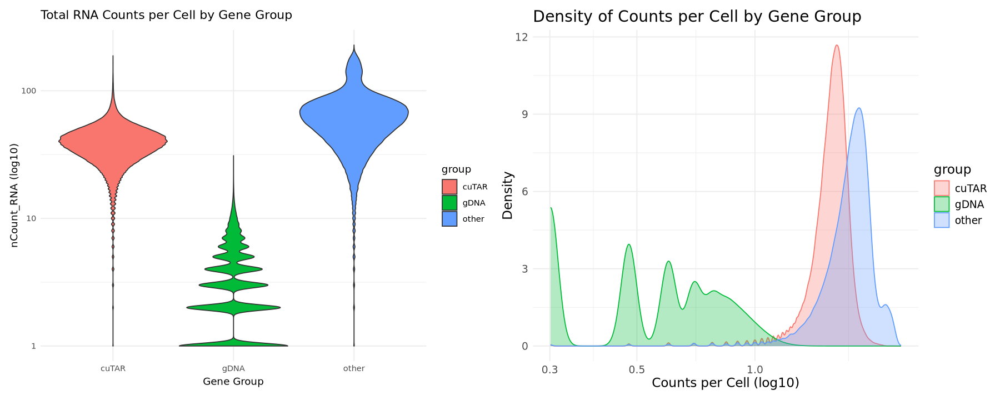

In [42]:
# Example usage
plots <- plot_gene_groups_density(breast)
pdf("plots/breast_QC_density_groups.pdf",width=15,height=6)
plots$violin_plot + plots$density_plot
dev.off()
plots$violin_plot + plots$density_plot


Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 178717 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 303546 rows containing non-finite outside the scale range
(`stat_density()`).”


pdf 
  2

Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 178717 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 303546 rows containing non-finite outside the scale range
(`stat_density()`).”


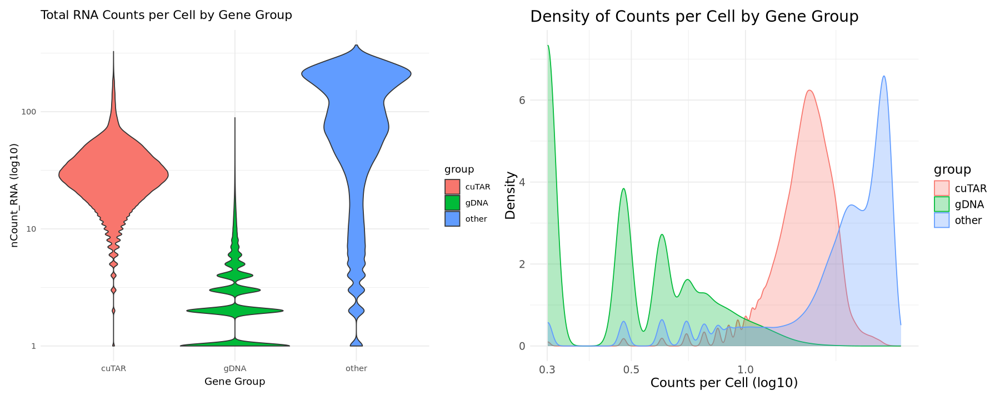

In [43]:
HN<-readRDS("mel/clean-data/xenium_spatial_HN_LT.rds")
plots <- plot_gene_groups_density(HN)
pdf("plots/HN_QC_density_groups.pdf",width=15,height=6)
plots$violin_plot + plots$density_plot
dev.off()
plots$violin_plot + plots$density_plot


Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 47373 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 81010 rows containing non-finite outside the scale range
(`stat_density()`).”


pdf 
  2

Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 47373 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 81010 rows containing non-finite outside the scale range
(`stat_density()`).”


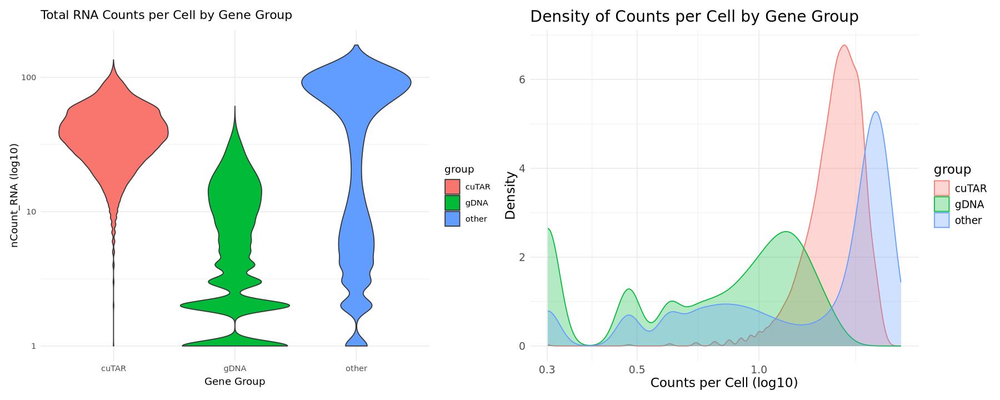

In [45]:
GBM<-readRDS("mel/clean-data/xenium_spatial_GBM_LT.rds")
plots <- plot_gene_groups_density(GBM)
pdf("plots/GBM_QC_density_groups.pdf",width=15,height=6)
plots$violin_plot + plots$density_plot
dev.off()
plots$violin_plot + plots$density_plot


Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 145995 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 222330 rows containing non-finite outside the scale range
(`stat_density()`).”


pdf 
  2

Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 145995 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 222330 rows containing non-finite outside the scale range
(`stat_density()`).”


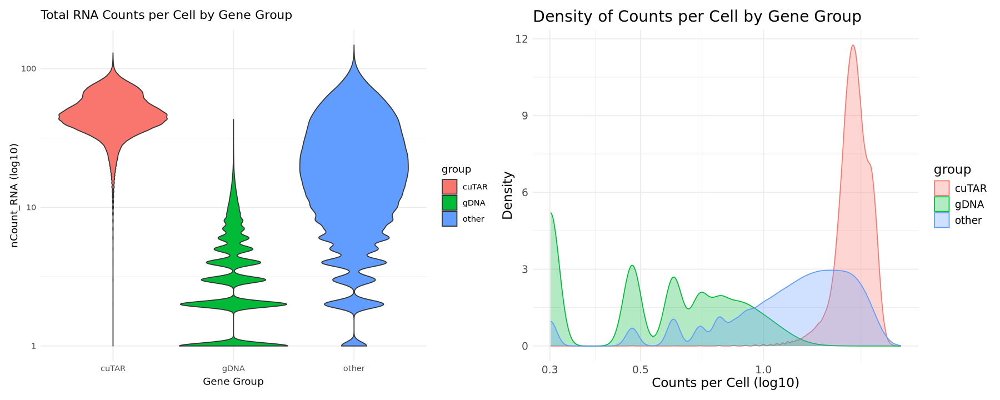

In [46]:
CRC<-readRDS("mel/clean-data/xenium_spatial_CRC_LT.rds")
plots <- plot_gene_groups_density(CRC)
pdf("plots/CRC_QC_density_groups.pdf",width=15,height=6)
plots$violin_plot + plots$density_plot
dev.off()
plots$violin_plot + plots$density_plot


Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 116702 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 182795 rows containing non-finite outside the scale range
(`stat_density()`).”


pdf 
  2

Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 116702 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 182795 rows containing non-finite outside the scale range
(`stat_density()`).”


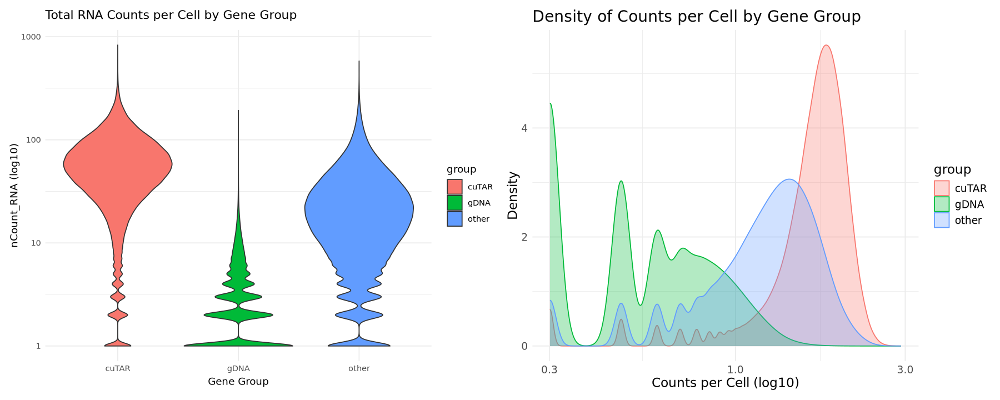

In [47]:
Mel<-readRDS("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__Melanoma__20250319__042625/Mel_loaded.rds")
plots <- plot_gene_groups_density(Mel)
pdf("plots/Mel_QC_density_groups.pdf",width=15,height=6)
plots$violin_plot + plots$density_plot
dev.off()
plots$violin_plot + plots$density_plot


In [19]:
## including Neg control

Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 751921 rows containing non-finite outside the scale range
(`stat_ydensity()`).”


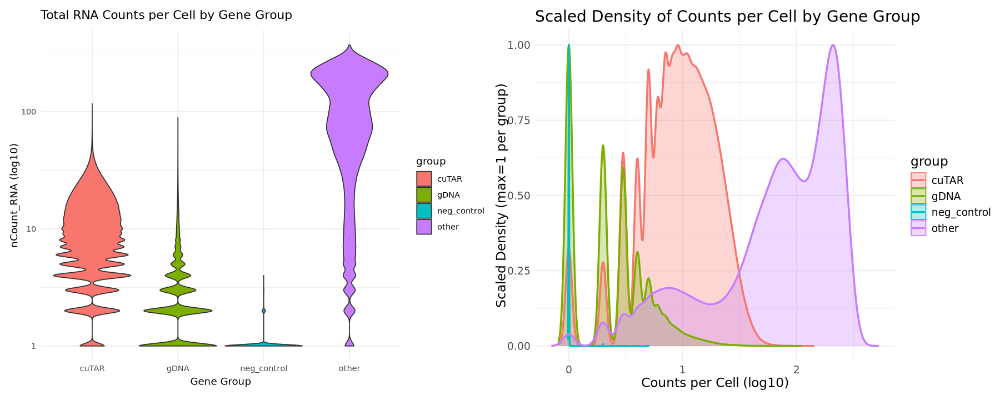

In [85]:
plot_gene_groups_density2 <- function(breast) {
  library(Matrix)
  library(dplyr)
  library(tidyr)
  library(ggplot2)
  library(stringr)  # for str_starts()

  counts <- GetAssayData(breast, layer = "counts")
  gene_names <- rownames(counts)

  gene_group <- case_when(
    str_starts(gene_names, "gDNA") ~ "gDNA",
    str_starts(gene_names, "cuTAR") ~ "cuTAR",
    TRUE ~ "other"
  )

  group_df <- data.frame(
    gene = gene_names,
    group = gene_group
  )
  gDNA_genes <- group_df %>% filter(group == "gDNA") %>% pull(gene)
  cuTAR_genes <- group_df %>% filter(group == "cuTAR" & gene != "cuTAR170802") %>% pull(gene)
  other_genes <- group_df %>% filter(group == "other") %>% pull(gene)

  neg_control_counts <- Matrix::colSums(GetAssayData(breast, assay = "ControlProbe", layer = "counts"))

  cell_counts <- data.frame(
    cell = colnames(counts),
    gDNA = Matrix::colSums(counts[gDNA_genes, , drop = FALSE]),
    cuTAR = Matrix::colSums(counts[cuTAR_genes, , drop = FALSE]),
    other = Matrix::colSums(counts[other_genes, , drop = FALSE]),
    neg_control = neg_control_counts[colnames(counts)]
  )

  cell_counts_long <- pivot_longer(cell_counts,
                                   cols = c("gDNA", "cuTAR", "other", "neg_control"),
                                   names_to = "group", values_to = "count")

  # Violin plot as before
  v <- ggplot(cell_counts_long, aes(x = group, y = count, fill = group)) +
    geom_violin(scale = "width", trim = TRUE) +
    scale_y_log10() +
    labs(
      title = "Total RNA Counts per Cell by Gene Group",
      x = "Gene Group",
      y = "nCount_RNA (log10)"
    ) +
    theme_minimal()

  # Compute scaled densities per group for better y-axis comparison
  scaled_density_df <- cell_counts_long %>%
    group_by(group) %>%
    do({
      dens <- density(log10(.$count + 1), adjust = 1.5)
      data.frame(x = dens$x, y = dens$y / max(dens$y), group = unique(.$group))
    })

  d <- ggplot(scaled_density_df, aes(x = x, y = y, color = group, fill = group)) +
    geom_area(alpha = 0.3, position = 'identity') +
    geom_line(size = 1) +
    labs(title = "Scaled Density of Counts per Cell by Gene Group",
         x = "Counts per Cell (log10)",
         y = "Scaled Density (max=1 per group)") +
    theme_minimal() +
    theme(text = element_text(size = 14))

  return(list(violin_plot = v, scaled_density_plot = d))
}
#CRC<-readRDS("mel/clean-data/xenium_spatial_CRC_LT.rds")
plots <- plot_gene_groups_density2(HN)
plots$violin_plot + plots$scaled_density_plot


Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 384950 rows containing non-finite outside the scale range
(`stat_ydensity()`).”


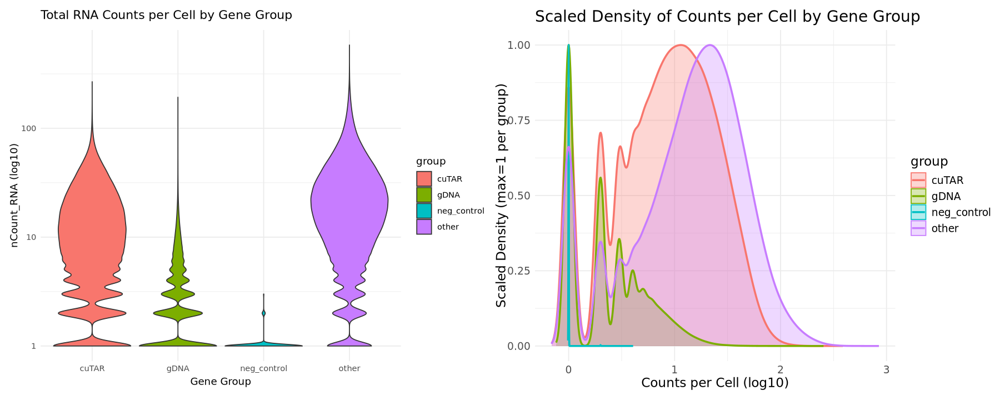

In [86]:
plots <- plot_gene_groups_density2(Mel)
plots$violin_plot + plots$scaled_density_plot

Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 607351 rows containing non-finite outside the scale range
(`stat_ydensity()`).”


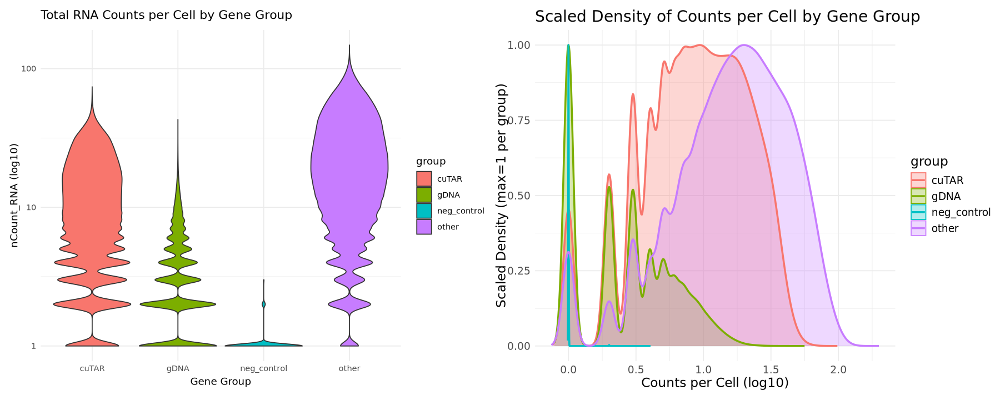

In [87]:
plots <- plot_gene_groups_density2(CRC)
plots$violin_plot + plots$scaled_density_plot

In [15]:
options(repr.plot.width = 15, repr.plot.height = 5)

Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 589209 rows containing non-finite outside the scale range
(`stat_ydensity()`).”


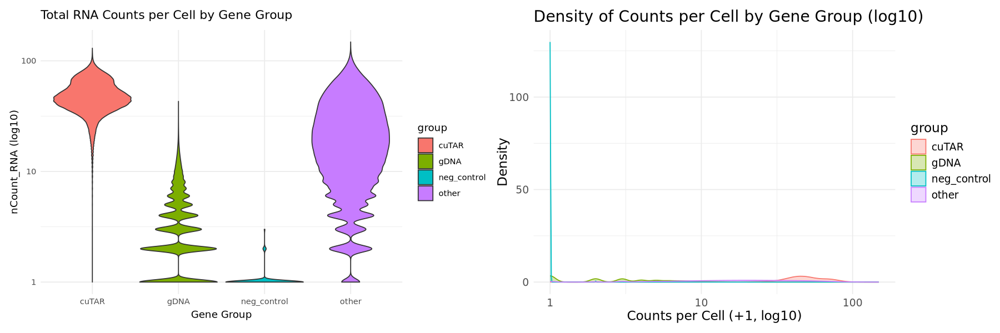

In [20]:
plot_gene_groups_density2 <- function(breast) {
  # Get counts data from the Xenium assay (or whatever is default)
  counts <- GetAssayData(breast, layer = "counts")
  gene_names <- rownames(counts)
  
  # Classify gene group
  gene_group <- case_when(
    str_starts(gene_names, "gDNA") ~ "gDNA",
    str_starts(gene_names, "cuTAR") ~ "cuTAR",
    TRUE ~ "other"
  )
  
  # Organize genes into groups
  group_df <- data.frame(
    gene = gene_names,
    group = gene_group
  )
  gDNA_genes <- group_df %>% filter(group == "gDNA") %>% pull(gene)
  cuTAR_genes <- group_df %>% filter(group == "cuTAR") %>% pull(gene)
  other_genes <- group_df %>% filter(group == "other") %>% pull(gene)
  
  # Get neg_control counts from ControlCodeword assay
  neg_control_counts <- Matrix::colSums(GetAssayData(breast, assay = "ControlProbe", layer = "counts"))
  
  # Sum counts per cell for each group
  cell_counts <- data.frame(
    cell = colnames(counts),
    gDNA = Matrix::colSums(counts[gDNA_genes, , drop = FALSE]),
    cuTAR = Matrix::colSums(counts[cuTAR_genes, , drop = FALSE]),
    other = Matrix::colSums(counts[other_genes, , drop = FALSE]),
    neg_control = neg_control_counts[colnames(counts)]  # ensure correct order
  )
  
  # Reshape to long format for plotting
  cell_counts_long <- pivot_longer(cell_counts,
                                   cols = c("gDNA", "cuTAR", "other", "neg_control"),
                                   names_to = "group", values_to = "count")
  
  # Violin plot
  v <- ggplot(cell_counts_long, aes(x = group, y = count, fill = group)) +
    geom_violin(scale = "width", trim = TRUE) +
    scale_y_log10() +
    labs(
      title = "Total RNA Counts per Cell by Gene Group",
      x = "Gene Group",
      y = "nCount_RNA (log10)"
    ) +
    theme_minimal()
  
  # Density plot
  d <- ggplot(cell_counts_long, aes(x = log10(count + 1), color = group, fill = group)) +
    geom_density(alpha = 0.3, adjust = 1.5) +
    labs(title = "Density of Counts per Cell by Gene Group",
         x = "Counts per Cell (log10)", y = "Density") +
    theme_minimal() +
    theme(text = element_text(size = 14))

      
  
  # Return plots
  return(list(violin_plot = v, density_plot = d))
}



#CRC<-readRDS("mel/clean-data/xenium_spatial_CRC_LT.rds")
plots <- plot_gene_groups_density2(CRC)
plots$violin_plot + plots$density_plot


Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 736035 rows containing non-finite outside the scale range
(`stat_ydensity()`).”


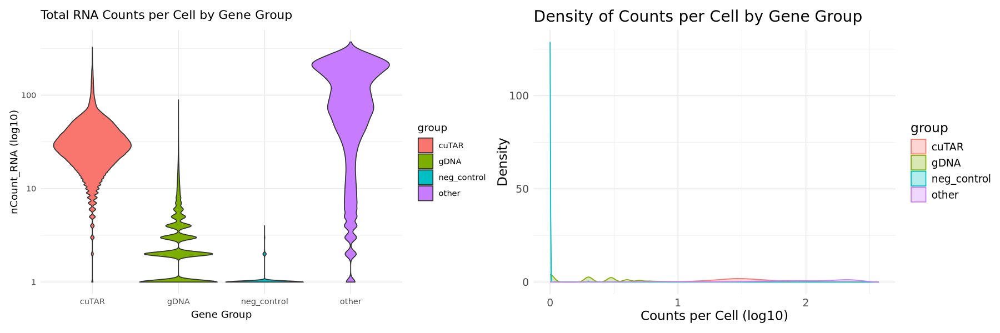

In [17]:
#HN<-readRDS("mel/clean-data/xenium_spatial_HN_LT.rds")
plots <- plot_gene_groups_density2(HN)
plots$violin_plot + plots$density_plot


Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 367514 rows containing non-finite outside the scale range
(`stat_ydensity()`).”


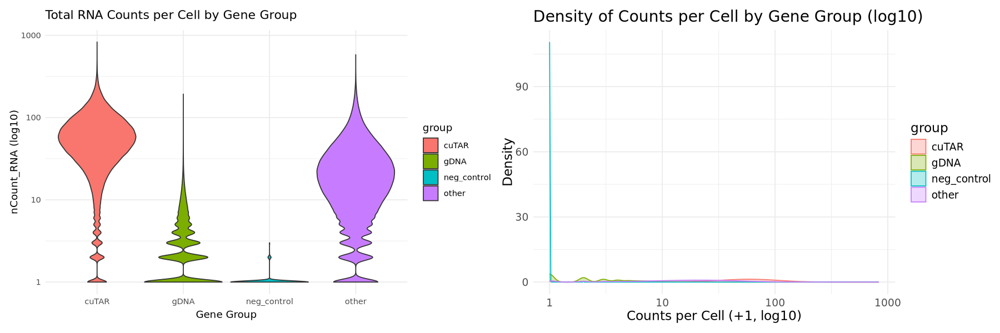

In [28]:
#Mel<-readRDS("/QRISdata/Q4386/Xenium_20250319__042556__20250319_lncRNA_IO_Cancer/output-XETG00114__0016985__Melanoma__20250319__042625/Mel_loaded.rds")
plots <- plot_gene_groups_density2(Mel)
plots$violin_plot + plots$density_plot


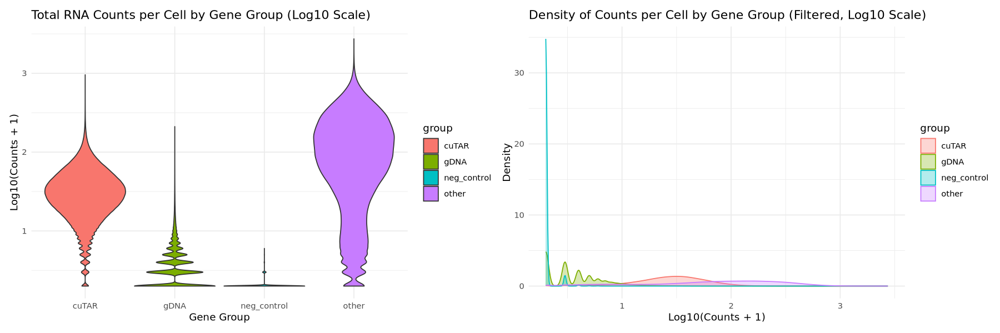

In [30]:
plots<-plot_all_group_densities(HN)
plots$violin_plot + plots$density_plot

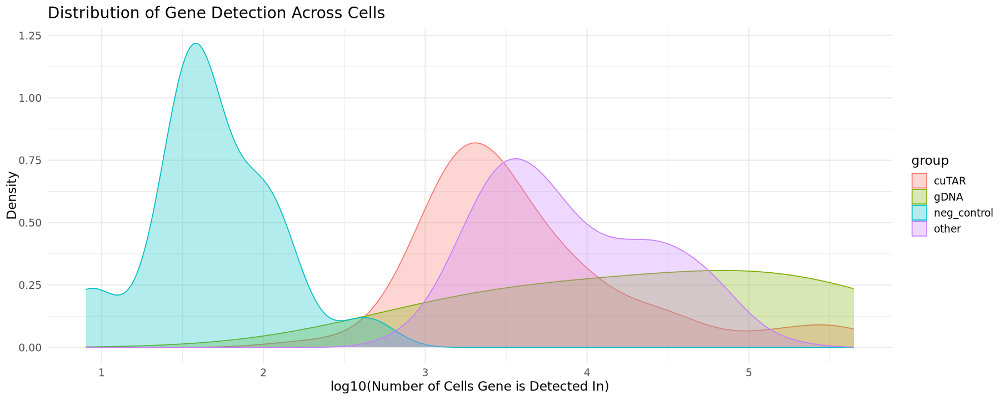

In [52]:
plot_transcript_detection_distribution(CRC)

In [50]:
plot_transcript_detection_distribution <- function(seurat_obj) {
  library(Matrix)
  library(dplyr)
  library(tidyr)
  library(ggplot2)
  
  # Get counts from default assay
  counts <- GetAssayData(seurat_obj, layer = "counts")
  gene_names <- rownames(counts)
  
  # Classify gene group
  gene_group <- case_when(
    str_starts(gene_names, "gDNA") ~ "gDNA",
    str_starts(gene_names, "cuTAR") ~ "cuTAR",
    TRUE ~ "other"
  )
  
  # Create group mapping
  group_df <- data.frame(gene = gene_names, group = gene_group)
  
  # Get ControlProbe assay for neg_control
  if ("ControlProbe" %in% names(seurat_obj@assays)) {
    neg_control_counts <- GetAssayData(seurat_obj, assay = "ControlProbe", layer = "counts")
    neg_control_detected <- Matrix::rowSums(neg_control_counts > 0)
    df_neg_control <- data.frame(
      gene = rownames(neg_control_counts),
      cells_detected = neg_control_detected,
      group = "neg_control"
    )
  } else {
    warning("ControlProbe assay not found.")
    df_neg_control <- data.frame()
  }

  # Detection: number of cells per gene with count > 0
  counts_detected <- Matrix::rowSums(counts > 0)
  df_detected <- data.frame(
    gene = rownames(counts),
    cells_detected = counts_detected
  ) %>%
    left_join(group_df, by = "gene")
  
  # Combine with neg_control if available
  all_detected <- bind_rows(df_detected, df_neg_control)
  
  # Filter out zero-detected genes
  all_detected <- all_detected %>% filter(cells_detected > 0)
  
  # Plot density
  p <- ggplot(all_detected, aes(x = log10(cells_detected + 0.0001), fill = group, color = group)) +
    geom_density(alpha = 0.3, adjust = 1.2) +
    labs(title = "Distribution of Gene Detection Across Cells",
         x = "log10(Number of Cells Gene is Detected In)",
         y = "Density") +
    theme_minimal(base_size = 14)
  
  return(p)
}


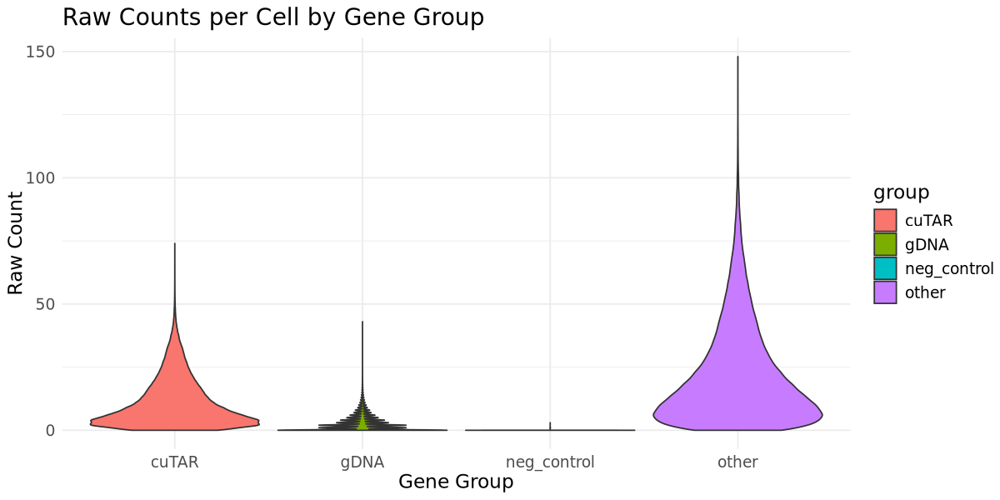

In [69]:
plot_violin_raw_counts_per_cell <- function(seurat_obj) {
  library(Matrix)
  library(dplyr)
  library(tidyr)
  library(ggplot2)
  library(Seurat)
  library(stringr)  # for str_starts()

  counts <- GetAssayData(seurat_obj, layer = "counts")
  gene_names <- rownames(counts)

  gene_group <- case_when(
    str_starts(gene_names, "gDNA") ~ "gDNA",
    str_starts(gene_names, "cuTAR") ~ "cuTAR",
    TRUE ~ "other"
  )
  group_df <- data.frame(gene = gene_names, group = gene_group)

  # Exclude cuTAR170802 from cuTAR group
  cuTAR_genes <- group_df$gene[group_df$group == "cuTAR" & group_df$gene != "cuTAR170802"]
  gDNA_genes <- group_df$gene[group_df$group == "gDNA"]
  other_genes <- group_df$gene[group_df$group == "other"]

  gDNA_sum <- colSums(counts[gDNA_genes, , drop = FALSE])
  cuTAR_sum <- colSums(counts[cuTAR_genes, , drop = FALSE])
  other_sum <- colSums(counts[other_genes, , drop = FALSE])

  neg_control <- GetAssayData(seurat_obj, assay = "ControlProbe", layer = "counts")
  neg_sum <- colSums(neg_control)

  cell_counts <- data.frame(
    cell = colnames(counts),
    gDNA = gDNA_sum[colnames(counts)],
    cuTAR = cuTAR_sum[colnames(counts)],
    other = other_sum[colnames(counts)],
    neg_control = neg_sum[colnames(counts)]
  )

  long_counts <- pivot_longer(cell_counts, cols = c("gDNA", "cuTAR", "other", "neg_control"),
                              names_to = "group", values_to = "raw_count")

  p <- ggplot(long_counts, aes(x = group, y = raw_count, fill = group)) +
    geom_violin(trim = TRUE, scale = "width") +
    labs(
      title = "Raw Counts per Cell by Gene Group",
      x = "Gene Group",
      y = "Raw Count"
    ) +
    theme_minimal() +
    theme(text = element_text(size = 14))

  return(p)
}
plot_violin_raw_counts_per_cell(CRC)

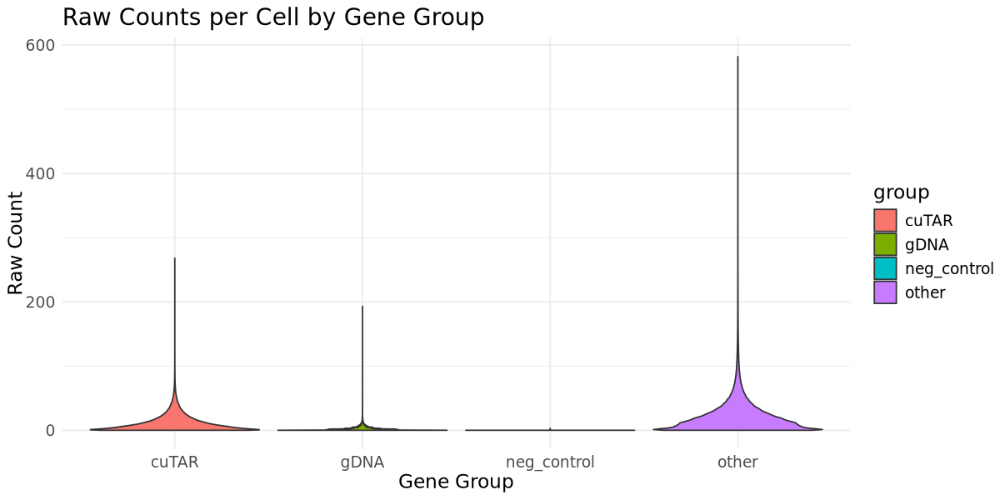

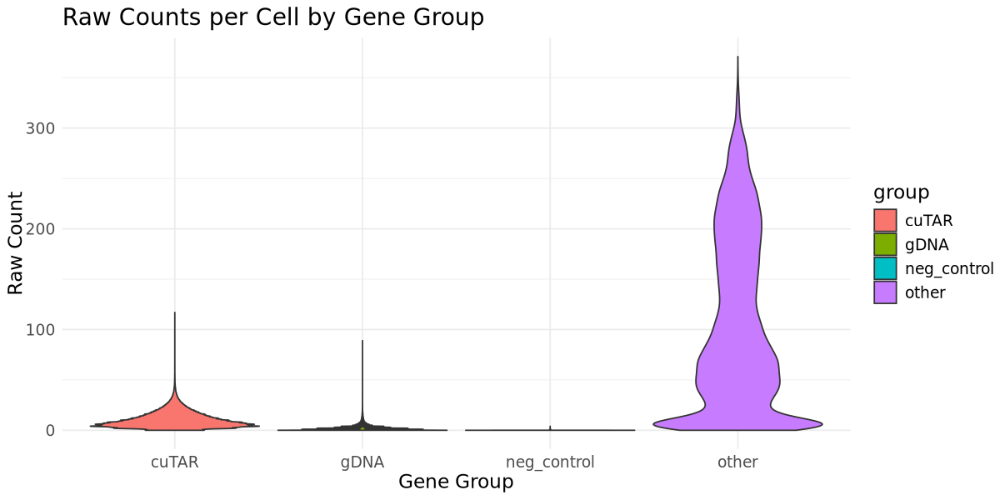

In [70]:
plot_violin_raw_counts_per_cell(Mel)
plot_violin_raw_counts_per_cell(HN)

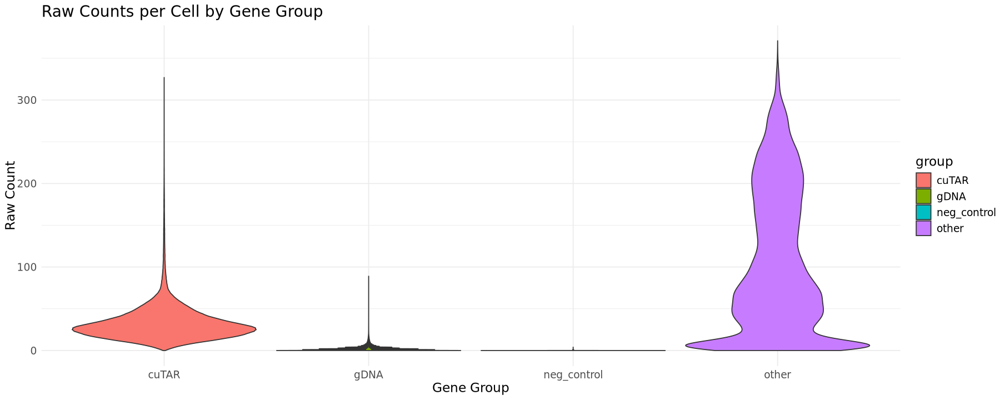

In [56]:
plot_violin_raw_counts_per_cell <- function(seurat_obj) {
  library(Matrix)
  library(dplyr)
  library(tidyr)
  library(ggplot2)
  library(Seurat)

  # Get raw counts from main assay
  counts <- GetAssayData(seurat_obj, layer = "counts")
  gene_names <- rownames(counts)

  # Categorize gene groups
  gene_group <- case_when(
    str_starts(gene_names, "gDNA") ~ "gDNA",
    str_starts(gene_names, "cuTAR") ~ "cuTAR",
    TRUE ~ "other"
  )
  group_df <- data.frame(gene = gene_names, group = gene_group)

  # Sum counts per **cell** for each group
  gDNA_sum <- colSums(counts[group_df$gene[group_df$group == "gDNA"], , drop = FALSE])
  cuTAR_sum <- colSums(counts[group_df$gene[group_df$group == "cuTAR"], , drop = FALSE])
    
  other_sum <- colSums(counts[group_df$gene[group_df$group == "other"], , drop = FALSE])

  # Get negative control counts
  neg_control <- GetAssayData(seurat_obj, assay = "ControlProbe", layer = "counts")
  neg_sum <- colSums(neg_control)

  # Combine into one data frame
  cell_counts <- data.frame(
    cell = colnames(counts),
    gDNA = gDNA_sum[colnames(counts)],
    cuTAR = cuTAR_sum[colnames(counts)],
    other = other_sum[colnames(counts)],
    neg_control = neg_sum[colnames(counts)]
  )

  # Convert to long format
  long_counts <- pivot_longer(cell_counts, cols = c("gDNA", "cuTAR", "other", "neg_control"),
                              names_to = "group", values_to = "raw_count")

  # Violin plot of raw counts per cell
  p <- ggplot(long_counts, aes(x = group, y = raw_count, fill = group)) +
    geom_violin(trim = TRUE, scale = "width") +
    labs(
      title = "Raw Counts per Cell by Gene Group",
      x = "Gene Group",
      y = "Raw Count"
    ) +
    theme_minimal() +
    theme(text = element_text(size = 14))

  return(p)
}

plot_violin_raw_counts_per_cell(HN)

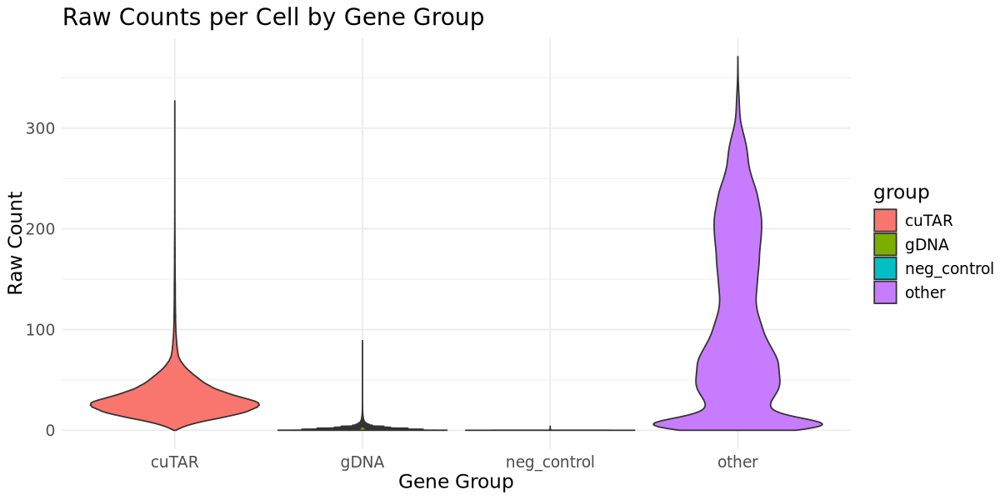

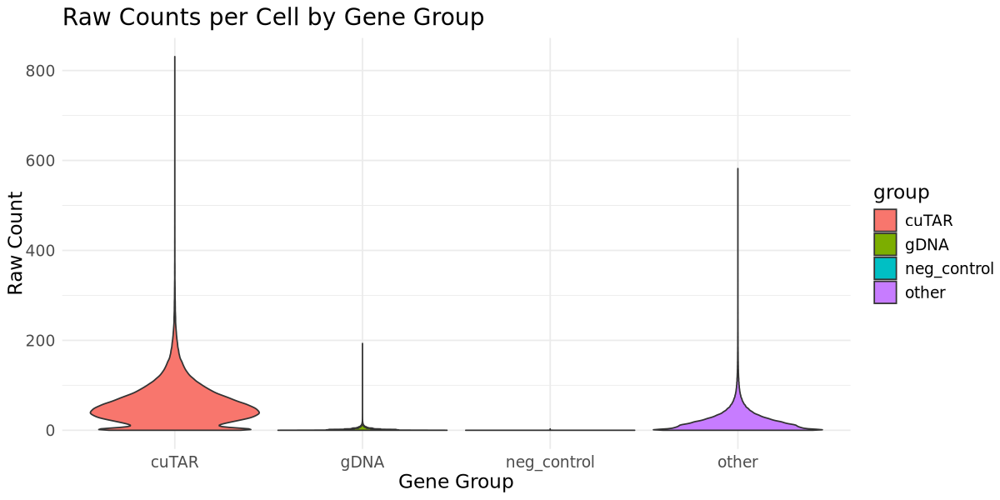

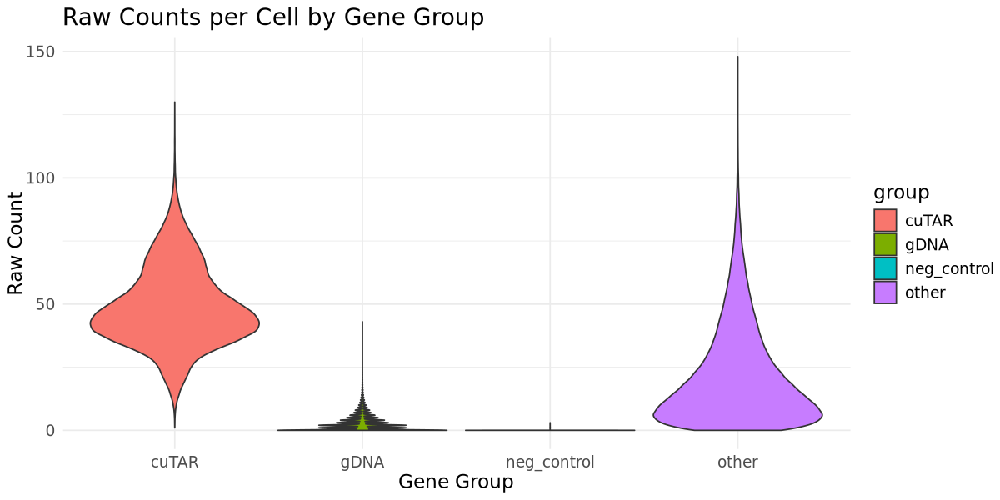

In [59]:
options(repr.plot.width = 10, repr.plot.height = 5)
plot_violin_raw_counts_per_cell(HN)
plot_violin_raw_counts_per_cell(Mel)
plot_violin_raw_counts_per_cell(CRC)


Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 178717 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 303546 rows containing non-finite outside the scale range
(`stat_density()`).”


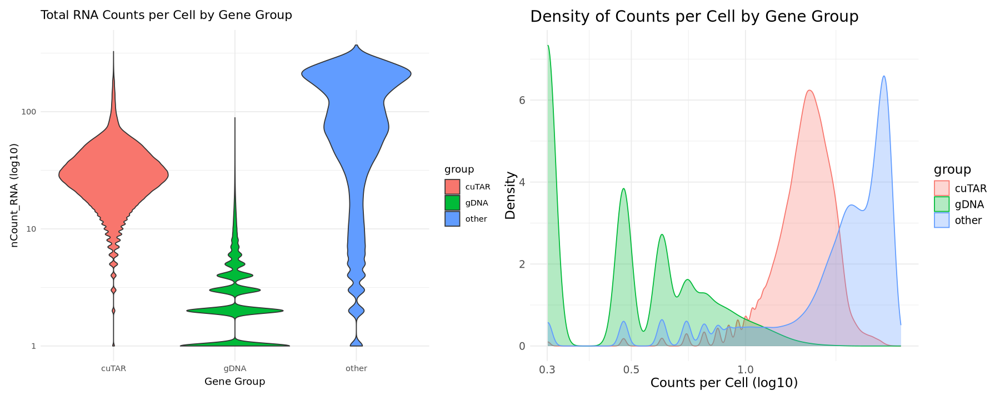

In [74]:
# Function to create violin and density plots based on gene classification
plot_gene_groups_density <- function(breast) {
  # Get counts data
  counts <- GetAssayData(breast, layer = "counts")
  
  # Get gene names
  gene_names <- rownames(counts)
  
  # Classify genes
  gene_group <- case_when(
    str_starts(gene_names, "gDNA") ~ "gDNA",
    str_starts(gene_names, "cuTAR") ~ "cuTAR",
    TRUE ~ "other"
  )
  
  # Split matrix into three groups
  group_df <- data.frame(
    gene = gene_names,
    group = gene_group
  )
  
  # Get gene indices for each group
  gDNA_genes <- group_df %>% filter(group == "gDNA") %>% pull(gene)
  cuTAR_genes <- group_df %>% filter(group == "cuTAR") %>% pull(gene)
  other_genes <- group_df %>% filter(group == "other") %>% pull(gene)
  
  # Sum counts per cell for each group
  cell_counts <- data.frame(
    cell = colnames(counts),
    gDNA = Matrix::colSums(counts[gDNA_genes, , drop = FALSE]),
    cuTAR = Matrix::colSums(counts[cuTAR_genes, , drop = FALSE]),
    other = Matrix::colSums(counts[other_genes, , drop = FALSE])
  )
  
  # Reshape to long format for plotting
  cell_counts_long <- pivot_longer(cell_counts, cols = c("gDNA", "cuTAR", "other"),
                                   names_to = "group", values_to = "count")
  
  # Violin plot
  v <- ggplot(cell_counts_long, aes(x = group, y = count, fill = group)) +
    geom_violin(scale = "width", trim = TRUE) +
    scale_y_log10() +
    labs(
      title = "Total RNA Counts per Cell by Gene Group",
      x = "Gene Group",
      y = "nCount_RNA (log10)"
    ) +
    theme_minimal()
  
  # Density plot
  d <- ggplot(cell_counts_long, aes(x = log10(count), color = group, fill = group)) +
    geom_density(alpha = 0.3, adjust = 1.5) +
    scale_x_log10() +
    labs(title = "Density of Counts per Cell by Gene Group",
         x = "Counts per Cell (log10)", y = "Density") +
    theme_minimal() +
    theme(text = element_text(size = 14))
  
  # Set plot dimensions
  options(repr.plot.width = 15, repr.plot.height = 6)
  
  # Return the combined plots
  return(list(violin_plot = v, density_plot = d))
}

#CRC<-readRDS("mel/clean-data/xenium_spatial_CRC_LT.rds")
plots <- plot_gene_groups_density(HN)
plots$violin_plot + plots$density_plot


Warning message in scale_y_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 164137 rows containing non-finite outside the scale range
(`stat_ydensity()`).”
Warning message in transformation$transform(x):
“NaNs produced”
Warning message in scale_x_log10():
“log-10 transformation introduced infinite values.”
Warning message:
“Removed 263288 rows containing non-finite outside the scale range
(`stat_density()`).”


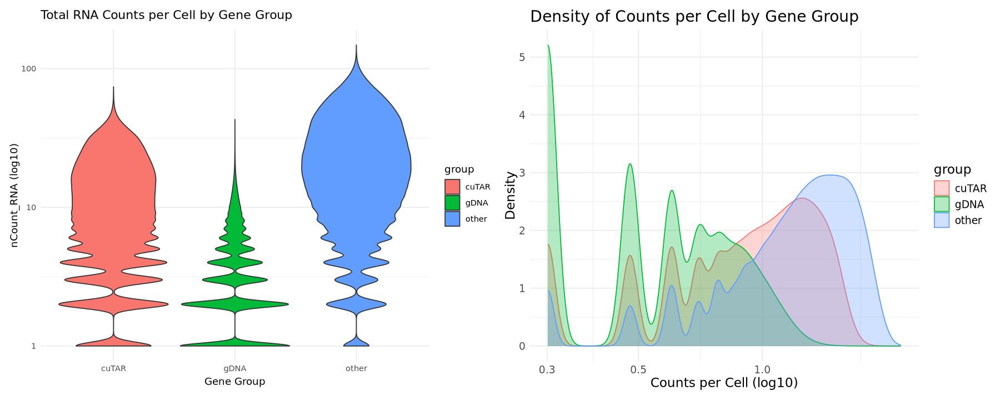

In [79]:
plot_gene_groups_density <- function(breast) {
  library(Matrix)
  library(dplyr)
  library(tidyr)
  library(ggplot2)
  library(stringr)  # for str_starts()

  counts <- GetAssayData(breast, layer = "counts")
  gene_names <- rownames(counts)

  gene_group <- case_when(
    str_starts(gene_names, "gDNA") ~ "gDNA",
    str_starts(gene_names, "cuTAR") ~ "cuTAR",
    TRUE ~ "other"
  )

  group_df <- data.frame(
    gene = gene_names,
    group = gene_group
  )

  gDNA_genes <- group_df %>% filter(group == "gDNA" & gene != "gDNA5") %>% pull(gene)
  
  # Exclude cuTAR170802 from cuTAR genes
  cuTAR_genes <- group_df %>% filter(group == "cuTAR" & gene != "cuTAR170802") %>% pull(gene)
  
  other_genes <- group_df %>% filter(group == "other") %>% pull(gene)

  cell_counts <- data.frame(
    cell = colnames(counts),
    gDNA = Matrix::colSums(counts[gDNA_genes, , drop = FALSE]),
    cuTAR = Matrix::colSums(counts[cuTAR_genes, , drop = FALSE]),
    other = Matrix::colSums(counts[other_genes, , drop = FALSE])
  )

  cell_counts_long <- pivot_longer(cell_counts, cols = c("gDNA", "cuTAR", "other"),
                                   names_to = "group", values_to = "count")

  v <- ggplot(cell_counts_long, aes(x = group, y = count, fill = group)) +
    geom_violin(scale = "width", trim = TRUE) +
    scale_y_log10() +
    labs(
      title = "Total RNA Counts per Cell by Gene Group",
      x = "Gene Group",
      y = "nCount_RNA (log10)"
    ) +
    theme_minimal()

  d <- ggplot(cell_counts_long, aes(x = log10(count), color = group, fill = group)) +
    geom_density(alpha = 0.3, adjust = 1.5) +
    scale_x_log10() +
    labs(title = "Density of Counts per Cell by Gene Group",
         x = "Counts per Cell (log10)", y = "Density") +
    theme_minimal() +
    theme(text = element_text(size = 14))

  options(repr.plot.width = 15, repr.plot.height = 6)

  return(list(violin_plot = v, density_plot = d))
}


#CRC<-readRDS("mel/clean-data/xenium_spatial_CRC_LT.rds")
plots <- plot_gene_groups_density(CRC)
plots$violin_plot + plots$density_plot


In [29]:
library(Seurat)
library(Matrix)
library(dplyr)
library(tidyr)
library(ggplot2)

plot_all_group_densities <- function(seurat_obj) {
  # Get counts from the default assay
  counts <- GetAssayData(seurat_obj, assay = "Xenium", layer = "counts")
  gene_names <- rownames(counts)
  
  # Classify genes into groups
  gene_group <- case_when(
    startsWith(gene_names, "gDNA") ~ "gDNA",
    startsWith(gene_names, "cuTAR") ~ "cuTAR",
    TRUE ~ "other"
  )
  
  group_df <- data.frame(
    gene = gene_names,
    group = gene_group
  )
  
  # Get gene lists per group
  gDNA_genes <- group_df %>% filter(group == "gDNA") %>% pull(gene)
  cuTAR_genes <- group_df %>% filter(group == "cuTAR") %>% pull(gene)
  other_genes <- group_df %>% filter(group == "other") %>% pull(gene)
  
  # Sum counts per cell from the Xenium assay
  cell_counts <- data.frame(
    cell = colnames(counts),
    gDNA = Matrix::colSums(counts[gDNA_genes, , drop = FALSE]),
    cuTAR = Matrix::colSums(counts[cuTAR_genes, , drop = FALSE]),
    other = Matrix::colSums(counts[other_genes, , drop = FALSE])
  )
  
  # Add negative control counts from ControlCodeword assay
  if ("ControlCodeword" %in% names(seurat_obj@assays)) {
    neg_ctrl_counts <- Matrix::colSums(GetAssayData(seurat_obj, assay = "ControlCodeword", layer = "counts"))
    cell_counts$neg_control <- neg_ctrl_counts
  } else {
    warning("ControlCodeword assay not found in object.")
    cell_counts$neg_control <- NA
  }
  
  # Reshape data for plotting
  cell_counts_long <- pivot_longer(cell_counts, 
                                   cols = c("gDNA", "cuTAR", "other", "neg_control"),
                                   names_to = "group", values_to = "count")
  
  # Filter out zero or low counts and compute log
  plot_data <- cell_counts_long %>%
    filter(count > 0) %>%
    mutate(count_log = log10(count + 1))  # log10(count + 1) avoids log(0)

  # Violin plot
  v <- ggplot(plot_data, aes(x = group, y = count_log, fill = group)) +
    geom_violin(scale = "width", trim = TRUE) +
    labs(
      title = "Total RNA Counts per Cell by Gene Group (Log10 Scale)",
      x = "Gene Group",
      y = "Log10(Counts + 1)"
    ) +
    theme_minimal()

  # Density plot
  d <- ggplot(plot_data, aes(x = count_log, color = group, fill = group)) +
    geom_density(alpha = 0.3, adjust = 1.5) +
    labs(
      title = "Density of Counts per Cell by Gene Group (Filtered, Log10 Scale)",
      x = "Log10(Counts + 1)",
      y = "Density"
    ) +
    theme_minimal()

  return(list(violin_plot = v, density_plot = d))
}


In [ ]:
# BRRIAR

Warning message:
“package ‘reshape2’ was built under R version 4.4.1”

Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths


Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's fill values.”
Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's fill values.”
Warning message:
“No shared levels found between `names(values)` of the manual scale and the
data's fill values.”


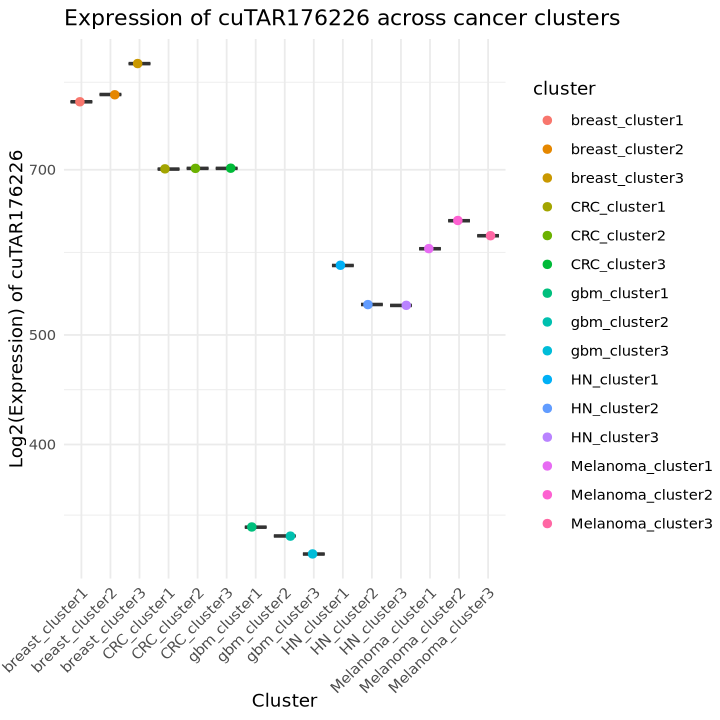

In [31]:
library(ggplot2)
library(reshape2)

# Assume `y$counts` contains the gene expression data with the gene names as rows and clusters as columns.
# Extract the expression of gene cuTAR176226
gene <- "cuTAR176226"

# Extract counts for the gene of interest
gene_counts <- y$counts[gene, ]

# Step 1: Convert to a DataFrame
df <- data.frame(
  cluster = colnames(y$counts),  # Cluster names (e.g., breast_cluster1, CRC_cluster1, etc.)
  expression = as.numeric(gene_counts)
)

# Step 2: Melt the data to long format for ggplot
df_long <- melt(df, id.vars = "cluster")

# Step 3: Create a boxplot
ggplot(df_long, aes(x = cluster, y = value, fill = cluster)) +
  geom_boxplot() +
  scale_y_log10() +  # Log-scale for better visualization of differences
  labs(
    title = paste("Expression of", gene, "across cancer clusters"),
    x = "Cluster",
    y = paste("Log2(Expression) of", gene)
  ) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  scale_fill_manual(values = c(
    "breast" = "red",
    "CRC" = "blue",
    "gbm" = "green",
    "HN" = "purple",
    "Melanoma" = "orange"
  )) +  # Custom color for each cancer type (adjust if needed)
  geom_jitter(aes(color = cluster), width = 0.2, size = 2)  # Optionally add jitter for visibility


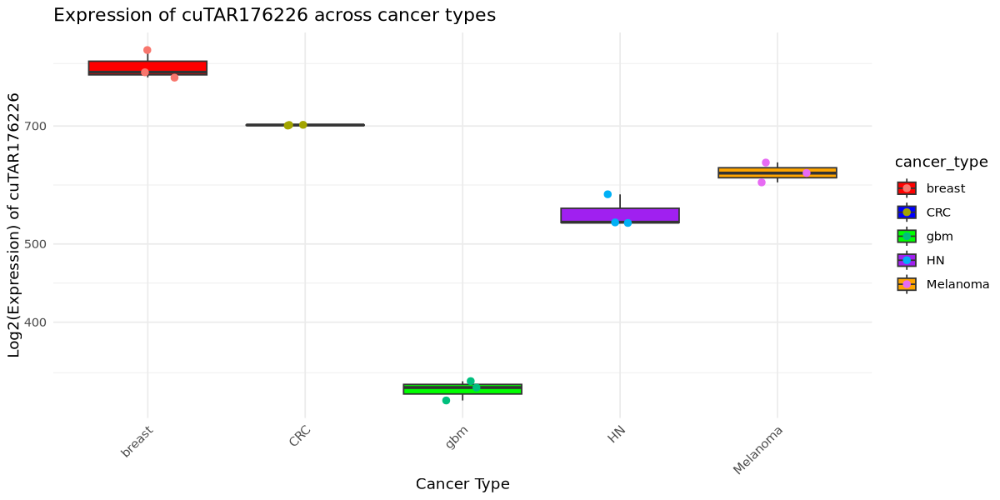

In [34]:
library(ggplot2)
library(reshape2)
library(dplyr)
  options(repr.plot.width = 10, repr.plot.height = 5) # Adjust plot size
# Assume `y$counts` contains the gene expression data with gene names as rows and clusters as columns.
# Extract the counts for the gene of interest
gene <- "cuTAR176226"
gene_counts <- y$counts[gene, ]

# Step 1: Create a DataFrame for expression data
df <- data.frame(
  cluster = colnames(y$counts),  # Cluster names (e.g., breast_cluster1, CRC_cluster1, etc.)
  expression = as.numeric(gene_counts)
)

# Step 2: Create a new column for cancer type (e.g., "breast", "CRC", etc.)
df$cancer_type <- gsub("_cluster[0-9]+", "", df$cluster)  # Remove cluster number to get cancer type

# Step 3: Aggregate expression by cancer type
df_aggregated <- df %>%
  group_by(cancer_type) %>%
  summarize(expression = mean(expression))  # Calculate mean expression for each cancer type

# Step 4: Create the boxplot
ggplot(df, aes(x = cancer_type, y = expression, fill = cancer_type)) +
  geom_boxplot() +
  scale_y_log10() +  # Log-scale for better visualization
  labs(
    title = paste("Expression of", gene, "across cancer types"),
    x = "Cancer Type",
    y = paste("Log2(Expression) of", gene)
  ) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  scale_fill_manual(values = c(
    "breast" = "red",
    "CRC" = "blue",
    "gbm" = "green",
    "HN" = "purple",
    "Melanoma" = "orange"
  )) +  # Customize colors for each cancer type
  geom_jitter(aes(color = cancer_type), width = 0.2, size = 2)  # Optionally add jitter for visibility
